In [1]:
import torch
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from torch import nn, optim
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import datetime
import os
import readligo as rl
from gwpy.timeseries import TimeSeries
import math
import random
from sklearn.metrics import auc

In [11]:
os.chdir('D:\OneDrive - HKUST Connect\Research\GWNMMAD\Codes')

In [2]:
epochs = 200
test_sample_ratio = .2
validation_sample_ratio = 0.1
input_vector_length = 100
batch_size = 32
num_bins = 40
coef_delta = 0

In [3]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(101, 40),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(40, 101),
            nn.Tanh()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded

In [5]:
def normalize(v):
    norm = np.linalg.norm(v)
    junk = 0
    if norm == 0: 
       return v, junk, norm
    return v / norm, junk, norm

In [33]:
def bunch_normalization(v_set):
    recover_min = list(range(len(v_set)))
    recover_coef = list(range(len(v_set)))
    v_set_normalized = np.zeros((v_set.shape[0], v_set.shape[1]))
    for i in range(len(v_set)):
        v_set_normalized[i], recover_min[i], recover_coef[i] = normalize(v_set[i])
    return v_set_normalized, recover_min, recover_coef

In [4]:
def bunch_normalization_complex(v_set):
    recover_min = list(range(len(v_set)))
    recover_coef = list(range(len(v_set)))
    v_set_normalized = np.zeros((v_set.shape[0], v_set.shape[1]))
    for i in range(len(v_set)):
        v_set_normalized[i], recover_min[i], recover_coef[i] = normalize(v_set[i])
    return v_set_normalized, recover_min, recover_coef

In [6]:
def TPR_calculation(noise_distribution, signal_distribution, FPR):
    threshold_rank = len(noise_distribution) * FPR
    threshold = np.partition(noise_distribution, -threshold_rank)[-threshold_rank]
    
    TPR = np.argwhere(signal_distribution > threshold).shape[0] / len(signal_distribution)
    
    return TPR

In [7]:
data_for_training_and_testing = np.load("../Data_cached/4000Hz25msnoisesample.npy") * 1e21

In [6]:
data_for_training_and_testing = np.load("../Data_cached/4000Hz25msnoisesample1e6.npy") * 1e21

In [7]:
data_for_training_and_testing = np.load('E://GWNMMAD_data/Tw_dataset/Datasets/background.npz')['data'][:,0,:] / 20

In [9]:
data_injected = np.delete(np.load("../Data_cached/4000Hz25msdatasampleBBH.npy") * 1e21, 47, axis = 0)

In [10]:
data_injected = np.load("../Data_cached/4000Hz25msdatasampleBBH3346.npy") * 1e21

In [35]:
data_injected =  np.load('../Data_cached/pure_BBH_200_2det_aroundpeakvalue.npy')[:,0,50:150]

In [8]:
data_injected = np.load('E://GWNMMAD_data/Tw_dataset/Datasets/bbh_for_challenge.npy')[:,0,:] / 20

In [9]:
data_sg = np.load('E://GWNMMAD_data/Tw_dataset/Datasets/sglf_for_challenge.npy')[:,0,:] / 20

In [12]:
data_glitch = np.load('../Data_cached/real_glitches_snrlt5_60132_4000Hz_25ms.npz')['strain_time_data'] / 12.3

In [106]:
data_glitch = data_glitch['strain_time_data'][np.argwhere(data_glitch['snr_data'] > 8)]

In [109]:
data_glitch = data_glitch.reshape(-1,200) / 12.3

Text(0.5, 1.0, 'Norm distribution for GWAK noise, BBH and SG sample')

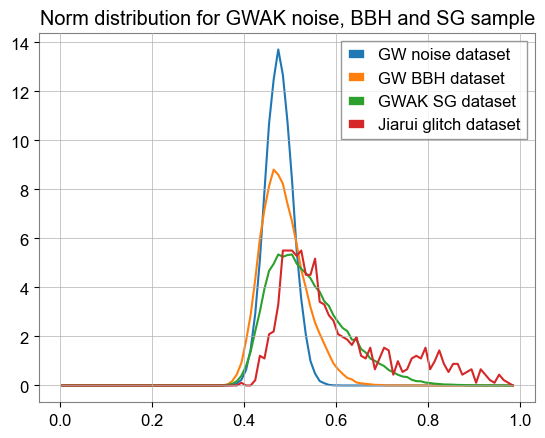

In [110]:
bin_scheme_norm = np.arange(0,1,0.01)

counts_noise_our, bin_position_noise_our = np.histogram(np.linalg.norm(data_for_training_and_testing, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_tw, bin_position_noise_tw = np.histogram(np.linalg.norm(data_injected, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_bbh, bin_position_noise_bbh = np.histogram(np.linalg.norm(data_sg, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_glitch, bin_position_noise_glitch = np.histogram(np.linalg.norm(data_glitch, axis = 1), bins = bin_scheme_norm, density = True)

bin_centers_our = (bin_position_noise_our[:-1] + bin_position_noise_our[1:]) / 2
bin_centers_tw = (bin_position_noise_tw[:-1] + bin_position_noise_tw[1:]) / 2
bin_centers_bbh = (bin_position_noise_bbh[:-1] + bin_position_noise_bbh[1:]) / 2
bin_centers_glitch = (bin_position_noise_glitch[:-1] + bin_position_noise_glitch[1:]) / 2


plt.plot(bin_centers_our, counts_noise_our, label = 'GW noise dataset')
plt.plot(bin_centers_tw, counts_noise_tw, label = 'GW BBH dataset')
plt.plot(bin_centers_bbh, counts_noise_bbh, label = 'GWAK SG dataset')
plt.plot(bin_centers_glitch, counts_noise_glitch, label = 'Jiarui glitch dataset')

plt.legend()
plt.title('Norm distribution for GWAK noise, BBH and SG sample')


Text(0.5, 1.0, 'Norm distribution for GWAK noise, BBH and SG sample')

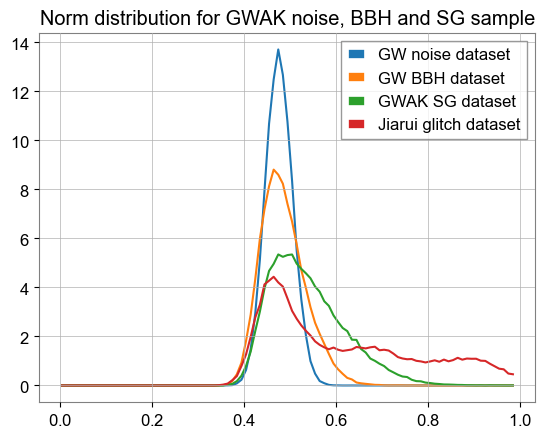

In [13]:
bin_scheme_norm = np.arange(0,1,0.01)

counts_noise_our, bin_position_noise_our = np.histogram(np.linalg.norm(data_for_training_and_testing, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_tw, bin_position_noise_tw = np.histogram(np.linalg.norm(data_injected, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_bbh, bin_position_noise_bbh = np.histogram(np.linalg.norm(data_sg, axis = 1), bins = bin_scheme_norm, density = True)
counts_noise_glitch, bin_position_noise_glitch = np.histogram(np.linalg.norm(data_glitch, axis = 1), bins = bin_scheme_norm, density = True)

bin_centers_our = (bin_position_noise_our[:-1] + bin_position_noise_our[1:]) / 2
bin_centers_tw = (bin_position_noise_tw[:-1] + bin_position_noise_tw[1:]) / 2
bin_centers_bbh = (bin_position_noise_bbh[:-1] + bin_position_noise_bbh[1:]) / 2
bin_centers_glitch = (bin_position_noise_glitch[:-1] + bin_position_noise_glitch[1:]) / 2


plt.plot(bin_centers_our, counts_noise_our, label = 'GW noise dataset')
plt.plot(bin_centers_tw, counts_noise_tw, label = 'GW BBH dataset')
plt.plot(bin_centers_bbh, counts_noise_bbh, label = 'GWAK SG dataset')
plt.plot(bin_centers_glitch, counts_noise_glitch, label = 'Jiarui glitch dataset')

plt.legend()
plt.title('Norm distribution for GWAK noise, BBH and SG sample')


### Below are to do a RealFFT and to see what will happen

In [14]:
data_for_training_and_testing_fft = np.fft.rfft(data_for_training_and_testing)

In [39]:
np.abs(data_for_training_and_testing_fft)

array([[2.99796619e-02, 7.16098785e-02, 6.23444438e-01, ...,
        1.74144782e-02, 1.74179773e-02, 1.74191422e-02],
       [6.21774630e-02, 1.92643805e-01, 5.29816545e-01, ...,
        4.04160640e-02, 4.03549100e-02, 4.03346004e-02],
       [1.32157061e-01, 2.71370658e-01, 2.21925861e-01, ...,
        6.62371868e-04, 3.91588882e-04, 2.43944704e-04],
       ...,
       [1.50086476e-01, 2.71113428e-01, 4.00973326e-01, ...,
        1.92989367e-03, 1.77163447e-03, 1.71671255e-03],
       [2.82362055e-02, 2.64309728e-02, 4.29161315e-01, ...,
        7.77535551e-03, 7.66642053e-03, 7.63009509e-03],
       [6.74575155e-02, 8.24350217e-02, 5.30838118e-01, ...,
        9.75896653e-02, 9.74164940e-02, 9.73589537e-02]])

In [15]:
data_injected_fft = np.fft.rfft(data_injected)

In [16]:
data_sg_fft = np.fft.rfft(data_sg)
data_glitches_fft = np.fft.rfft(data_glitch)

C:\Users\Liyang Miao\AppData\Local\Programs\Python\Python311\Lib\site-packages\matplotlib\cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
C:\Users\Liyang Miao\AppData\Local\Programs\Python\Python311\Lib\site-packages\matplotlib\cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


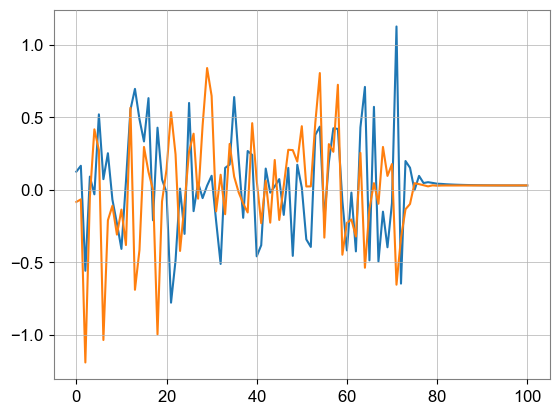

In [12]:
plt.plot(data_for_training_and_testing_fft[10])
plt.plot(data_injected_fft[10])

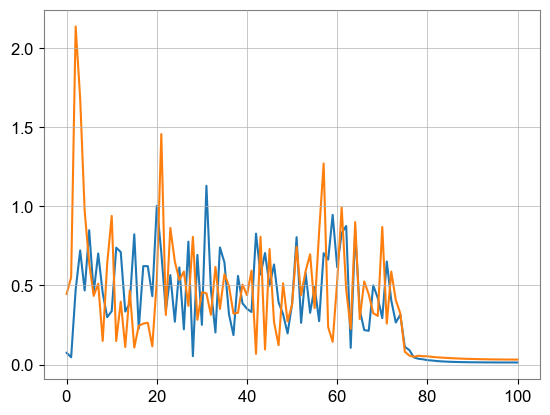

In [181]:
plt.plot(np.abs(data_for_training_and_testing_fft[200]))
plt.plot(np.abs(data_injected_fft[200]))

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\656361006.py:1: DeprecationWarning: This function is deprecated. Please call randint(1, 100000 + 1) instead
  indice = np.random.random_integers(1, 100000, 1)[0]


Text(0, 0.5, 'Modulus of amplitude')

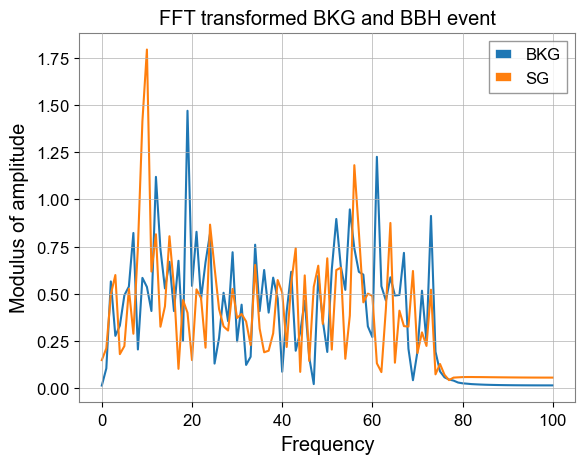

In [180]:
indice = np.random.random_integers(1, 100000, 1)[0]

plt.title('FFT transformed BKG and BBH event')
plt.plot(np.abs(data_for_training_and_testing_fft[indice]), label = 'BKG')
# plt.plot(np.abs(data_injected_fft[500]), label = 'BBH')
plt.plot(np.abs(data_sg_fft[indice]), label = 'SG')
# plt.plot(np.abs(data_glitches_fft[500]), label = 'glitches')
plt.legend()
plt.xlabel('Frequency')
plt.ylabel('Modulus of amplitude')

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\4245819379.py:1: DeprecationWarning: This function is deprecated. Please call randint(1, 100000 + 1) instead
  indice = np.random.random_integers(1, 100000, 1)[0]


5987

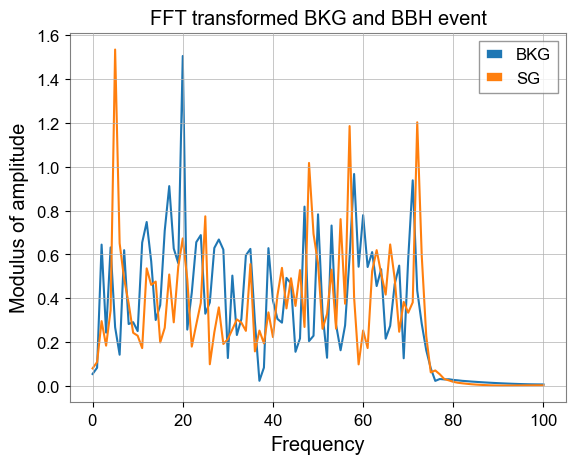

In [181]:
indice = np.random.random_integers(1, 100000, 1)[0]

plt.title('FFT transformed BKG and BBH event')
plt.plot(np.abs(data_for_training_and_testing_fft[indice]), label = 'BKG')
# plt.plot(np.abs(data_injected_fft[500]), label = 'BBH')
plt.plot(np.abs(data_sg_fft[indice]), label = 'SG')
# plt.plot(np.abs(data_glitches_fft[500]), label = 'glitches')
plt.legend()
plt.xlabel('Frequency')
plt.ylabel('Modulus of amplitude')
indice

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\4245819379.py:1: DeprecationWarning: This function is deprecated. Please call randint(1, 100000 + 1) instead
  indice = np.random.random_integers(1, 100000, 1)[0]


31144

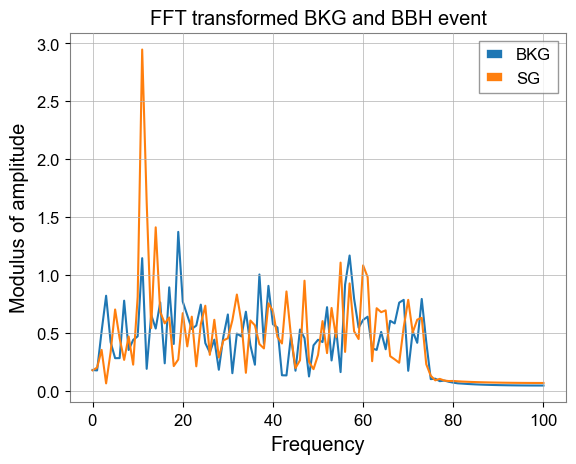

In [182]:
indice = np.random.random_integers(1, 100000, 1)[0]

plt.title('FFT transformed BKG and BBH event')
plt.plot(np.abs(data_for_training_and_testing_fft[indice]), label = 'BKG')
# plt.plot(np.abs(data_injected_fft[500]), label = 'BBH')
plt.plot(np.abs(data_sg_fft[indice]), label = 'SG')
# plt.plot(np.abs(data_glitches_fft[500]), label = 'glitches')
plt.legend()
plt.xlabel('Frequency')
plt.ylabel('Modulus of amplitude')
indice

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_30876\3921965078.py:1: DeprecationWarning: This function is deprecated. Please call randint(1, 100000 + 1) instead
  indice = np.random.random_integers(1, 100000, 1)[0]


36305

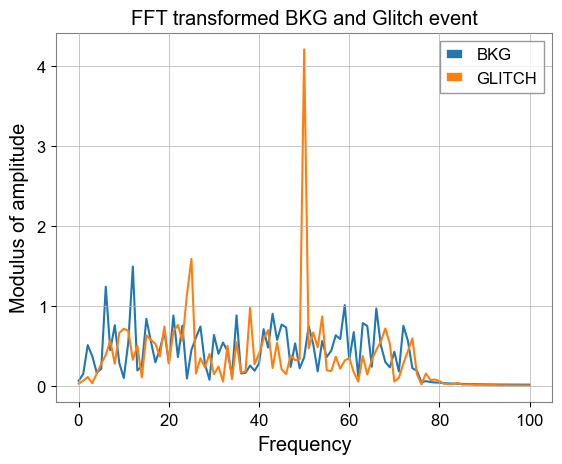

In [17]:
indice = np.random.random_integers(1, 100000, 1)[0]

plt.title('FFT transformed BKG and Glitch event')
plt.plot(np.abs(data_for_training_and_testing_fft[indice]), label = 'BKG')
# plt.plot(np.abs(data_injected_fft[500]), label = 'BBH')
plt.plot(np.abs(data_glitches_fft[indice]), label = 'GLITCH')
# plt.plot(np.abs(data_glitches_fft[500]), label = 'glitches')
plt.legend()
plt.xlabel('Frequency')
plt.ylabel('Modulus of amplitude')
indice

In [ ]:
indice = np.random.random_integers(1, 100000, 1)[0]

plt.title('FFT transformed BKG and BBH event')
plt.plot(np.abs(data_for_training_and_testing_fft[indice]), label = 'BKG')
# plt.plot(np.abs(data_injected_fft[500]), label = 'BBH')
plt.plot(np.abs(data_sg_fft[indice]), label = 'SG')
# plt.plot(np.abs(data_glitches_fft[500]), label = 'glitches')
plt.legend()
plt.xlabel('Frequency')
plt.ylabel('Modulus of amplitude')
indice

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\2945933920.py:4: DeprecationWarning: This function is deprecated. Please call randint(1, 100000 + 1) instead
  indice = np.random.random_integers(1, 100000, 1)[0]


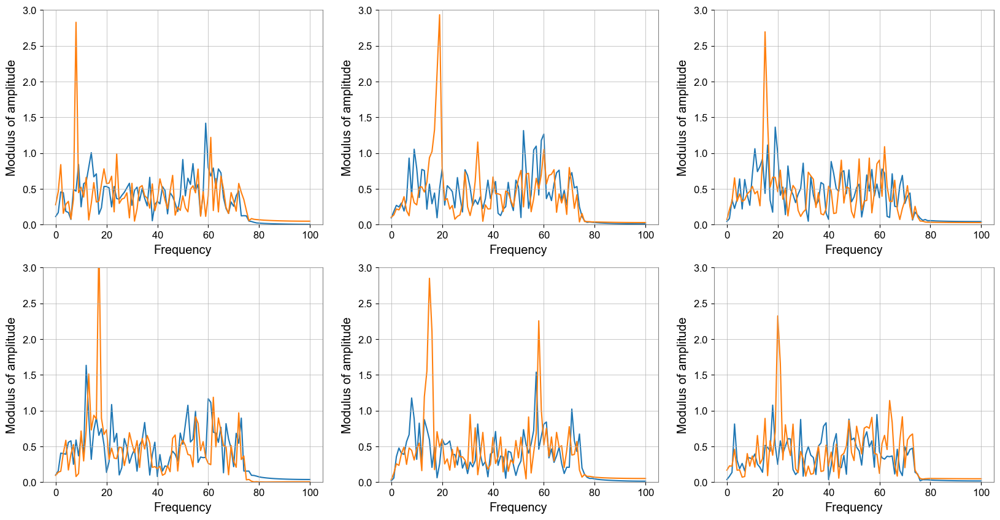

In [186]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

for i in range(6):
    indice = np.random.random_integers(1, 100000, 1)[0]
    # plt.title('FFT transformed BKG and BBH event')
    axes[i//3, i % 3].plot(np.abs(data_for_training_and_testing_fft[indice]), label = 'BKG')
    # plt.plot(np.abs(data_injected_fft[500]), label = 'BBH')
    axes[i//3, i % 3].plot(np.abs(data_sg_fft[indice]), label = 'SG')
    # plt.plot(np.abs(data_glitches_fft[500]), label = 'glitches')
    # plt.legend()
    axes[i//3, i % 3].set_xlabel('Frequency')
    axes[i//3, i % 3].set_ylabel('Modulus of amplitude')
    axes[i//3, i % 3].set_ylim(0,3)

In [23]:
data_for_training_and_testing = np.abs(data_for_training_and_testing_fft[:,0:100])

In [24]:
data_injected = np.abs(data_injected_fft[:,0:100])

In [25]:
data_sg = np.abs(data_sg_fft[:,0:100])
data_glitch = np.abs(data_glitches_fft[:,0:100])

In [32]:
data_for_training_and_testing[0]

array([0.00299797, 0.00716099, 0.06234444, 0.0179036 ,
       0.04248823, 0.07706174, 0.01174854, 0.0185406 ,
       0.09464105, 0.02898845, 0.05396016, 0.1061934 ,
       0.05276659, 0.05350681, 0.03495369, 0.07246115,
       0.12855665, 0.03841911, 0.02359086, 0.02367868,
       0.05258238, 0.02595558, 0.06005197, 0.1041821 ,
       0.04338904, 0.05695717, 0.10327664, 0.03291156,
       0.03504665, 0.06664255, 0.0397679 , 0.0152369 ,
       0.03383726, 0.01633527, 0.0383214 , 0.04107819,
       0.0570425 , 0.04632483, 0.05444901, 0.01991575,
       0.01727962, 0.05597298, 0.04202116, 0.02774026,
       0.05395729, 0.01105157, 0.06648258, 0.02505903,
       0.05462123, 0.03384966, 0.08925221, 0.0175525 ,
       0.03257777, 0.02852776, 0.04387451, 0.04169384,
       0.17059668, 0.09317478, 0.07988573, 0.13487277,
       0.01539682, 0.03351177, 0.10659446, 0.04914811,
       0.0478207 , 0.02504287, 0.07005659, 0.04067384,
       0.07949901, 0.05657058, 0.03542167, 0.04824764,
       0.0

(array([0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 6.000e+00,
        1.800e+01, 4.500e+01, 1.210e+02, 2.210e+02, 4.560e+02,
        7.290e+02, 1.135e+03, 1.594e+03, 1.910e+03, 2.375e+03,
        2.470e+03, 2.593e+03, 2.421e+03, 2.333e+03, 2.064e+03,
        1.780e+03, 1.577e+03, 1.423e+03, 1.294e+03, 1.182e+03,
        1.051e+03, 9.670e+02, 9.000e+02, 8.590e+02, 8.900e+02,
        8.450e+02, 8.290e+02, 8.260e+02, 8.540e+02, 9.060e+02,
        8.950e+02, 8.720e+02, 9.050e+02, 9.130e+02, 8.430e+02,
        8.400e+02, 8.300e+02, 7.520e+02, 6.670e+02, 6.460e+02,
        6.180e+02, 6.220e+02, 5.820e+02, 5.740e+02, 5.4

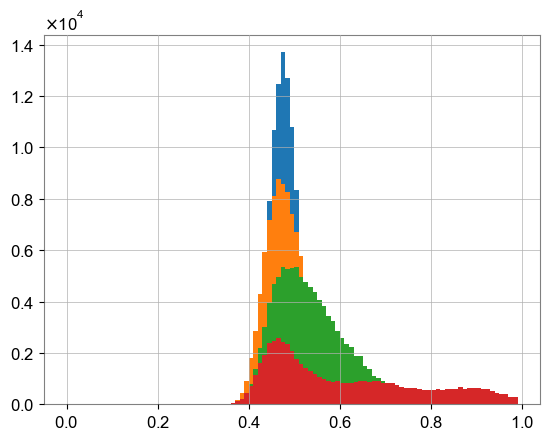

In [29]:
plt.hist(np.linalg.norm(data_for_training_and_testing, axis = 1), bins = np.arange(0,1,1/100))
plt.hist(np.linalg.norm(data_injected, axis = 1), bins = np.arange(0,1,1/100))
plt.hist(np.linalg.norm(data_sg, axis = 1), bins = np.arange(0,1,1/100))
plt.hist(np.linalg.norm(data_glitch, axis = 1), bins = np.arange(0,1,1/100))

(array([0.        , 0.        , 0.        , 0.        ,
        0.00422619, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ,
        0.00845237, 0.01690474, 0.01267856, 0.01690474,
        0.04226185, 0.02535711, 0.07607134, 0.0295833 ,
        0.07184515, 0.10988082, 0.10565464, 0.15636886,
        0.19440453, 0.31696391, 0.38458288, 0.4352971 ,
        0.4944637 , 0.57476122, 0.66351111, 0.76071338,
        0.77761812, 0.91285606, 1.01428451, 1.30166512,
        1.46226016, 1.39886738, 1.41154594, 1.79190263,
        1.92714056, 1.87642634, 2.06660468, 2.18

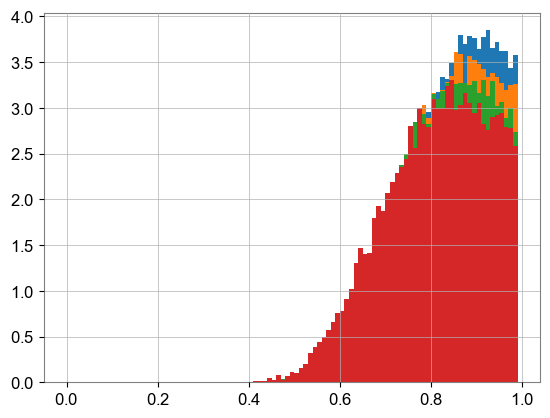

In [22]:
plt.hist(np.max(data_for_training_and_testing_fft, axis = 1), bins = np.arange(0,1,1/100), density = True)
plt.hist(np.max(data_injected_fft, axis = 1), bins = np.arange(0,1,1/100), density = True)
plt.hist(np.max(data_sg_fft, axis = 1), bins = np.arange(0,1,1/100), density = True)
plt.hist(np.max(data_glitches_fft, axis = 1), bins = np.arange(0,1,1/100), density = True)
# plt.hist(np.max(data_for_training_and_testing, axis = 1), bins = np.arange(0,1,1/100), density = True)

In [28]:
data_for_training_and_testing = data_for_training_and_testing / 10
data_injected = data_injected / 10
data_sg = data_sg / 10
data_glitch = data_glitch / 10

In [104]:
data_injected = data_injected / (2 * np.linalg.norm(data_injected, axis = 1).mean())

In [13]:
np.linalg.norm(data_injected, axis = 1).mean()

0.5000000000000002

In [7]:
max(np.linalg.norm(data_for_training_and_testing, axis = 1))

0.6357047581589083

In [13]:
data_injected = data_injected / max(np.linalg.norm(data_injected, axis = 1))

In [14]:
max(np.linalg.norm(data_injected, axis = 1))

0.9999999999999999

In [15]:
np.linalg.norm(data_injected, axis = 1).mean()

0.25265261122680854

In [30]:
total_sample_number = data_for_training_and_testing.shape[0]
test_sample_number = int(test_sample_ratio * total_sample_number)
validation_sample_number = int(validation_sample_ratio * total_sample_number)
train_sample_number = total_sample_number - test_sample_number - validation_sample_number


X_train_ini = data_for_training_and_testing[0:train_sample_number].copy()
X_test_ini = data_for_training_and_testing[-test_sample_number:].copy()
X_validation_ini = data_for_training_and_testing[train_sample_number:-test_sample_number].copy()

In [17]:
np.linalg.norm(X_train_ini, axis = 1).mean()

0.32898130934644215

In [18]:
np.linalg.norm(X_train_ini, axis = 1).mean()

0.32898130934644215

In [19]:
train_glitch_sample = np.load("../Data_cached/glitch_data_clean_25ms.npy")[0:500]

In [20]:
test_glitch_sample = np.load("../Data_cached/glitch_data_highSNR_10_25ms.npy")

In [21]:
test_glitch_sample = test_glitch_sample / max(np.linalg.norm(train_glitch_sample, axis = 1))

In [22]:
train_glitch_sample = train_glitch_sample / max(np.linalg.norm(train_glitch_sample, axis = 1))

In [23]:
max(np.linalg.norm(train_glitch_sample, axis = 1))

0.9999999999999999

In [111]:
max(train_glitch_sample.flatten())

0.6628917094251212

In [24]:
random_integers = np.random.choice(range(7000), size=350, replace=False)

In [25]:
random_integers_2 = np.random.choice(range(2000), size=100, replace=False)

In [26]:
random_integers_3 = np.random.choice(range(1000), size=50, replace=False)

In [27]:
random_integers_3

array([474, 957, 741, 254, 512, 481, 108, 892, 893,  23, 538,
       417, 477, 734, 756, 297, 143, 913, 786, 766, 574, 612,
       506, 408, 817, 346, 583, 899,  29, 528,  15, 310, 166,
       904, 221, 156, 211, 594, 854, 792, 947, 547, 781, 729,
        93, 690, 490, 407, 862, 412])

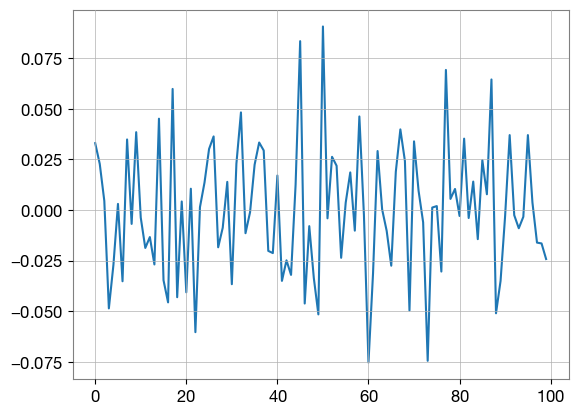

In [124]:
plt.plot(X_validation_ini[181])

In [128]:
random_integers_3.shape

(500,)

In [28]:
X_train_replaced = X_train_ini.copy()
X_train_replaced[random_integers] = train_glitch_sample[0:350]

In [29]:
X_test_replaced = X_test_ini.copy()
X_test_replaced[random_integers_2] = train_glitch_sample[400:500]

In [30]:
X_validation_replaced = X_validation_ini.copy()
X_validation_replaced[random_integers_3] = train_glitch_sample[350:400]

In [31]:
X_validation_replaced.shape

(1000, 100)

In [75]:
# X_train_replaced = train_glitch_sample

In [79]:
# X_train, X_train_recover_min, X_train_recover_coef = bunch_normalization(X_train_replaced)
# X_test, X_test_recover_min, X_test_recover_coef = bunch_normalization(X_test_replaced)
# X_validation, X_validation_recover_min, X_validation_recover_coef = bunch_normalization(X_validation_replaced)
# data_injected_normalized, junk1, junk2 = bunch_normalization(data_injected.copy())

In [78]:
# X_train.shape

(500, 100)

In [32]:
# X_train, X_train_recover_min, X_train_recover_coef = bunch_normalization(X_train_replaced)
# X_test, X_test_recover_min, X_test_recover_coef = bunch_normalization(X_test_replaced)
# X_validation, X_validation_recover_min, X_validation_recover_coef = bunch_normalization(X_validation_replaced)
# data_injected_normalized, junk1, junk2 = bunch_normalization(data_injected.copy())

In [137]:
X_train, X_train_recover_min, X_train_recover_coef = bunch_normalization(X_train_ini)
X_test, X_test_recover_min, X_test_recover_coef = bunch_normalization(X_test_ini)
X_validation, X_validation_recover_min, X_validation_recover_coef = bunch_normalization(X_validation_ini)

In [138]:
X_train.shape

(70000, 100)

In [34]:
X_train, X_train_recover_min, X_train_recover_coef = bunch_normalization(X_train_ini)
X_test, X_test_recover_min, X_test_recover_coef = bunch_normalization(X_test_ini)
X_validation, X_validation_recover_min, X_validation_recover_coef = bunch_normalization(X_validation_ini)
data_injected_normalized, junk1, junk2 = bunch_normalization(data_injected.copy())

In [35]:
X_train = np.hstack((X_train, np.array(X_train_recover_coef).reshape(train_sample_number,1)))
X_validation = np.hstack((X_validation, np.array(X_validation_recover_coef).reshape(validation_sample_number,1)))
X_test = np.hstack((X_test, np.array(X_test_recover_coef).reshape(test_sample_number,1)))
data_injected_normalized = np.hstack((data_injected_normalized, np.array(junk2).reshape(len(data_injected),1)))

In [141]:
X_train.shape

(70000, 101)

In [20]:
# X_train = np.hstack((X_train, np.array(X_train_recover_coef).reshape(train_sample_number,1)))
# X_validation = np.hstack((X_validation, np.array(X_validation_recover_coef).reshape(validation_sample_number,1)))
# X_test = np.hstack((X_test, np.array(X_test_recover_coef).reshape(test_sample_number,1)))
# data_injected_normalized = np.hstack((data_injected_normalized, np.array(X_train_recover_coef)[0:len(data_injected)].reshape(len(data_injected),1)))

In [45]:
# X_train = np.hstack((X_train, np.ones((train_sample_number, 1))))
# X_validation = np.hstack((X_validation, np.ones((validation_sample_number, 1))))
# X_test = np.hstack((X_test, np.ones((test_sample_number, 1))))
# data_injected_normalized = np.hstack((data_injected_normalized, np.ones((len(data_injected), 1))))

In [165]:
np.savez('../Data_cached/uninorm_dataset_cached.npz', train = X_train, validation = X_validation, test = X_test, BBH = data_injected_normalized, SG = data_sinegaussian_normalized, simulated_glitches = data_glitches_normalized, real_glitches = data_glitches_real_normalized)

In [430]:
data_file = np.load('../Data_cached/uninorm_dataset_cached.npz')

In [431]:
X_train, X_test, data_injected_normalized, data_sinegaussian_normalized, data_glitches_normalized, data_glitches_real_normalized = data_file['train'], data_file['test'], data_file['BBH'], data_file['SG'], data_file['simulated_glitches'], data_file['real_glitches']

In [610]:
np.save("../Data_cached/real_BBH_permutated_2.npy", data_injected_normalized)

In [686]:
# X_train = X_train_ini
# X_test = X_test_ini
# X_validation = X_validation_ini

In [161]:
np.linalg.norm(X_train[:,0:100], axis = 1)

array([1., 1., 1., ..., 1., 1., 1.])

In [36]:
trainData = torch.FloatTensor(X_train)
testData = torch.FloatTensor(X_test)
validationData = torch.FloatTensor(X_validation)

In [59]:
X_train_new = np.vstack((X_train, data_glitches_normalized[:int(len(X_train) * 0.034)]))
X_validation_new = np.vstack((X_validation, data_glitches_normalized[int(len(X_train) * 0.034):int(len(X_train) * 0.034)+int(len(X_validation) * 0.034)]))

In [67]:
X_test_new = np.vstack((X_test, data_glitches_normalized[int(len(X_train) * 0.034)+int(len(X_validation) * 0.034):int(len(X_train) * 0.034)+int(len(X_validation) * 0.034)+int(len(X_test) * 0.001)]))

In [69]:
trainData = torch.FloatTensor(X_train_new)
testData = torch.FloatTensor(X_test_new)
validationData = torch.FloatTensor(X_validation_new)

In [62]:
train_dataset = TensorDataset(trainData, trainData)
validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = AutoEncoder().cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.MSELoss().cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        encoded, decoded = autoencoder(x)
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded, x)
        loss_norm = loss_func(decoded[:, -1], x[:, -1])
        weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        for batchidx, (x, _) in enumerate(validationDataLoader):
            x = x.cuda()
            encoded, decoded = autoencoder(x)
            lossVal_overall = loss_func(decoded, x)
            lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
            lossVal = lossVal_overall + lossVal_norm * coef_delta
            val_loss += lossVal.item()

        val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    loss_validation[epoch,0] = val_loss
    print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))

Epoch: 0001, Training loss=0.00199990, Validation loss=0.00208361
Epoch: 0002, Training loss=0.00182387, Validation loss=0.00189867
Epoch: 0003, Training loss=0.00164598, Validation loss=0.00168466
Epoch: 0004, Training loss=0.00153146, Validation loss=0.00152722
Epoch: 0005, Training loss=0.00134797, Validation loss=0.00141773
Epoch: 0006, Training loss=0.00132421, Validation loss=0.00132950
Epoch: 0007, Training loss=0.00132388, Validation loss=0.00128012
Epoch: 0008, Training loss=0.00127235, Validation loss=0.00124990
Epoch: 0009, Training loss=0.00112060, Validation loss=0.00122741
Epoch: 0010, Training loss=0.00123406, Validation loss=0.00120907
Epoch: 0011, Training loss=0.00115654, Validation loss=0.00119268
Epoch: 0012, Training loss=0.00115888, Validation loss=0.00117769
Epoch: 0013, Training loss=0.00120024, Validation loss=0.00115586
Epoch: 0014, Training loss=0.00111007, Validation loss=0.00113451
Epoch: 0015, Training loss=0.00115580, Validation loss=0.00111852
Epoch: 001

In [63]:
torch.save(autoencoder.cpu(), '../Model_cached/model_101-40-101_rffted_GWAK_noise_abs_0.034_glitches_included.pt')

In [37]:
autoencoder = torch.load('../Model_cached/model_101-20-101_rffted_GWAK_noise_abs.pt')

In [42]:
autoencoder = autoencoder.cpu()

In [ ]:
loss_func()

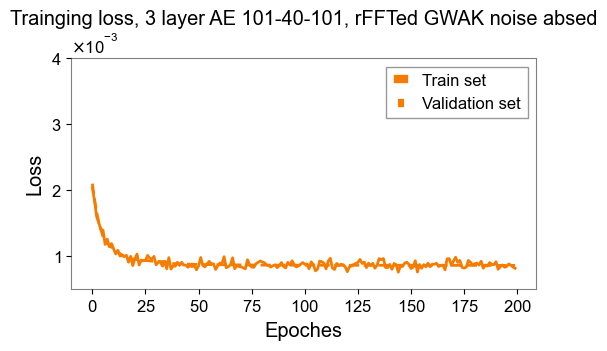

In [188]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 101-40-101, rFFTed GWAK noise absed')
plt.ylim(0.0005,0.004)
plt.legend()
plt.show()

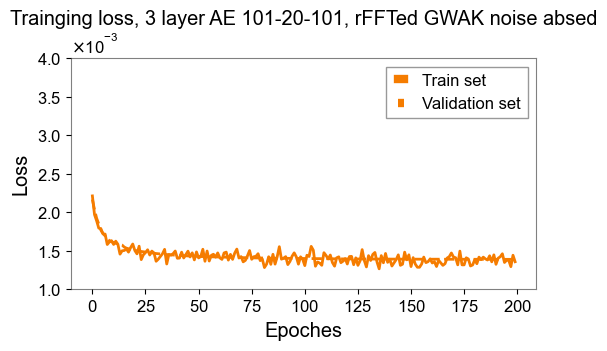

In [168]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 101-20-101, rFFTed GWAK noise absed')
plt.ylim(0.001,0.004)
plt.legend()
plt.show()

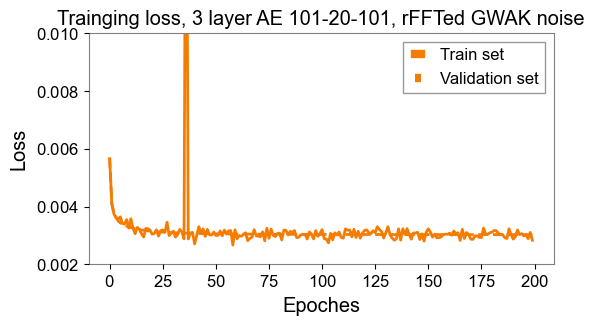

In [129]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 101-20-101, rFFTed GWAK noise')
plt.ylim(0.002,0.01)
plt.legend()
plt.show()

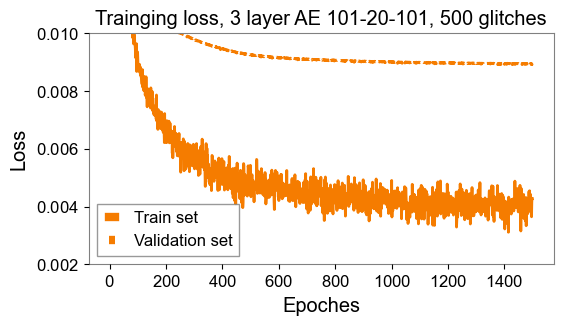

In [94]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 101-20-101, 500 glitches')
plt.ylim(0.002,0.01)
plt.legend()
plt.show()

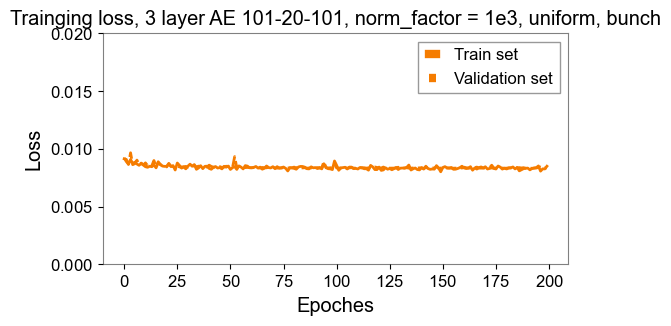

In [503]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 101-20-101, norm_factor = 1e3, uniform, bunch')
plt.ylim(0,0.02)
plt.legend()
plt.show()

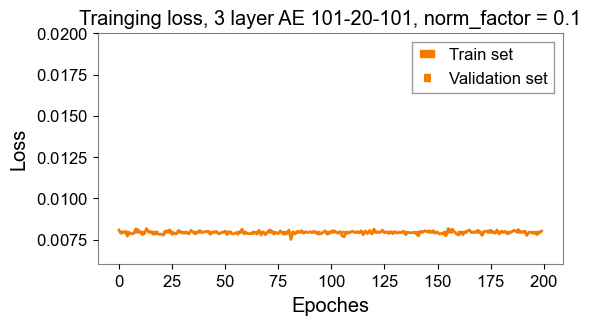

In [160]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 3 layer AE 101-20-101, norm_factor = 0.1')
plt.ylim(0.006,0.02)
plt.legend()
plt.show()

In [64]:
_, decodedTestdata = autoencoder(trainData)
decodedTestdata = decodedTestdata.double()
reconstructedData_train = decodedTestdata.detach().numpy()
ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
MSE_train = ReconstructedError_train.mean()

In [505]:
X_train_output = X_train[:, :100]
reconstructedData_train_output = reconstructedData_train[:, :100]

Text(0, 0.5, 'Strain')

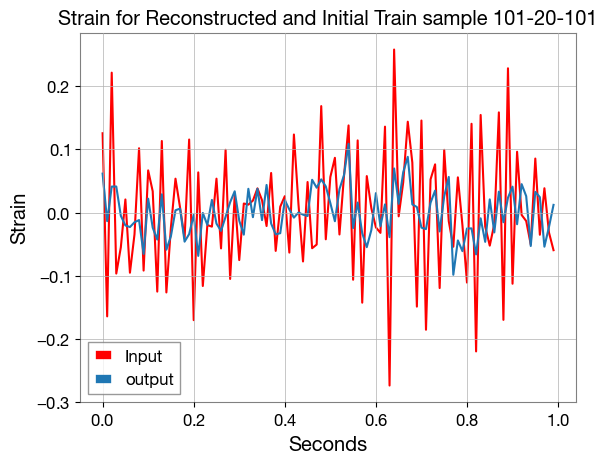

In [92]:
# x = np.arange(0, train_sample_number-1, 1/3)
x = np.arange(0,1,1/100)
y = np.zeros((train_sample_number-1, 3))
# for i in range(train_sample_number-1):
#     y[i] = reconstructedData[i] * X_train_recover_coef + X_train_recover_min
y = reconstructedData_train_output


plt.plot(x, X_train_output[3].flatten(), color = 'red', label = 'Input')
plt.plot(x, y[3].flatten(), label = 'output')
plt.legend()
plt.title('Strain for Reconstructed and Initial Train sample 101-20-101')
plt.xlabel('Seconds')
plt.ylabel('Strain')

Text(0, 0.5, 'Strain')

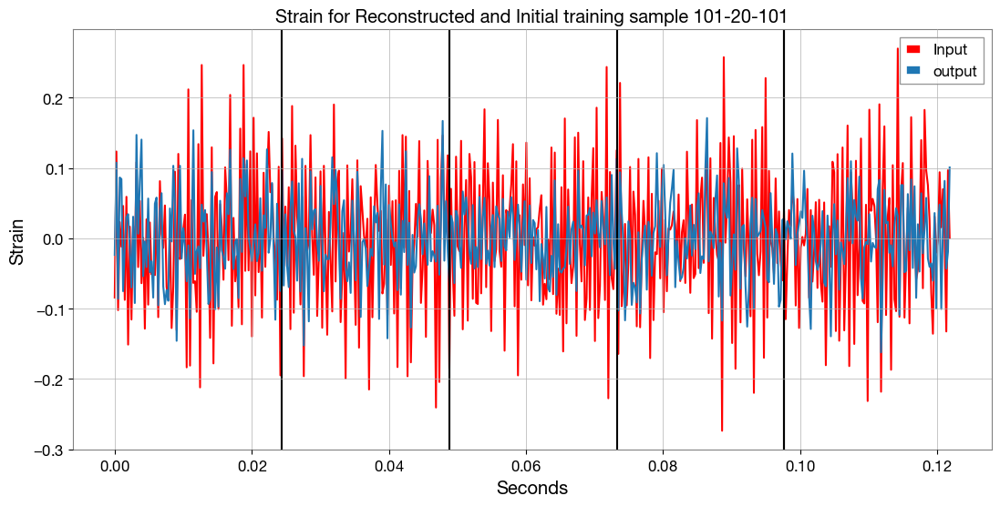

In [24]:
# x = np.arange(0, train_sample_number-1, 1/3)
x = np.arange(0,500/4096,1/4096)
y = np.zeros((train_sample_number-1, 3))
# for i in range(train_sample_number-1):
#     y[i] = reconstructedData[i] * X_train_recover_coef + X_train_recover_min
y = reconstructedData_train_output

plt.figure(figsize=(13,6))
plt.plot(x, X_train_output.flatten()[0:500], color = 'red', label = 'Input')
plt.plot(x, y.flatten()[0:500], label = 'output')
plt.axvline(x = 100/4096, color = 'black')
plt.axvline(x = 200/4096, color = 'black')
plt.axvline(x = 300/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.legend()
plt.title('Strain for Reconstructed and Initial training sample 101-20-101')
plt.xlabel('Seconds')
plt.ylabel('Strain')

In [65]:
ReconstructedError_train_output_100d = np.mean((trainData.numpy()[:, :100] - reconstructedData_train[:, :100])**2, axis = 1)
MSE_train_output_100d = ReconstructedError_train_output_100d.mean()

In [66]:
ReconstructedError_train_output_1d = (trainData.numpy()[:, -1] - reconstructedData_train[:, -1])**2
MSE_train_output_1d = ReconstructedError_train_output_1d.mean()

In [70]:
MSE_train_output

0.0006501258602861813

In [21]:
MSE_train_output

1.3905818556844452e-06

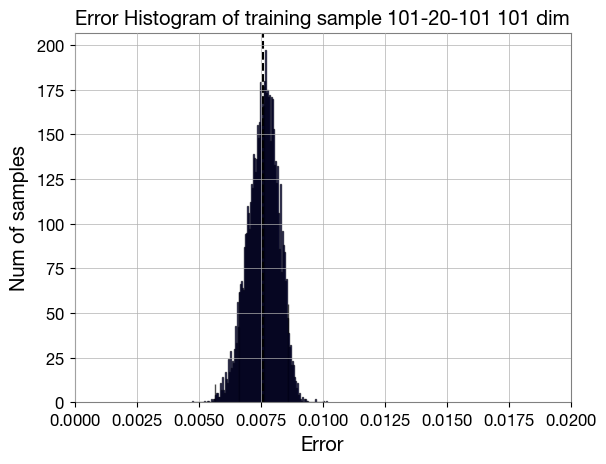

In [30]:
plt.hist(ReconstructedError_train, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of training sample 101-20-101 101 dim')
plt.xlim(0,0.02)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_train, color = 'black', linestyle = '--')
plt.show()

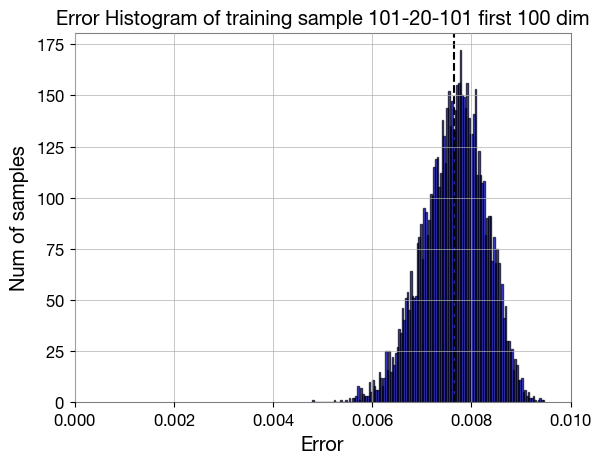

In [31]:
plt.hist(ReconstructedError_train_output, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of training sample 101-20-101 first 100 dim')
plt.xlim(0,0.01)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_train_output, color = 'black', linestyle = '--')
plt.show()

In [32]:
MSE_train_output

0.007648414438642514

In [70]:
_, decodedTestdata = autoencoder(testData)
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()
ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
MSE_test = ReconstructedError_test.mean()

In [37]:
X_test_output = X_test[:, :100]
reconstructedData_test_output = reconstructedData_test[:, :100]

In [71]:
ReconstructedError_test_output_100d = np.mean((testData.numpy()[:, :100] - reconstructedData_test[:, :100])**2, axis = 1)
MSE_test_output_100d = ReconstructedError_test_output_100d.mean()

In [72]:
ReconstructedError_test_output_1d = (testData.numpy()[:, -1] - reconstructedData_test[:, -1])**2
MSE_test_output_1d = ReconstructedError_test_output_1d.mean()

In [73]:
MSE_test_output

0.0006501258602861813

In [22]:
MSE_test_output

1.1928150932025322e-06

Text(0, 0.5, 'Strain')

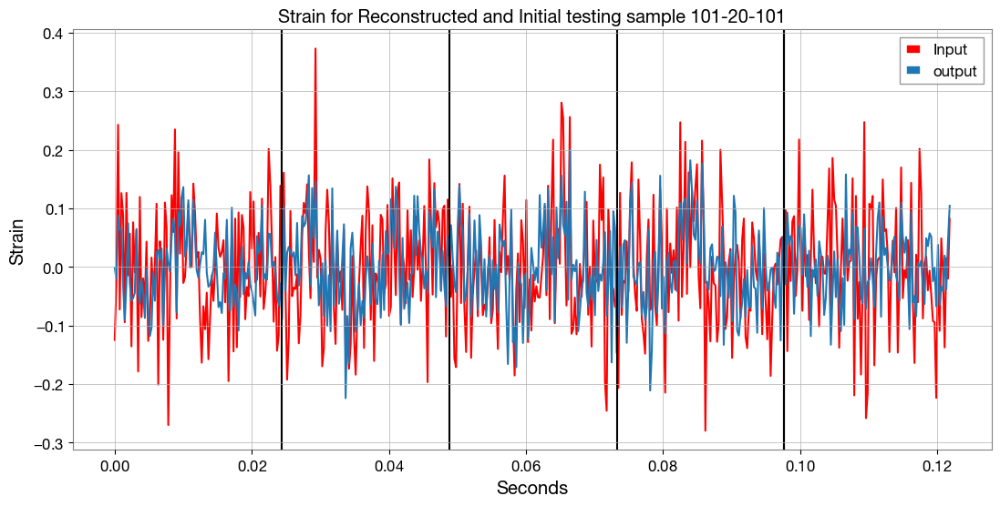

In [32]:
# x = np.arange(0, train_sample_number-1, 1/3)
x = np.arange(0,500/4096,1/4096)
y = np.zeros((train_sample_number-1, 3))
# for i in range(train_sample_number-1):
#     y[i] = reconstructedData[i] * X_train_recover_coef + X_train_recover_min
y = reconstructedData_test_output

plt.figure(figsize=(13,6))
plt.plot(x, X_test_output.flatten()[0:500], color = 'red', label = 'Input')
plt.plot(x, y.flatten()[0:500], label = 'output')
plt.axvline(x = 100/4096, color = 'black')
plt.axvline(x = 200/4096, color = 'black')
plt.axvline(x = 300/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.legend()
plt.title('Strain for Reconstructed and Initial testing sample 101-20-101')
plt.xlabel('Seconds')
plt.ylabel('Strain')

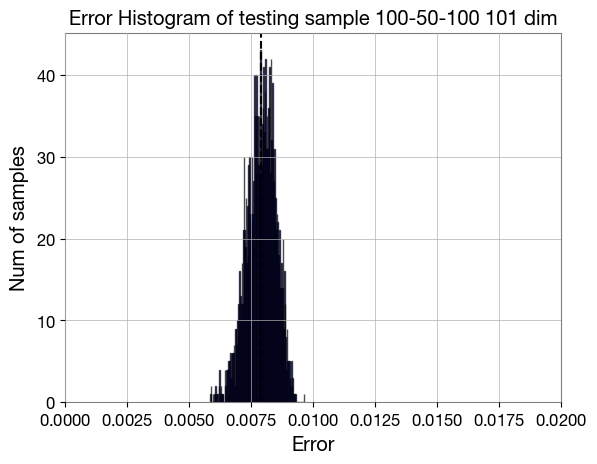

In [63]:
plt.hist(ReconstructedError_test, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of testing sample 100-50-100 101 dim')
plt.xlim(0,0.02)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_test, color = 'black', linestyle = '--')
plt.show()

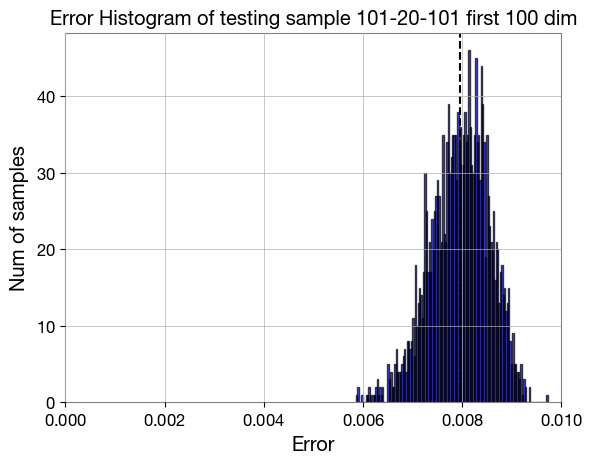

In [64]:
plt.hist(ReconstructedError_test_output, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of testing sample 101-20-101 first 100 dim')
plt.xlim(0,0.01)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_test_output, color = 'black', linestyle = '--')
plt.show()

In [35]:
MSE_test_output

0.008575124618823064

In [104]:
data_injected.shape

(3346, 100)

In [105]:
data_injected_normalized.shape

(3346, 101)

In [132]:
data_injected_normalized = np.hstack((data_injected_normalized, np.ones((199, 1))))

In [452]:
# data_injected =  np.load('E://GWNMMAD_data/Tw_dataset/Datasets/bbh_for_challenge.npy')

In [458]:
data_injected.shape

(100000, 100)

In [457]:
data_injected = data_injected[:,50:150]

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08,
        0.09, 0.1 , 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17,
        0.18, 0.19, 0.2 , 0.21, 0.22, 0.23, 0.24, 0.25, 0.26,
        0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33, 0.34, 0.35,
        0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
        0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53,
        0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62,
        0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
        0.72, 0.73, 0.74, 0.75, 0.76, 0.77

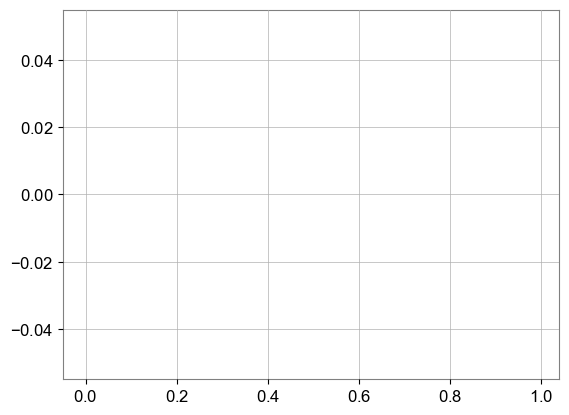

In [659]:
plt.hist(np.linalg.norm(data_injected, axis = 1),bins = np.arange(0,1,0.01))

In [660]:
data_injected_normalized = data_injected / 20

(array([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 1.0000e+00, 1.7000e+01, 7.7000e+01,
        1.8400e+02, 5.8600e+02, 1.3150e+03, 2.4800e+03,
        4.2350e+03, 6.1280e+03, 8.2560e+03, 9.6760e+03,
        1.0368e+04, 1.0009e+04, 9.1450e+03, 8.0920e+03,
        6.7930e+03, 5.3890e+03, 4.2880e+03, 3.2590e+03,
        2.4570e+03, 1.9570e+03, 1.4300e+03, 1.1190e+03,
        8.2300e+02, 5.7400e+02, 4.0600e+02, 2.9800e+02,
        2.2100e+02, 1.3700e+02, 1.0500e+02, 6.7000e+01,
        4.1000e+01, 2.6000e+01, 1.4000e+01, 1.1000e+01,
        4.0000e+00, 2.0000e+00, 2.0000e+00, 3.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.00

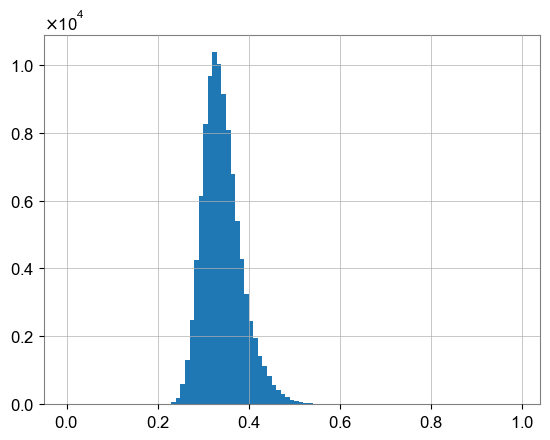

In [661]:
plt.hist(np.linalg.norm(data_injected_normalized, axis = 1), bins = np.arange(0,1,1e-2))

In [594]:
data_injected_normalized, junk1, junk2 = bunch_normalization(data_injected_normalized)
data_injected_normalized = np.hstack((data_injected_normalized, np.array(junk2).reshape(len(data_injected_normalized), -1)))

In [607]:
data_injected_normalized, junk1, junk2 = bunch_normalization(data_injected_normalized)
data_injected_normalized = np.hstack((data_injected_normalized, np.random.permutation(np.array(junk2)).reshape(len(data_injected_normalized), -1)))

In [524]:
data_injected_normalized[:,-1].max()

0.993015144024315

In [595]:
junk2 - data_injected_normalized[:,-1]

array([0., 0., 0., ..., 0., 0., 0.])

In [569]:
junk2 - data_injected_normalized[:,-1]

array([-0.05392889, -0.03388009, -0.00905777, ...,  0.12310347,
        0.00780029,  0.00863407])

(array([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 1.0000e+00, 1.7000e+01, 7.7000e+01,
        1.8400e+02, 5.8600e+02, 1.3150e+03, 2.4800e+03,
        4.2350e+03, 6.1280e+03, 8.2560e+03, 9.6760e+03,
        1.0368e+04, 1.0009e+04, 9.1450e+03, 8.0920e+03,
        6.7930e+03, 5.3890e+03, 4.2880e+03, 3.2590e+03,
        2.4570e+03, 1.9570e+03, 1.4300e+03, 1.1190e+03,
        8.2300e+02, 5.7400e+02, 4.0600e+02, 2.9800e+02,
        2.2100e+02, 1.3700e+02, 1.0500e+02, 6.7000e+01,
        4.1000e+01, 2.6000e+01, 1.4000e+01, 1.1000e+01,
        4.0000e+00, 2.0000e+00, 2.0000e+00, 3.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.00

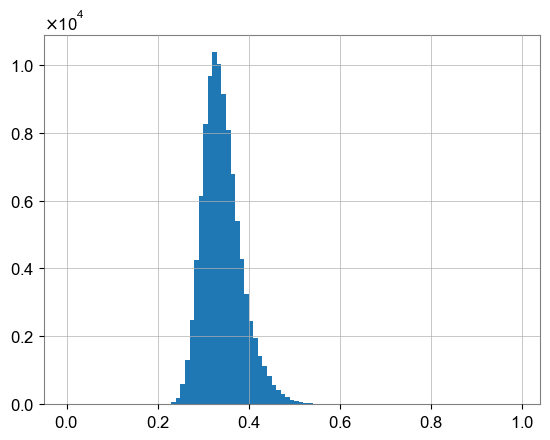

In [609]:
plt.hist(data_injected_normalized[:,-1].flatten(), bins = np.arange(0,1,0.01))

In [73]:
data_injected_tensored = torch.FloatTensor(data_injected_normalized)
_, decodedTestdata = autoencoder(data_injected_tensored)
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()
ReconstructedError_injected = torch.mean((data_injected_tensored - reconstructedData_injected)**2,dim=1)
MSE_injected = ReconstructedError_injected.mean()

In [74]:
ReconstructedError_injected_output_100d = np.mean((data_injected_tensored.numpy()[:, :100] - reconstructedData_injected[:, :100])**2, axis = 1)
MSE_injected_output_100d = ReconstructedError_injected_output_100d.mean()

In [151]:
ReconstructedError_injected_output = (data_injected_tensored.numpy()[:, :100] - reconstructedData_injected[:, :100])**2
MSE_injected_output = ReconstructedError_injected_output.mean()

In [75]:
ReconstructedError_injected_output_1d = (data_injected_tensored.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
MSE_injected_output_1d = ReconstructedError_injected_output_1d.mean()

In [78]:
MSE_injected_output

0.028974691264861414

In [25]:
MSE_injected_output

0.0008165249368716545

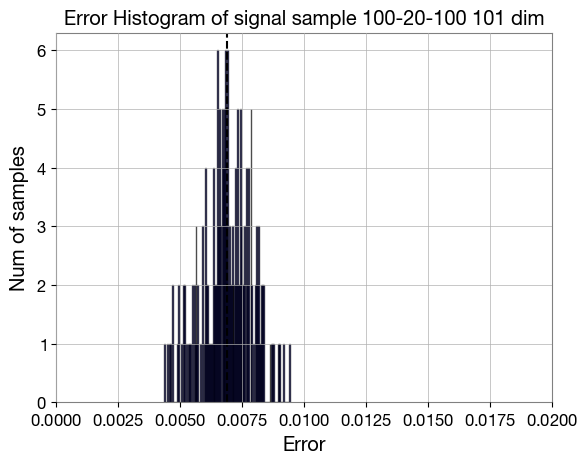

In [35]:
plt.hist(ReconstructedError_injected, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of signal sample 100-20-100 101 dim')
plt.xlim(0,0.02)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_injected, color = 'black', linestyle = '--')
plt.show()

Text(0, 0.5, 'Strain')

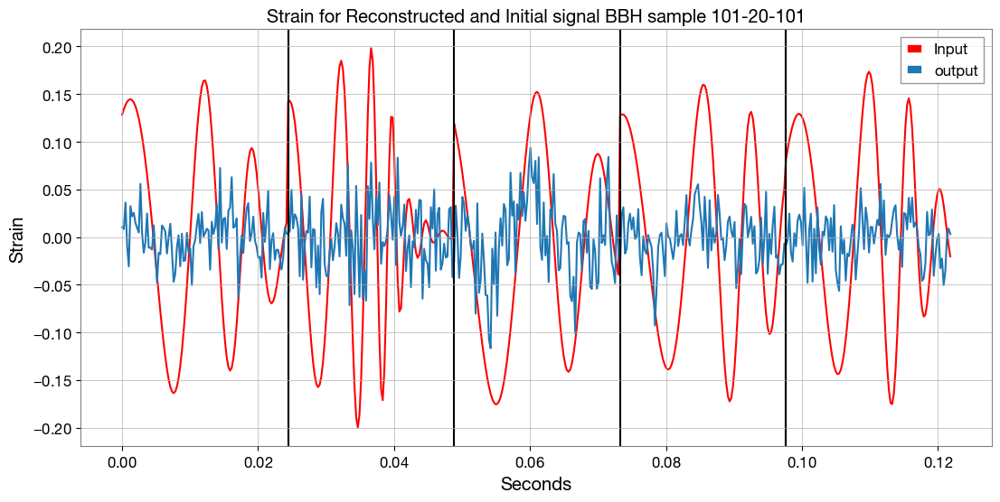

In [89]:
reconstructedData_injected_output = reconstructedData_injected[:, :100]
data_injected_normalized_output = data_injected_normalized[:, :100]
# x = np.arange(0, train_sample_number-1, 1/3)
x = np.arange(0,500/4096,1/4096)
y = np.zeros((train_sample_number-1, 3))
# for i in range(train_sample_number-1):
#     y[i] = reconstructedData[i] * X_train_recover_coef + X_train_recover_min
y = reconstructedData_injected_output

plt.figure(figsize=(13,6))
plt.plot(x, data_injected_normalized_output.flatten()[0:500], color = 'red', label = 'Input')
plt.plot(x, y.flatten()[0:500], label = 'output')
plt.axvline(x = 100/4096, color = 'black')
plt.axvline(x = 200/4096, color = 'black')
plt.axvline(x = 300/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.legend()
plt.title('Strain for Reconstructed and Initial signal BBH sample 101-20-101')
plt.xlabel('Seconds')
plt.ylabel('Strain')

Text(0, 0.5, 'Strain')

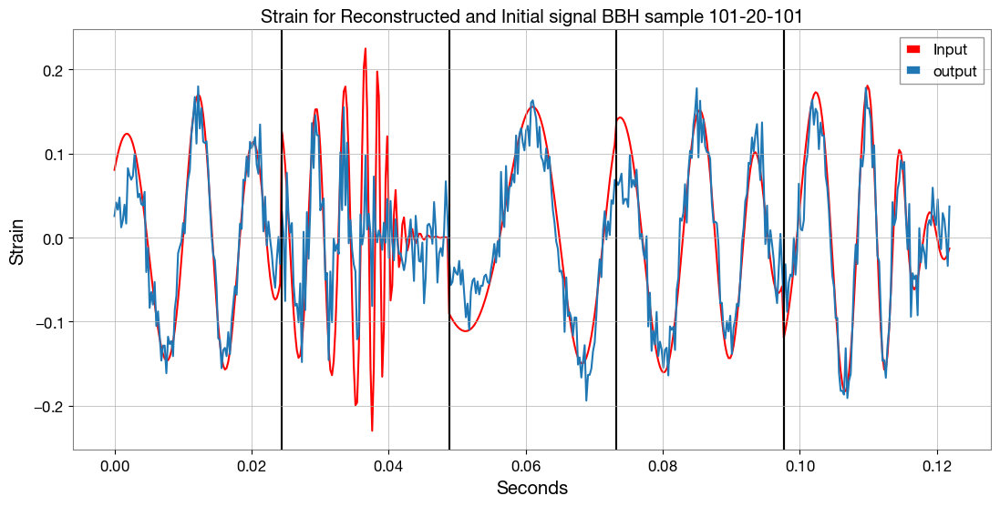

In [84]:
reconstructedData_injected_output = reconstructedData_injected[:, :100]
data_injected_normalized_output = data_injected_normalized[:, :100]
# x = np.arange(0, train_sample_number-1, 1/3)
x = np.arange(0,500/4096,1/4096)
y = np.zeros((train_sample_number-1, 3))
# for i in range(train_sample_number-1):
#     y[i] = reconstructedData[i] * X_train_recover_coef + X_train_recover_min
y = reconstructedData_injected_output

plt.figure(figsize=(13,6))
plt.plot(x, data_injected_normalized_output.flatten()[0:500], color = 'red', label = 'Input')
plt.plot(x, y.flatten()[0:500], label = 'output')
plt.axvline(x = 100/4096, color = 'black')
plt.axvline(x = 200/4096, color = 'black')
plt.axvline(x = 300/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.legend()
plt.title('Strain for Reconstructed and Initial signal BBH sample 101-20-101')
plt.xlabel('Seconds')
plt.ylabel('Strain')

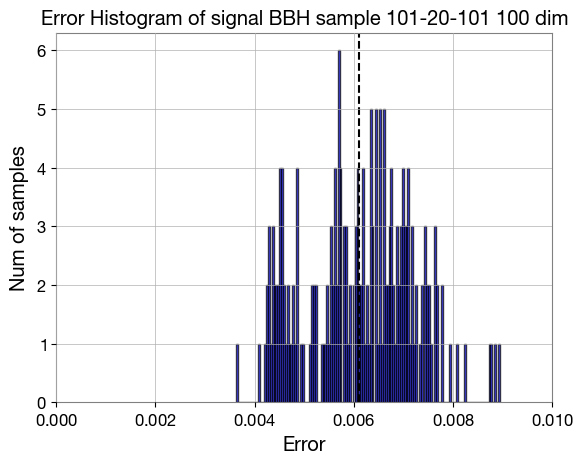

In [135]:
plt.hist(ReconstructedError_injected_output, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of signal BBH sample 101-20-101 100 dim')
plt.xlim(0,0.01)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_injected_output, color = 'black', linestyle = '--')
plt.show()

In [42]:
MSE_injected_output

0.007094492407737541

In [147]:
torch.save(autoencoder, '/Volumes/Research/GWNMMAD_data/Model/101-20-101_nonuniform_glitches_50%_trained/model.pt')

In [410]:
autoencoder = torch.load('../Model_cached/model_101_20_101_uninorm.pt')

In [45]:
data_injected = np.delete(np.load("../Data_cached/4000Hz25msnoise+datasampleBBH.npy"), 47, axis = 0)
data_injected = data_injected / np.linalg.norm(data_injected)
data_injected_normalized, junk1, junk2 = bunch_normalization(data_injected.copy())

AttributeError: 'list' object has no attribute 'reshape'

In [355]:
data_injected_normalized = np.hstack((data_injected_normalized, np.array(X_train_recover_coef[200:399]).reshape(len(data_injected_normalized), 1)))

In [442]:
data_injected_tensored = torch.FloatTensor(data_injected_normalized)
_, decodedTestdata = autoencoder(data_injected_tensored)
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()
ReconstructedError_injected = torch.mean((data_injected_tensored - reconstructedData_injected)**2,dim=1)
MSE_injected = ReconstructedError_injected.mean()

In [59]:
ReconstructedError_injected_output = np.mean((data_injected_tensored.numpy()[:, :100] - reconstructedData_injected[:, :100])**2, axis = 1)
MSE_injected_output = ReconstructedError_injected_output.mean()

In [54]:
ReconstructedError_injected_output = (data_injected_tensored.numpy()[:, -1] - reconstructedData_injected[:, -1])**2
MSE_injected_output = ReconstructedError_injected_output.mean()

In [118]:
max(ReconstructedError_injected_output)

0.040670616990169606

In [119]:
MSE_injected_output

0.0008165249368716545

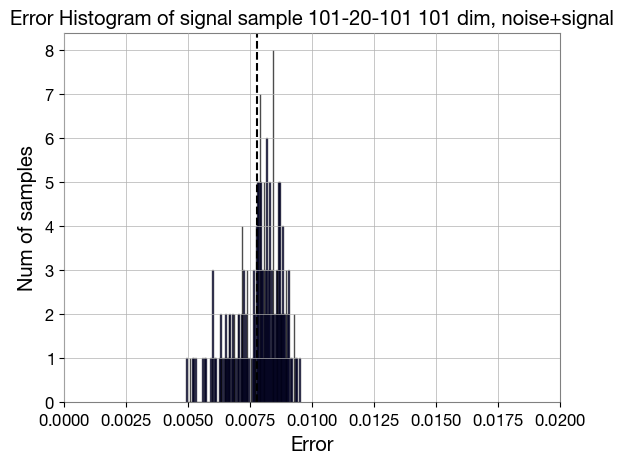

In [49]:
plt.hist(ReconstructedError_injected, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of signal sample 101-20-101 101 dim, noise+signal')
plt.xlim(0,0.02)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_injected, color = 'black', linestyle = '--')
plt.show()

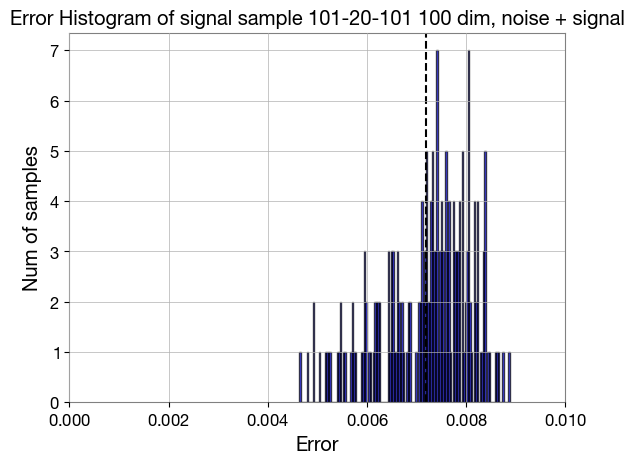

In [50]:
plt.hist(ReconstructedError_injected_output, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of signal sample 101-20-101 100 dim, noise + signal')
plt.xlim(0,0.01)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_injected_output, color = 'black', linestyle = '--')
plt.show()

In [34]:
data_sinegaussian = np.load('../Data_cached/4000Hz25mssampleSG7000.npy')
data_sinegaussian.shape

(7000, 100)

Text(0, 0.5, 'Strain')

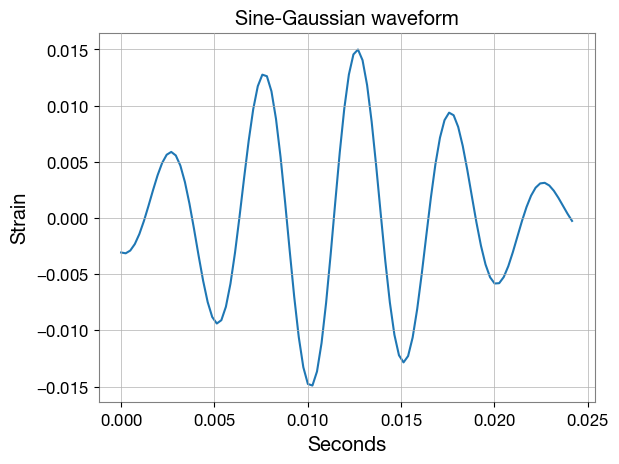

In [90]:
plt.plot(np.arange(0,100/4096, 1/4096), data_sinegaussian[14])
plt.title('Sine-Gaussian waveform')
plt.xlabel('Seconds')
plt.ylabel('Strain')

In [36]:
max(np.linalg.norm(data_sinegaussian, axis = 1))

0.9999999999999999

In [35]:
data_sinegaussian = data_sinegaussian / max(np.linalg.norm(data_sinegaussian, axis = 1))

In [34]:
np.linalg.norm(data_sinegaussian, axis = 1).mean()

0.4724192164490416

In [37]:
data_sinegaussian_normalized, junk3, junk4 = bunch_normalization(data_sinegaussian.copy())

In [47]:
data_sinegaussian_normalized, junk3, junk4 = bunch_normalization(data_sg.copy())

In [48]:
data_sinegaussian_normalized = np.hstack((data_sinegaussian_normalized, np.array(junk4).reshape(len(data_sinegaussian_normalized),1)))

In [39]:
# data_sinegaussian_normalized = np.hstack((data_sinegaussian_normalized, np.array(X_train_recover_coef)[0:len(data_sinegaussian_normalized)].reshape(len(data_sinegaussian_normalized),1)))

In [76]:
data_sinegaussian_tensored = torch.FloatTensor(data_sinegaussian_normalized)
_, decodedTestdata = autoencoder(data_sinegaussian_tensored)
decodedTestdata = decodedTestdata.double()
reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
ReconstructedError_sinegaussian = torch.mean((data_sinegaussian_tensored - reconstructedData_sinegaussian)**2,dim=1)
MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

In [77]:
ReconstructedError_sinegaussian_output_100d = np.mean((data_sinegaussian_tensored.numpy()[:, :100] - reconstructedData_sinegaussian[:, :100])**2, axis = 1)
MSE_sinegaussian_output_100d = ReconstructedError_sinegaussian_output_100d.mean()

In [78]:
ReconstructedError_sinegaussian_output_1d = (data_sinegaussian_tensored.numpy()[:, -1] - reconstructedData_sinegaussian[:, -1])**2
MSE_sinegaussian_output_1d = ReconstructedError_sinegaussian_output_1d.mean()

In [222]:
MSE_sinegaussian_output

0.00190188018920955

In [33]:
MSE_sinegaussian_output

0.002982299292766605

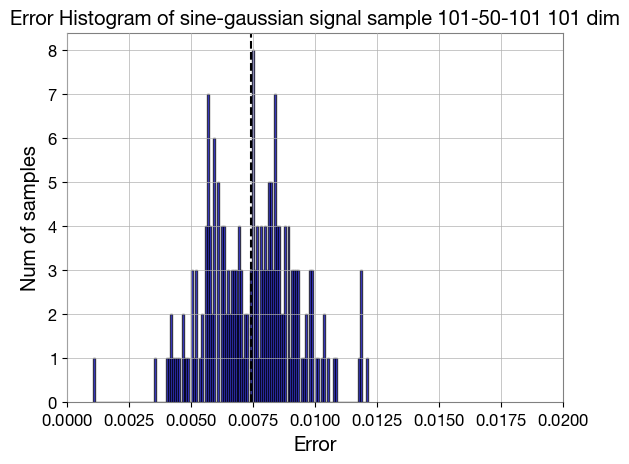

In [46]:
plt.hist(ReconstructedError_sinegaussian, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of sine-gaussian signal sample 101-50-101 101 dim')
plt.xlim(0,0.02)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_sinegaussian, color = 'black', linestyle = '--')
plt.show()

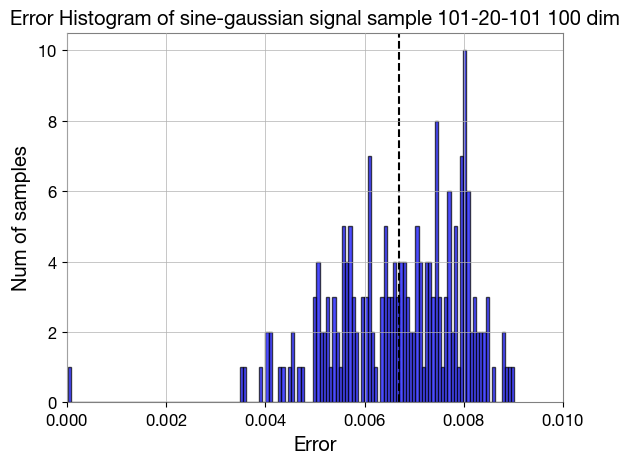

In [47]:
plt.hist(ReconstructedError_sinegaussian_output, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of sine-gaussian signal sample 101-20-101 100 dim')
plt.xlim(0,0.01)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_sinegaussian_output, color = 'black', linestyle = '--')
plt.show()

In [48]:
MSE_sinegaussian_output

0.0066982354932616575

In [88]:
reconstructedData_sinegaussian_output = reconstructedData_sinegaussian[:, :100]
data_sinegaussian_normalized_output = data_sinegaussian_normalized[:, :100]
# x = np.arange(0, train_sample_number-1, 1/3)
x = np.arange(0,500/4096,1/4096)
y = np.zeros((train_sample_number-1, 3))
# for i in range(train_sample_number-1):
#     y[i] = reconstructedData[i] * X_train_recover_coef + X_train_recover_min
y = reconstructedData_sinegaussian_output

plt.figure(figsize=(13,6))
plt.plot(x, data_sinegaussian_normalized_output.flatten()[0:500], color = 'red', label = 'Input')
plt.plot(x, y.flatten()[0:500], label = 'output')
plt.axvline(x = 100/4096, color = 'black')
plt.axvline(x = 200/4096, color = 'black')
plt.axvline(x = 300/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.legend()
plt.title('Strain for Reconstructed and Initial sine-gaussian sample 101-20-101')
plt.xlabel('Seconds')
plt.ylabel('Strain')

NameError: name 'reconstructedData_sinegaussian' is not defined

In [28]:
data_glitches= np.load('../Data_cached/4000Hz25mssampleglitch7000.npy')
data_glitches.shape

(7000, 100)

In [41]:
np.linalg.norm(data_glitches, axis = 1).mean()

0.03711428638867341

Text(0, 0.5, 'Strain')

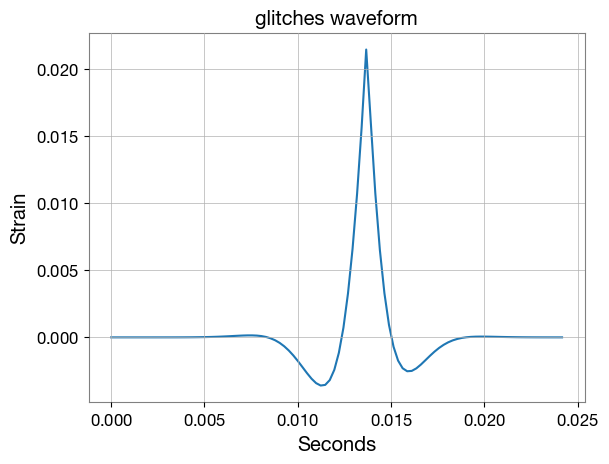

In [93]:
plt.plot(np.arange(0,100/4096, 1/4096), data_glitches[1])
plt.title('glitches waveform')
plt.xlabel('Seconds')
plt.ylabel('Strain')

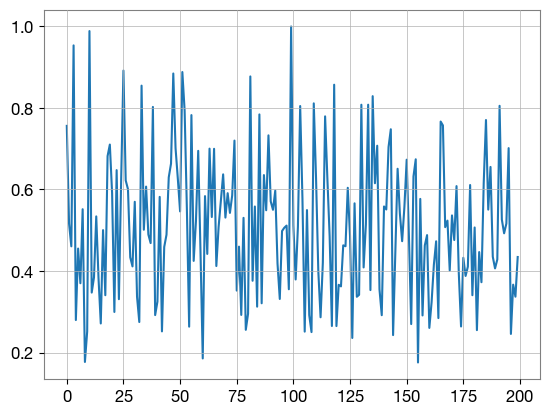

In [276]:
plt.plot(data_glitches_normalized[:,-1])

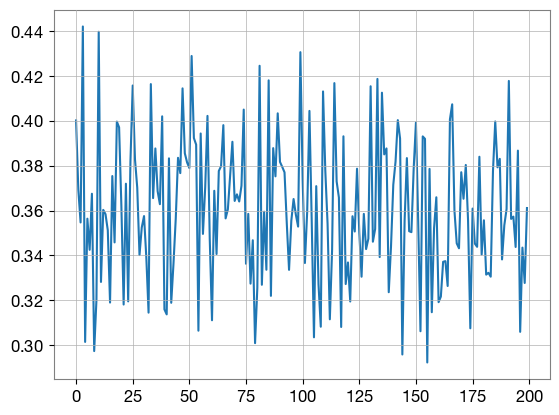

In [283]:
plt.plot(reconstructedData_glitches[:,-1])

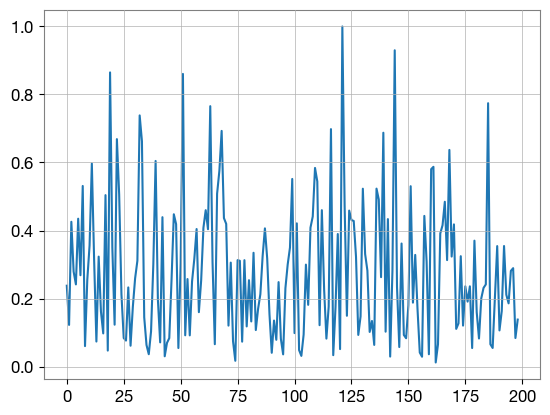

In [277]:
plt.plot(data_injected_normalized[:,-1])

(array([ 6.,  9., 13., 12., 13.,  7.,  7.,  7.,  7.,  4.,  4.,
        10.,  9.,  4.,  7., 14.,  3.,  6.,  1.,  5.,  8.,  8.,
         4.,  2.,  3.,  3.,  3.,  1.,  3.,  3.,  0.,  1.,  1.,
         1.,  3.,  0.,  1.,  0.,  2.,  0.,  0.,  0.,  1.,  1.,
         0.,  0.,  1.,  0.,  0.,  1.]),
 array([0.01188622, 0.03164849, 0.05141077, 0.07117304,
        0.09093532, 0.11069759, 0.13045987, 0.15022215,
        0.16998442, 0.1897467 , 0.20950897, 0.22927125,
        0.24903352, 0.2687958 , 0.28855807, 0.30832035,
        0.32808263, 0.3478449 , 0.36760718, 0.38736945,
        0.40713173, 0.426894  , 0.44665628, 0.46641856,
        0.48618083, 0.50594311, 0.52570538, 0.54546766,
        0.56522993, 0.58499221, 0.60475449, 0.62451676,
        0.64427904, 0.66404131, 0.68380359, 0.70356586,
        0.72332814, 0.74309042, 0.76285269, 0.78261497,
        0.80237724, 0.82213952, 0.84190179, 0.86166407,
        0.88142635, 0.90118862, 0.9209509 , 0.94071317,
        0.96047545, 0.98023772, 1.  

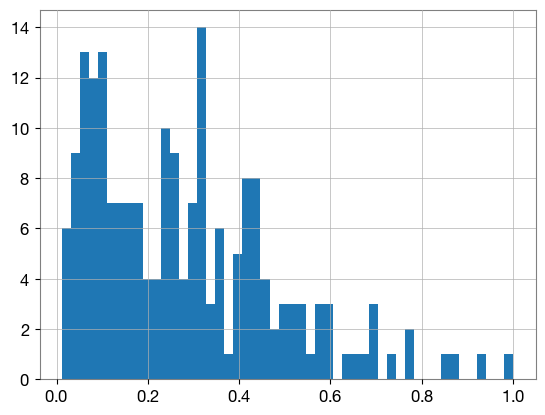

In [318]:
plt.hist(data_injected_normalized[:, -1], bins = 50)

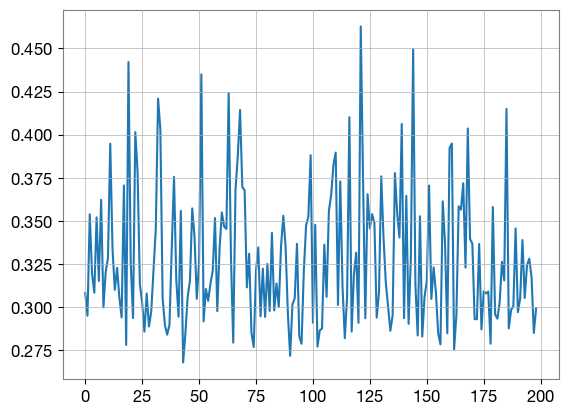

In [284]:
plt.plot(reconstructedData_injected[:,-1])

(array([3.000e+00, 3.000e+00, 2.000e+00, 1.000e+00, 1.000e+00,
        1.000e+00, 1.000e+00, 1.000e+00, 1.000e+00, 0.000e+00,
        1.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 3.000e+00,
        0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 1.000e+00, 1.000e+00, 0.000e+00, 1.000e+00,
        2.000e+00, 1.000e+00, 0.000e+00, 2.000e+00, 4.000e+00,
        1.600e+01, 4.300e+01, 7.600e+01, 1.510e+02, 2.860e+02,
        4.860e+02, 6.800e+02, 8.600e+02, 9.410e+02, 1.004e+03,
        7.890e+02, 6.300e+02, 4.240e+02, 2.870e+02, 1.540e+02,
        7.800e+01, 4.100e+01, 1.600e+01, 4.000e+00, 1.000e+00]),
 array([0.00951257, 0.01773941, 0.02596625, 0.0341931 ,
        0.04241994, 0.05064679, 0.05887363, 0.06710048,
        0.07532732, 0.08355416, 0.09178101, 0.10000785,
        0.1082347 , 0.11646154, 0.12468839, 0.13291523,
        0.14114207, 0.14936892, 0.15759576, 0.16582261,
        0.17404945, 0.1822763 , 0.19050314, 0.19872998,
        0.20695683, 0.21518367, 

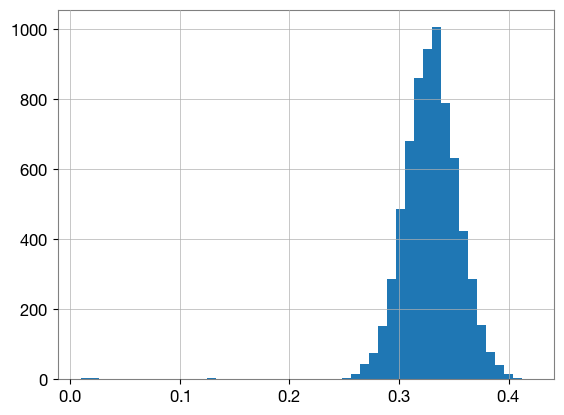

In [316]:
plt.hist(X_train[:,-1], bins = 50)

(array([ 1.,  0.,  0.,  0.,  1.,  0.,  1.,  1.,  0.,  1.,  1.,
         2.,  0.,  2.,  4.,  4.,  3.,  7.,  5.,  5.,  8.,  8.,
         9.,  5.,  8.,  6.,  8.,  5., 11.,  7.,  8., 11., 10.,
         7.,  4.,  8.,  8.,  5.,  3.,  7.,  5.,  1.,  0.,  4.,
         3.,  1.,  0.,  0.,  0.,  2.]),
 array([0.25757942, 0.26011092, 0.26264242, 0.26517392,
        0.26770541, 0.27023691, 0.27276841, 0.27529991,
        0.27783141, 0.28036291, 0.28289441, 0.2854259 ,
        0.2879574 , 0.2904889 , 0.2930204 , 0.2955519 ,
        0.2980834 , 0.3006149 , 0.30314639, 0.30567789,
        0.30820939, 0.31074089, 0.31327239, 0.31580389,
        0.31833539, 0.32086688, 0.32339838, 0.32592988,
        0.32846138, 0.33099288, 0.33352438, 0.33605588,
        0.33858737, 0.34111887, 0.34365037, 0.34618187,
        0.34871337, 0.35124487, 0.35377637, 0.35630786,
        0.35883936, 0.36137086, 0.36390236, 0.36643386,
        0.36896536, 0.37149686, 0.37402835, 0.37655985,
        0.37909135, 0.38162285, 0.38

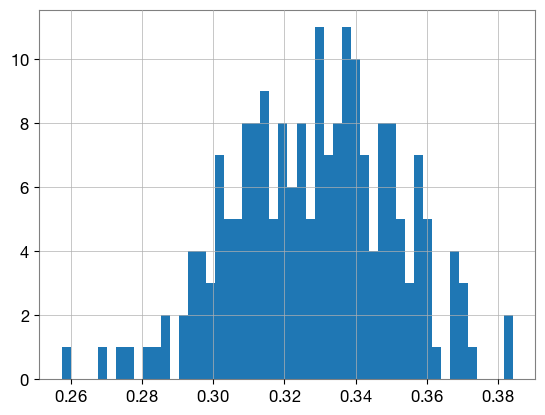

In [347]:
plt.hist(X_train[200:400][:,-1], bins = 50)

(array([ 5.,  3.,  3.,  5.,  1.,  2.,  2.,  0.,  2.,  2.,  0.,
         1.,  0.,  3.,  3.,  2.,  3.,  5.,  2.,  5., 14., 11.,
        13., 10.,  9.,  8.,  6.,  5.,  8.,  9.,  2.,  8.,  4.,
         5.,  3.,  3.,  5.,  5.,  2.,  0.,  3.,  3.,  3.,  2.,
         3.,  1.,  1.,  2.,  1.,  2.]),
 array([0.  , 0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16,
        0.18, 0.2 , 0.22, 0.24, 0.26, 0.28, 0.3 , 0.32, 0.34,
        0.36, 0.38, 0.4 , 0.42, 0.44, 0.46, 0.48, 0.5 , 0.52,
        0.54, 0.56, 0.58, 0.6 , 0.62, 0.64, 0.66, 0.68, 0.7 ,
        0.72, 0.74, 0.76, 0.78, 0.8 , 0.82, 0.84, 0.86, 0.88,
        0.9 , 0.92, 0.94, 0.96, 0.98, 1.  ]),
 <BarContainer object of 50 artists>)

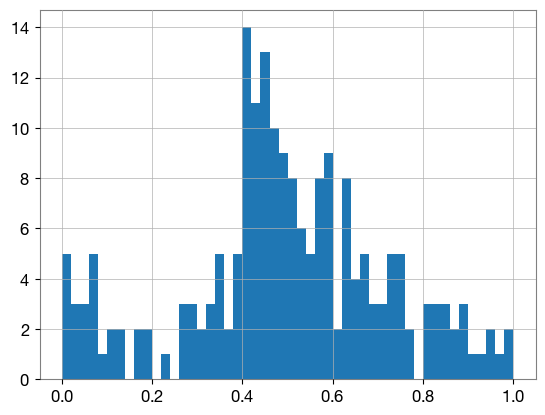

In [319]:
plt.hist(data_sinegaussian_normalized[:, -1], bins = 50)

(array([ 3.,  0.,  0.,  1.,  8.,  7.,  5.,  6.,  3.,  6.,  8.,
         5.,  5.,  4.,  7.,  6.,  5.,  7.,  7.,  6., 10.,  8.,
        10.,  6.,  6.,  5.,  5.,  9.,  2.,  2.,  3.,  5.,  3.,
         2.,  1.,  3.,  4.,  1.,  6.,  1.,  0.,  2.,  1.,  3.,
         0.,  0.,  0.,  1.,  0.,  2.]),
 array([-0.12446152, -0.10797229, -0.09148306, -0.07499383,
        -0.0585046 , -0.04201537, -0.02552614, -0.00903691,
         0.00745232,  0.02394155,  0.04043078,  0.05692001,
         0.07340924,  0.08989848,  0.10638771,  0.12287694,
         0.13936617,  0.1558554 ,  0.17234463,  0.18883386,
         0.20532309,  0.22181232,  0.23830155,  0.25479078,
         0.27128001,  0.28776924,  0.30425847,  0.3207477 ,
         0.33723693,  0.35372616,  0.37021539,  0.38670462,
         0.40319385,  0.41968308,  0.43617231,  0.45266154,
         0.46915077,  0.48564   ,  0.50212924,  0.51861847,
         0.5351077 ,  0.55159693,  0.56808616,  0.58457539,
         0.60106462,  0.61755385,  0.63404308,  

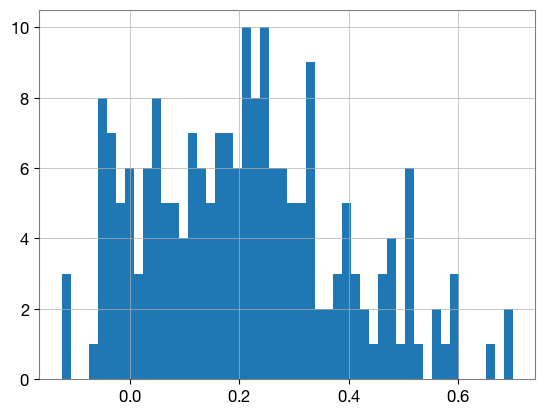

In [320]:
plt.hist(data_glitches_normalized[:, -1], bins = 50)

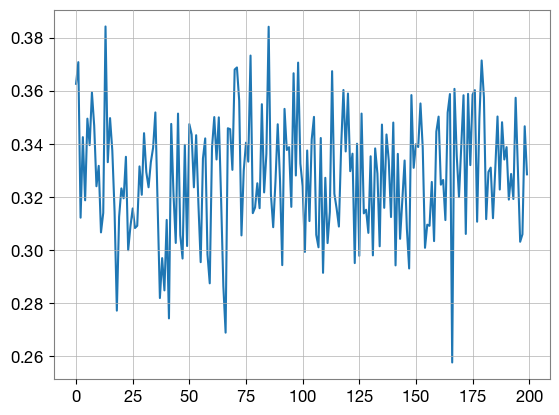

In [281]:
plt.plot(X_train[:,-1][200:400])

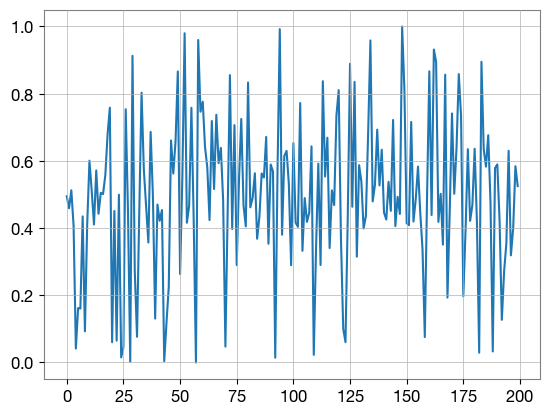

In [282]:
plt.plot(data_sinegaussian_normalized[:,-1])

In [44]:
max(np.linalg.norm(data_glitches, axis = 1))

1.0

In [29]:
data_glitches = data_glitches / max(np.linalg.norm(data_glitches, axis = 1))

In [30]:
# data_glitches = test_glitch_sample.copy()

In [31]:
data_glitches_normalized, junk5, junk6 = bunch_normalization(data_glitches.copy())

In [52]:
data_glitches_normalized, junk5, junk6 = bunch_normalization(data_glitch.copy())

In [53]:
data_glitches_normalized = np.hstack((data_glitches_normalized, np.array(junk6).reshape(len(data_glitches_normalized),1)))

In [33]:
# data_glitches_normalized = np.hstack((data_glitches_normalized, np.array(X_train_recover_coef)[0:len(data_glitches_normalized)].reshape(len(data_glitches_normalized),1)))

In [79]:
data_glitches_tensored = torch.FloatTensor(data_glitches_normalized)
_, decodedTestdata = autoencoder(data_glitches_tensored)
decodedTestdata = decodedTestdata.double()
reconstructedData_glitches = decodedTestdata.detach().numpy()
ReconstructedError_glitches = torch.mean((data_glitches_tensored - reconstructedData_glitches)**2,dim=1)
MSE_glitches = ReconstructedError_glitches.mean()

In [80]:
ReconstructedError_glitches_output_100d = np.mean((data_glitches_tensored.numpy()[:, :100] - reconstructedData_glitches[:, :100])**2, axis = 1)
MSE_glitches_output_100d = ReconstructedError_glitches_output_100d.mean()

In [81]:
ReconstructedError_glitches_output_1d = (data_glitches_tensored.numpy()[:, -1] - reconstructedData_glitches[:, -1])**2
MSE_glitches_output_1d = ReconstructedError_glitches_output_1d.mean()

In [88]:
data_glitches_real= np.load('../Data_cached/glitch_data_clean_25ms.npy')
data_glitches_real.shape

(693, 100)

In [89]:
data_glitches_real_normalized, junk5, junk6 = bunch_normalization(data_glitches_real.copy())

In [90]:
data_glitches_real_normalized = np.hstack((data_glitches_real_normalized, np.array(X_train_recover_coef)[0:len(data_glitches_real_normalized)].reshape(len(data_glitches_real_normalized),1)))

In [448]:
data_glitches_real_tensored = torch.FloatTensor(data_glitches_real_normalized)
_, decodedTestdata = autoencoder(data_glitches_real_tensored)
decodedTestdata = decodedTestdata.double()
reconstructedData_glitches_real = decodedTestdata.detach().numpy()
ReconstructedError_glitches_real = torch.mean((data_glitches_real_tensored - reconstructedData_glitches_real)**2,dim=1)
MSE_glitches_real = ReconstructedError_glitches_real.mean()

In [449]:
ReconstructedError_glitches_real_output_100d = np.mean((data_glitches_real_tensored.numpy()[:, :100] - reconstructedData_glitches_real[:, :100])**2, axis = 1)
MSE_glitches_real_output_100d = ReconstructedError_glitches_real_output_100d.mean()

In [450]:
ReconstructedError_glitches_real_output_1d = (data_glitches_real_tensored.numpy()[:, -1] - reconstructedData_glitches_real[:, -1])**2
MSE_glitches_real_output_1d = ReconstructedError_glitches_real_output_1d.mean()

In [88]:
MSE_glitches_output

0.04440137327274874

In [41]:
MSE_glitches_output

0.0023010253566951144

-0.04779369618051016

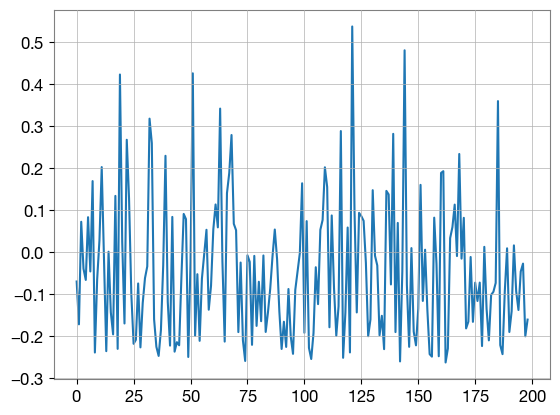

In [308]:
plt.plot((data_injected_tensored.numpy()[:, -1] - reconstructedData_injected[:, -1]))
(data_injected_tensored.numpy()[:, -1] - reconstructedData_injected[:, -1]).mean()

-0.004586538962321356

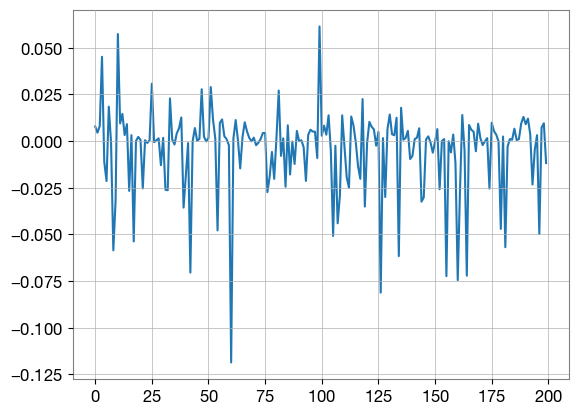

In [314]:
plt.plot((data_glitches_tensored.numpy()[:, -1] - reconstructedData_glitches[:, -1]))
(data_glitches_tensored.numpy()[:, -1] - reconstructedData_glitches[:, -1]).mean()

In [272]:
ReconstructedError_glitches_output.sum()

8.880274654549748

In [338]:
MSE_glitches_output

1.9880394134697e-06

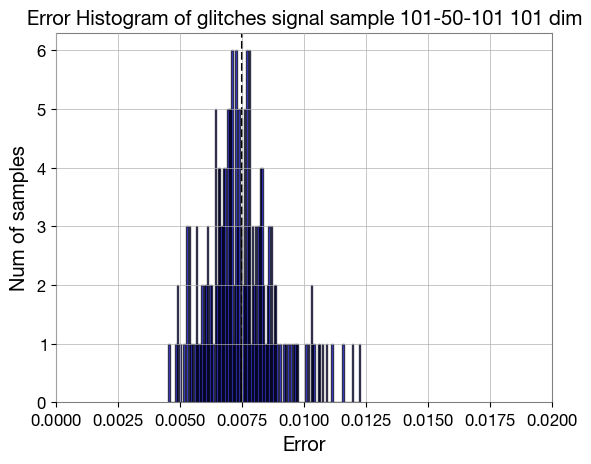

In [57]:
plt.hist(ReconstructedError_glitches, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of glitches signal sample 101-50-101 101 dim')
plt.xlim(0,0.02)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_glitches, color = 'black', linestyle = '--')
plt.show()

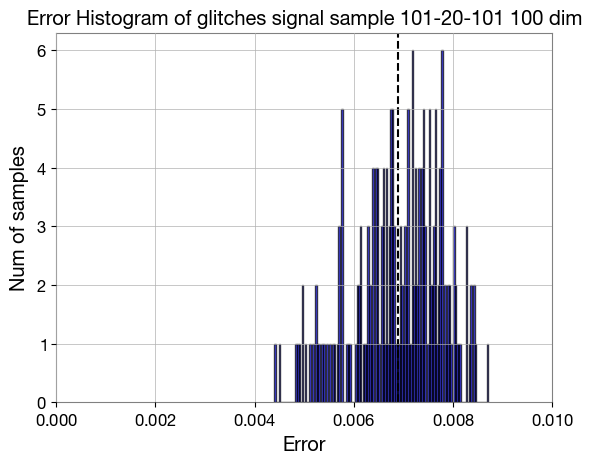

In [58]:
plt.hist(ReconstructedError_glitches_output, bins=140,facecolor = "blue", edgecolor = "black", alpha = 0.7)
plt.title('Error Histogram of glitches signal sample 101-20-101 100 dim')
plt.xlim(0,0.01)
plt.xlabel('Error')
plt.ylabel('Num of samples')
plt.axvline(x = MSE_glitches_output, color = 'black', linestyle = '--')
plt.show()

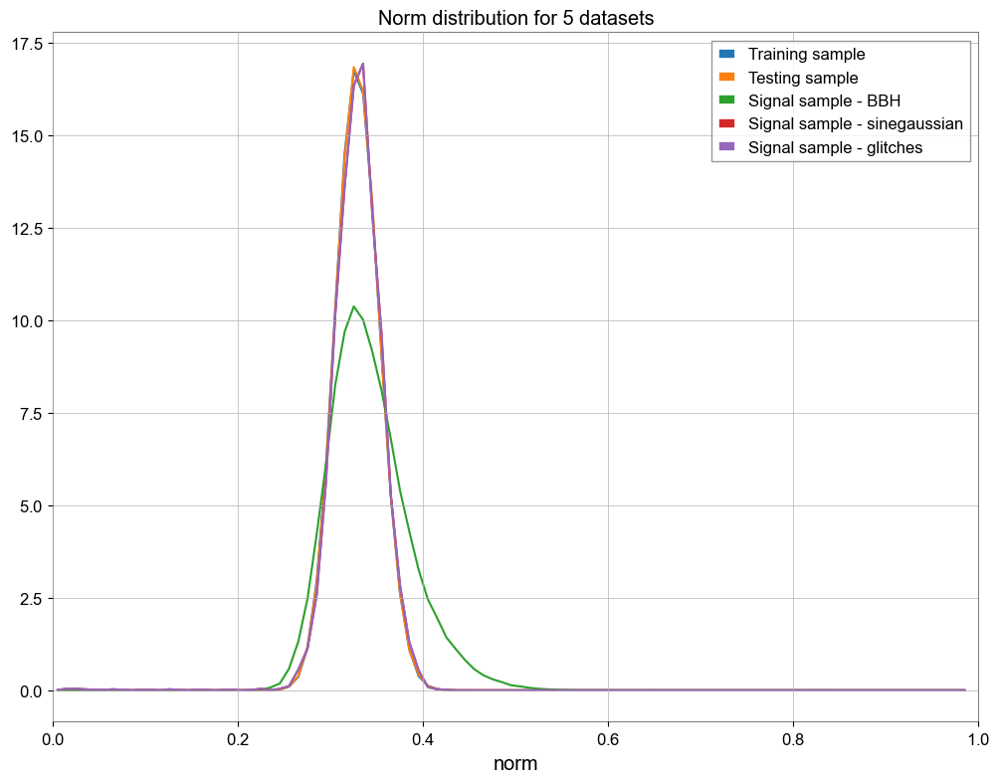

In [601]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
bin_scheme = np.arange(0,1,1e-2)

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

counts_train, bin_position_train = np.histogram(X_train[:,-1], bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(X_test[:,-1], bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(data_injected_normalized[: ,-1], bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(data_sinegaussian_normalized[:,-1], bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(data_glitches_normalized[:,-1], bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

# plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0, 1)
# plt.ylim()
plt.xlabel('norm')
# plt.xscale('log')
# plt.yscale('log')
plt.title('Norm distribution for 5 datasets')
plt.legend()
plt.show()

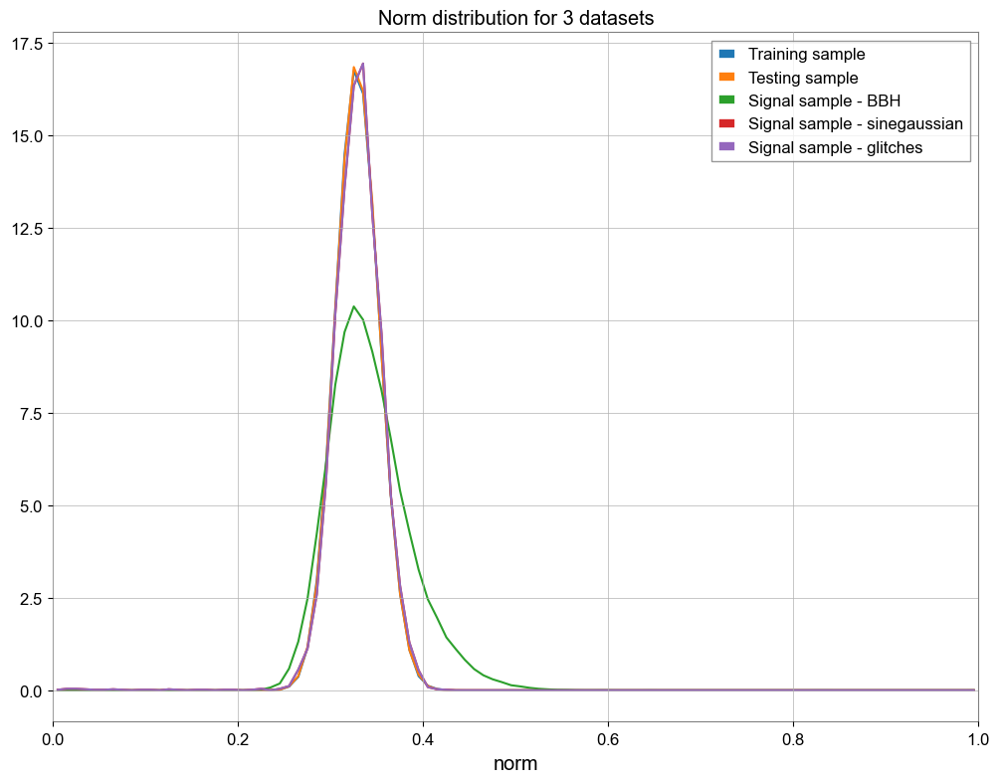

In [692]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
bin_scheme = np.arange(0,1.01,1e-2)

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

counts_train, bin_position_train = np.histogram(np.linalg.norm(X_train, axis=1), bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(np.linalg.norm(X_test, axis=1), bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(np.linalg.norm(data_injected_normalized, axis=1), bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(data_sinegaussian_normalized[:,-1], bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(data_glitches_normalized[:,-1], bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

# plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0, 1)
# plt.ylim()
plt.xlabel('norm')
# plt.xscale('log')
# plt.yscale('log')
plt.title('Norm distribution for 3 datasets')
plt.legend()
plt.show()

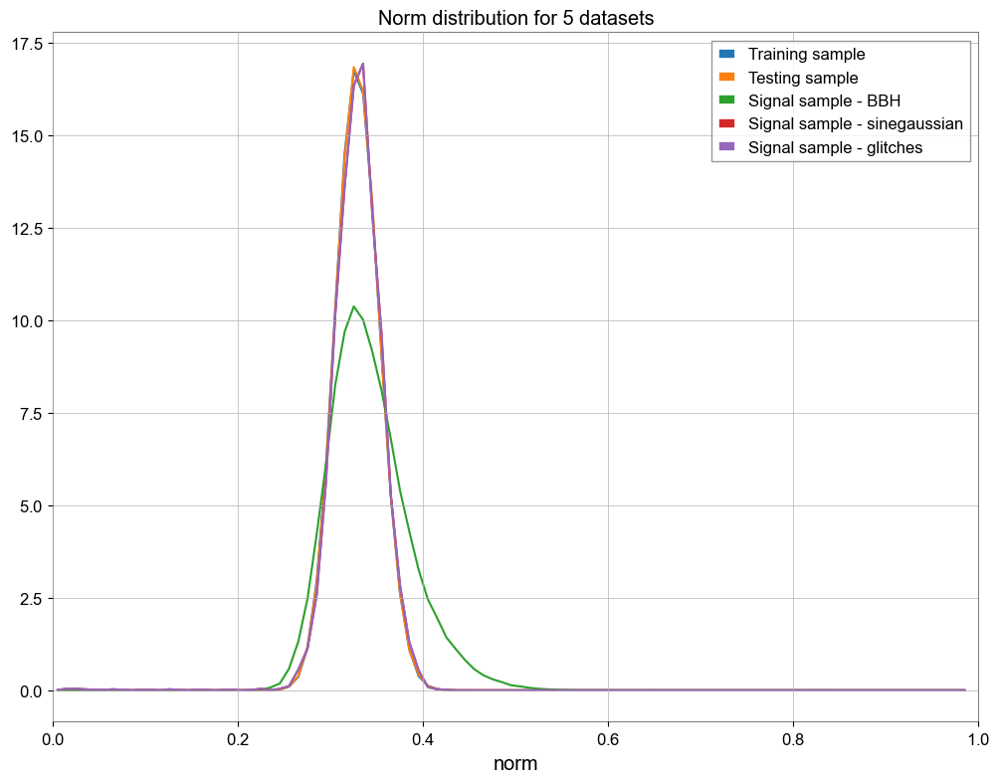

In [666]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
bin_scheme = np.arange(0,1,1e-2)

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

counts_train, bin_position_train = np.histogram(np.linalg.norm(X_train, axis=1), bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(np.linalg.norm(X_test, axis=1), bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(np.linalg.norm(data_injected_normalized, axis=1), bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(data_sinegaussian_normalized[:,-1], bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(data_glitches_normalized[:,-1], bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

# plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0, 1)
# plt.ylim()
plt.xlabel('norm')
# plt.xscale('log')
# plt.yscale('log')
plt.title('Norm distribution for 5 datasets')
plt.legend()
plt.show()

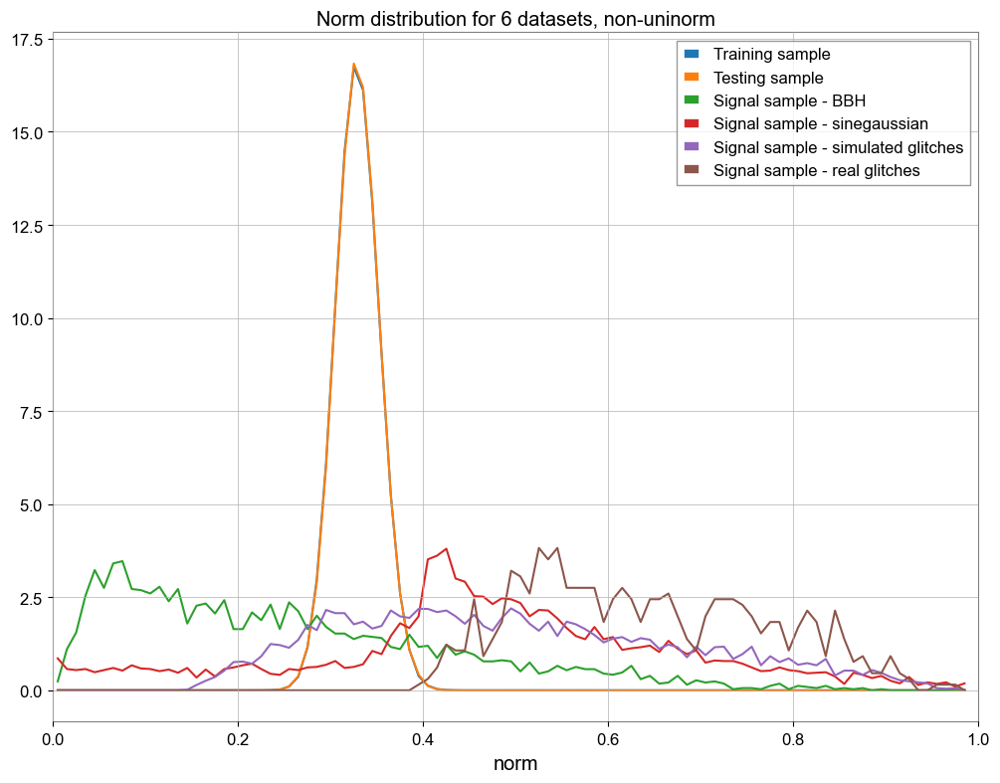

In [252]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0,1,1e-2)

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

counts_train, bin_position_train = np.histogram(X_train[:,-1], bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(X_test[:,-1], bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(data_injected_normalized[: ,-1], bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(data_sinegaussian_normalized[:,-1], bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(data_glitches_normalized[:,-1], bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(data_glitches_real_normalized[:,-1], bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2



plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')

# plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0, 1)
# plt.ylim()
plt.xlabel('norm')
# plt.xscale('log')
# plt.yscale('log')
plt.title('Norm distribution for 6 datasets, non-uninorm')
plt.legend()
plt.show()

Text(0, 0.5, 'Strain')

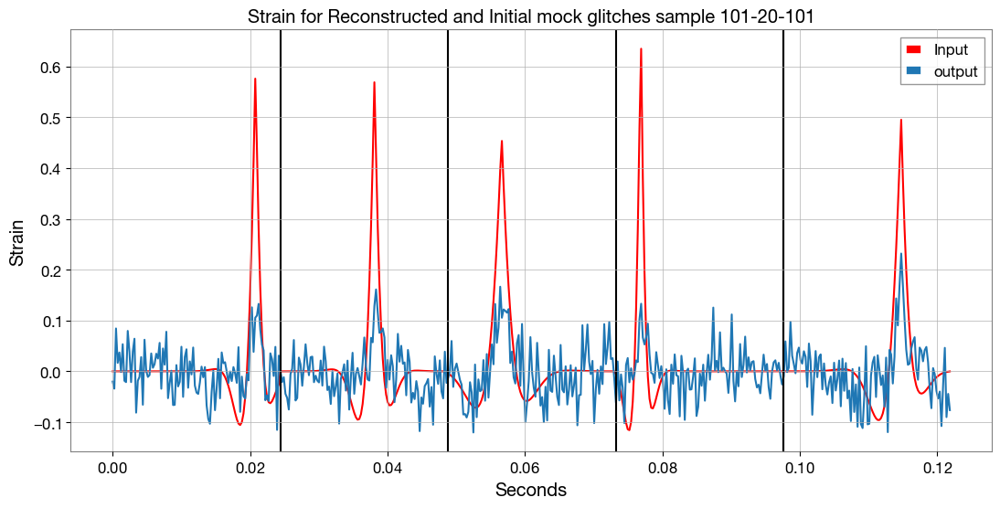

In [69]:
reconstructedData_glitches_output = reconstructedData_glitches[:, :100]
data_glitches_normalized_output = data_glitches_normalized[:, :100]
# x = np.arange(0, train_sample_number-1, 1/3)
x = np.arange(0,500/4096,1/4096)
y = np.zeros((train_sample_number-1, 3))
# for i in range(train_sample_number-1):
#     y[i] = reconstructedData[i] * X_train_recover_coef + X_train_recover_min
y = reconstructedData_glitches_output

plt.figure(figsize=(13,6))
plt.plot(x, data_glitches_normalized_output.flatten()[0:500], color = 'red', label = 'Input')
plt.plot(x, y.flatten()[0:500], label = 'output')
plt.axvline(x = 100/4096, color = 'black')
plt.axvline(x = 200/4096, color = 'black')
plt.axvline(x = 300/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.legend()
plt.title('Strain for Reconstructed and Initial mock glitches sample 101-20-101')
plt.xlabel('Seconds')
plt.ylabel('Strain')

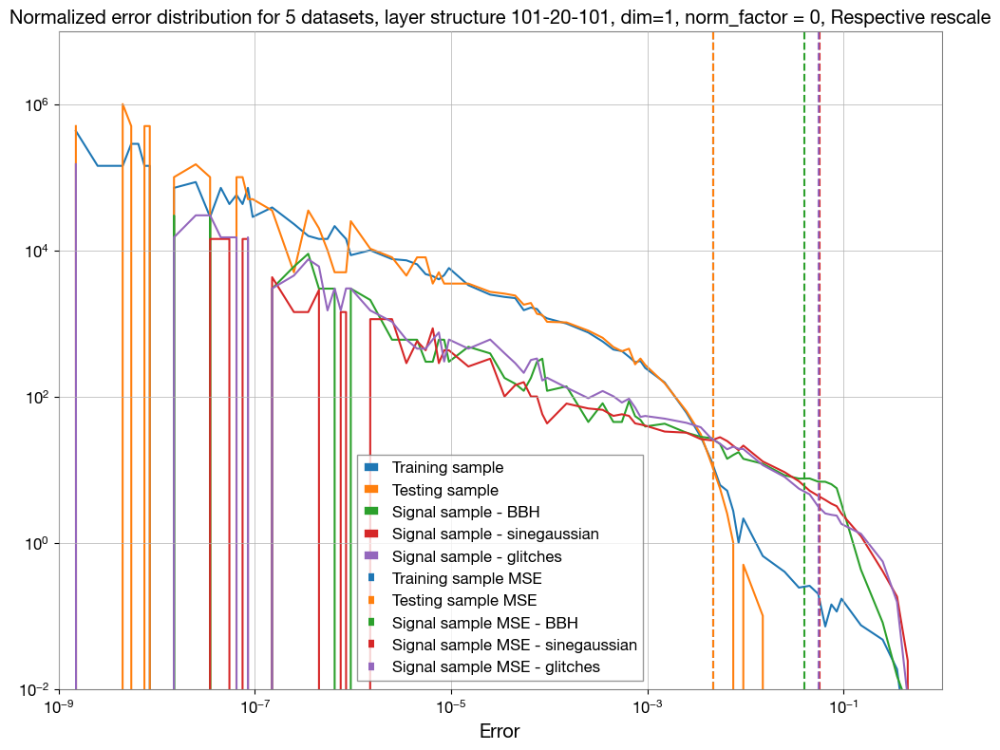

In [90]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
bin_scheme = [1e-9, 2e-9, 3e-9, 4e-9, 5e-9, 6e-9, 7e-9, 8e-9, 9e-9, 1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1, 8e-1, 9e-1]
def generate_custom_bins(start, end, interval):
    bin_edges = []
    edge = start
    bin_edges.append(start)
    while(edge < end):
        bin_edges.append(edge)
        edge = edge + interval
    return bin_edges

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

plt.axvline(x = MSE_train_output, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(1e-9, 1)
plt.ylim(1e-2, 1e7)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=1, norm_factor = 0, Respective rescale')
plt.legend()
plt.show()

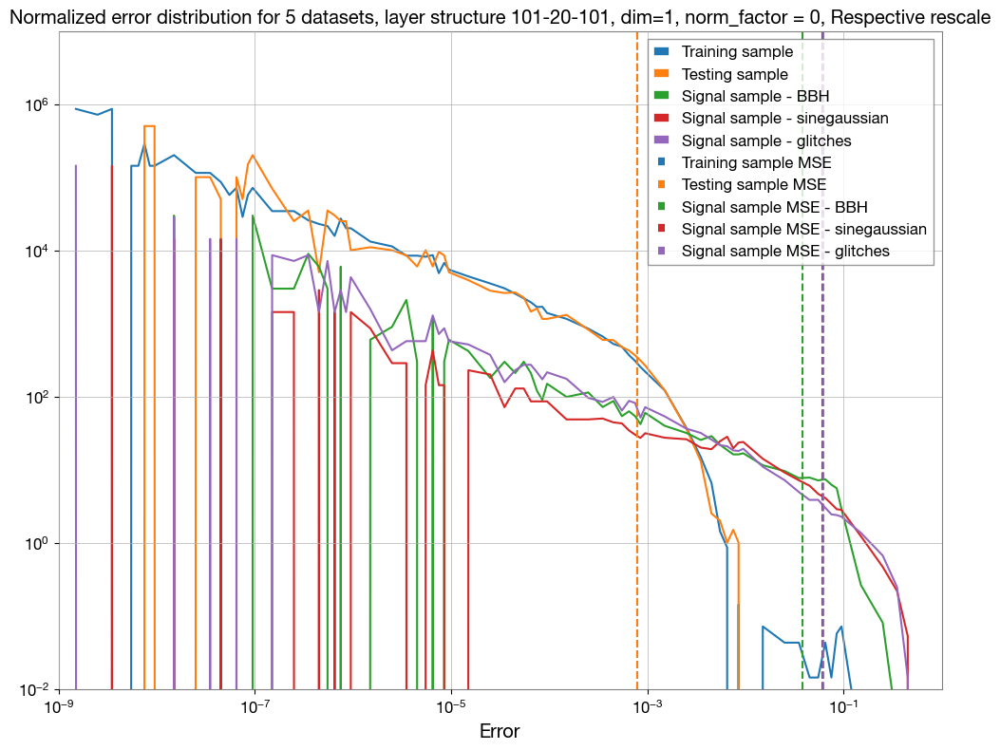

In [201]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
bin_scheme = [1e-9, 2e-9, 3e-9, 4e-9, 5e-9, 6e-9, 7e-9, 8e-9, 9e-9, 1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1, 8e-1, 9e-1]
def generate_custom_bins(start, end, interval):
    bin_edges = []
    edge = start
    bin_edges.append(start)
    while(edge < end):
        bin_edges.append(edge)
        edge = edge + interval
    return bin_edges

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

plt.axvline(x = MSE_train_output, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(1e-9, 1)
plt.ylim(1e-2, 1e7)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=1, norm_factor = 0, Respective rescale')
plt.legend()
plt.show()

In [291]:
np.argwhere(ReconstructedError_train_output > 3e-5)

array([[19],
       [20]])

In [292]:
np.argwhere(ReconstructedError_test_output > 3e-5)

array([[ 927],
       [1314]])

In [303]:
max(ReconstructedError_test_output)

0.00013172138119443844

In [370]:
TPR_01_BBH = np.argwhere(ReconstructedError_injected_output > max(max(ReconstructedError_test_output), max(ReconstructedError_train_output))).shape[0]/len(ReconstructedError_injected_output)
TPR_01_BBH

0.030792227204783258

In [371]:
TPR_01_SG = np.argwhere(ReconstructedError_sinegaussian_output > max(max(ReconstructedError_test_output), max(ReconstructedError_train_output))).shape[0]/len(ReconstructedError_sinegaussian_output)
TPR_01_SG

0.18328571428571427

In [372]:
TPR_01_Glitch = np.argwhere(ReconstructedError_glitches_output > max(max(ReconstructedError_test_output), max(ReconstructedError_train_output))).shape[0]/len(ReconstructedError_glitches_output)
TPR_01_Glitch

0.218

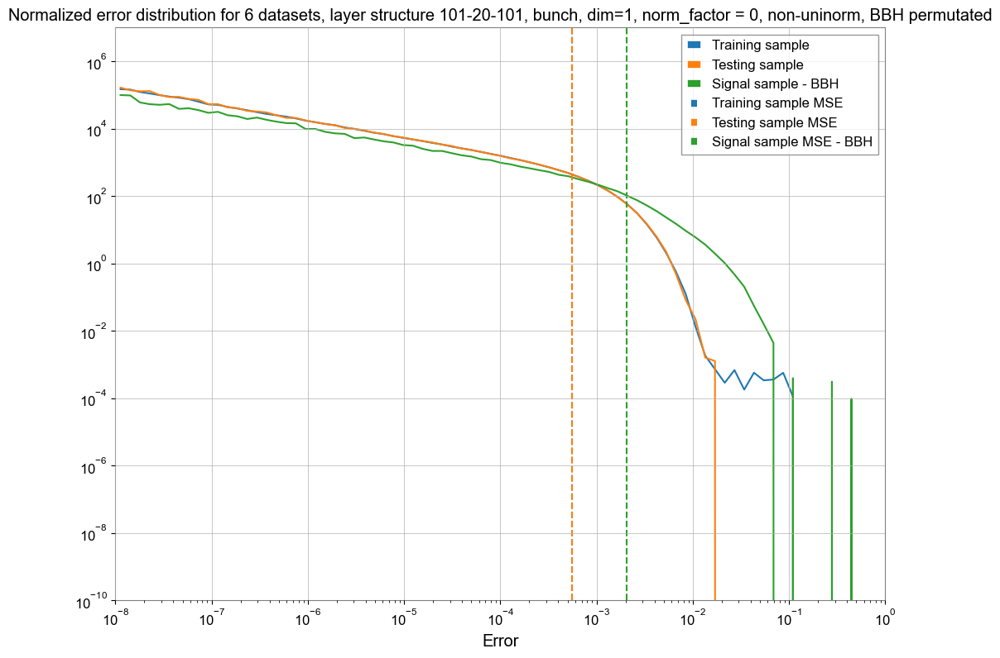

In [574]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd','#8c564b']
# bin_scheme = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
def generate_custom_bins(start, end, interval):
    bin_edges = []
    edge = start
    bin_edges.append(start)
    while(edge < end):
        bin_edges.append(edge)
        edge = edge + interval
    return bin_edges

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

bin_scheme = np.logspace(-8, 0, 80)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_1d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_1d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_1d, bins = bin_scheme, density = True)



bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')

plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_1d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')

plt.xlim(1e-8, 1)
plt.ylim(1e-10, 1e7)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 6 datasets, layer structure 101-20-101, bunch, dim=1, norm_factor = 0, non-uninorm, BBH permutated')
plt.legend()
plt.show()

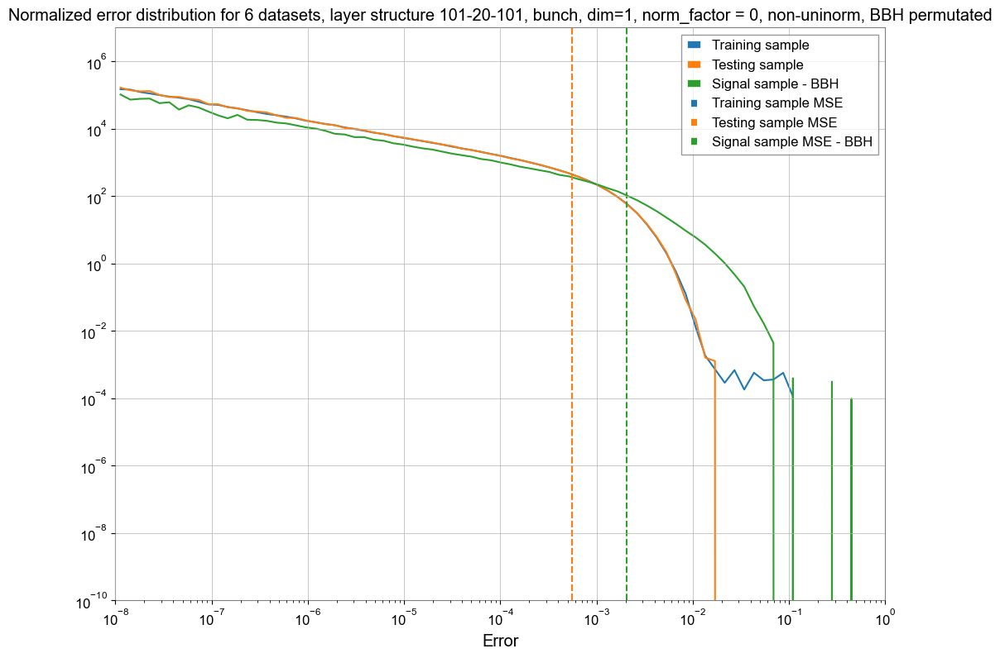

In [537]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd','#8c564b']
# bin_scheme = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
def generate_custom_bins(start, end, interval):
    bin_edges = []
    edge = start
    bin_edges.append(start)
    while(edge < end):
        bin_edges.append(edge)
        edge = edge + interval
    return bin_edges

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

bin_scheme = np.logspace(-8, 0, 80)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_1d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_1d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_1d, bins = bin_scheme, density = True)



bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')

plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_1d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')

plt.xlim(1e-8, 1)
plt.ylim(1e-10, 1e7)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 6 datasets, layer structure 101-20-101, bunch, dim=1, norm_factor = 0, non-uninorm, BBH permutated')
plt.legend()
plt.show()

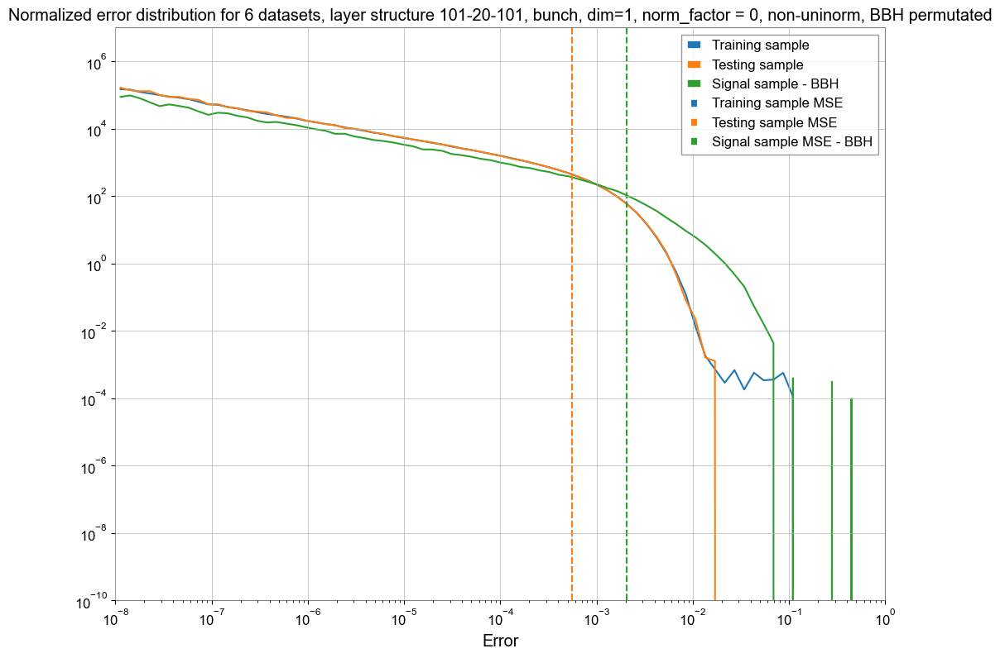

In [602]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd','#8c564b']
# bin_scheme = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
def generate_custom_bins(start, end, interval):
    bin_edges = []
    edge = start
    bin_edges.append(start)
    while(edge < end):
        bin_edges.append(edge)
        edge = edge + interval
    return bin_edges

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

bin_scheme = np.logspace(-8, 0, 80)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_1d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_1d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_1d, bins = bin_scheme, density = True)



bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')

plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_1d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')

plt.xlim(1e-8, 1)
plt.ylim(1e-10, 1e7)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 6 datasets, layer structure 101-20-101, bunch, dim=1, norm_factor = 0, non-uninorm, BBH permutated')
plt.legend()
plt.show()

In [603]:
np.argwhere(ReconstructedError_injected_output_1d > 1e-1)

array([[18456],
       [99787],
       [99789]], dtype=int64)

In [ ]:
outliner_1 = 

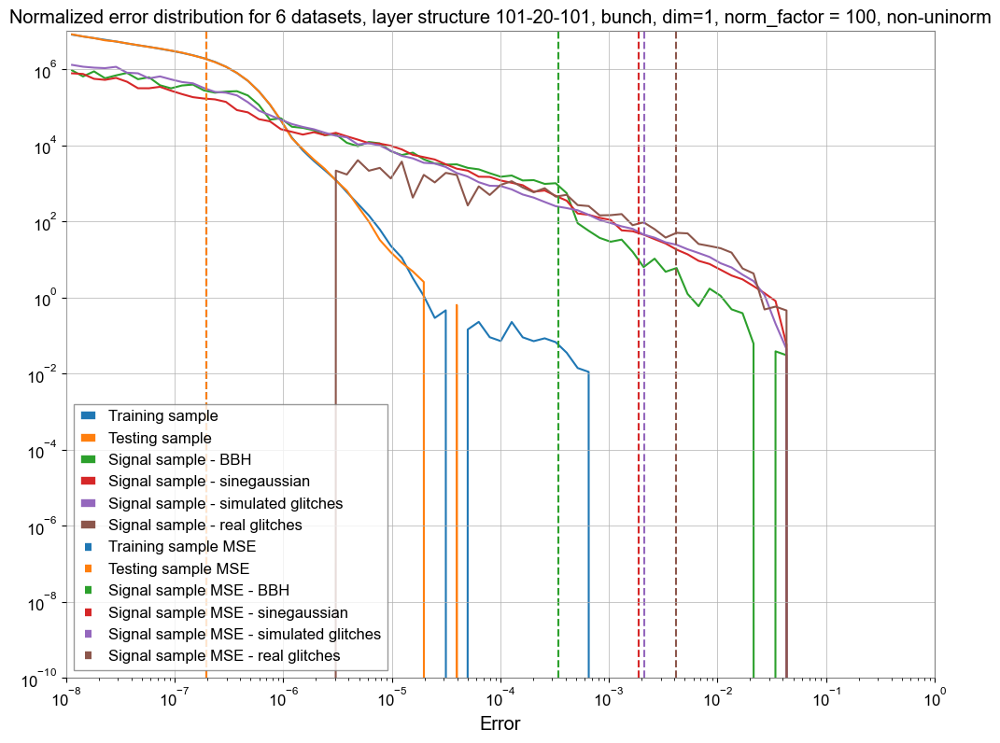

In [196]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd','#8c564b']
# bin_scheme = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
def generate_custom_bins(start, end, interval):
    bin_edges = []
    edge = start
    bin_edges.append(start)
    while(edge < end):
        bin_edges.append(edge)
        edge = edge + interval
    return bin_edges

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

bin_scheme = np.logspace(-8, 0, 80)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_1d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_1d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_1d, bins = bin_scheme, density = True)



bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')

plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
plt.axvline(x = MSE_glitches_real_output_1d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')

plt.xlim(1e-8, 1)
plt.ylim(1e-10, 1e7)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 6 datasets, layer structure 101-20-101, bunch, dim=1, norm_factor = 100, non-uninorm')
plt.legend()
plt.show()

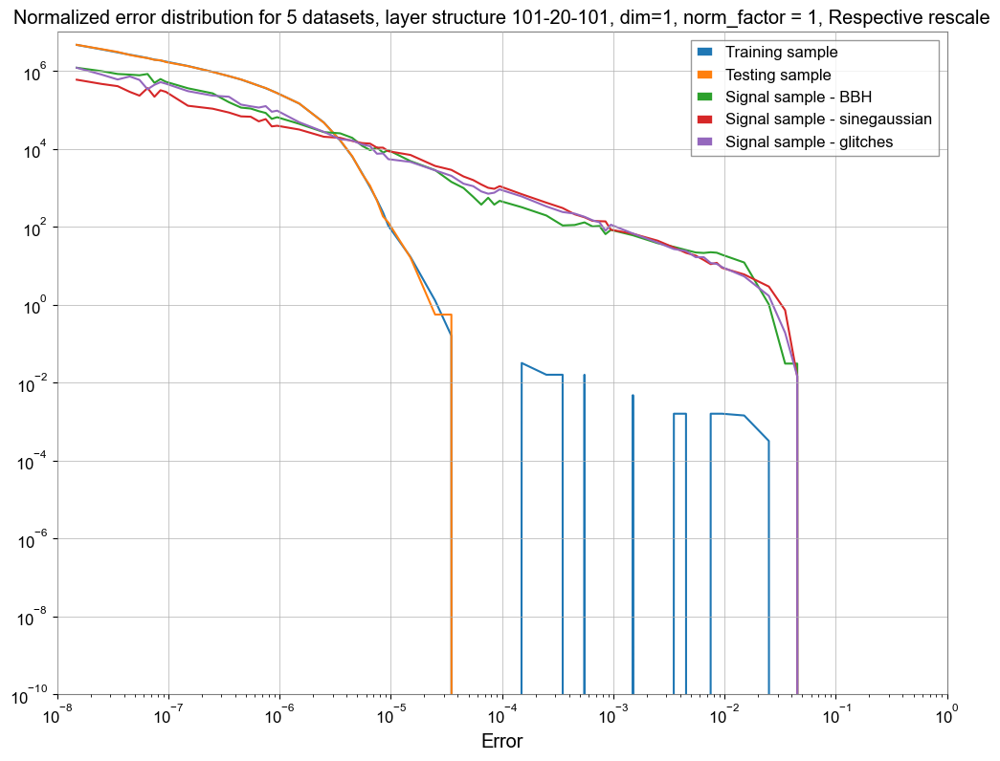

In [545]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
bin_scheme = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
def generate_custom_bins(start, end, interval):
    bin_edges = []
    edge = start
    bin_edges.append(start)
    while(edge < end):
        bin_edges.append(edge)
        edge = edge + interval
    return bin_edges

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_1d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_1d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

# plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0.00000001, 1)
plt.ylim(1e-10, 1e7)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=1, norm_factor = 1, Respective rescale')
plt.legend()
plt.show()

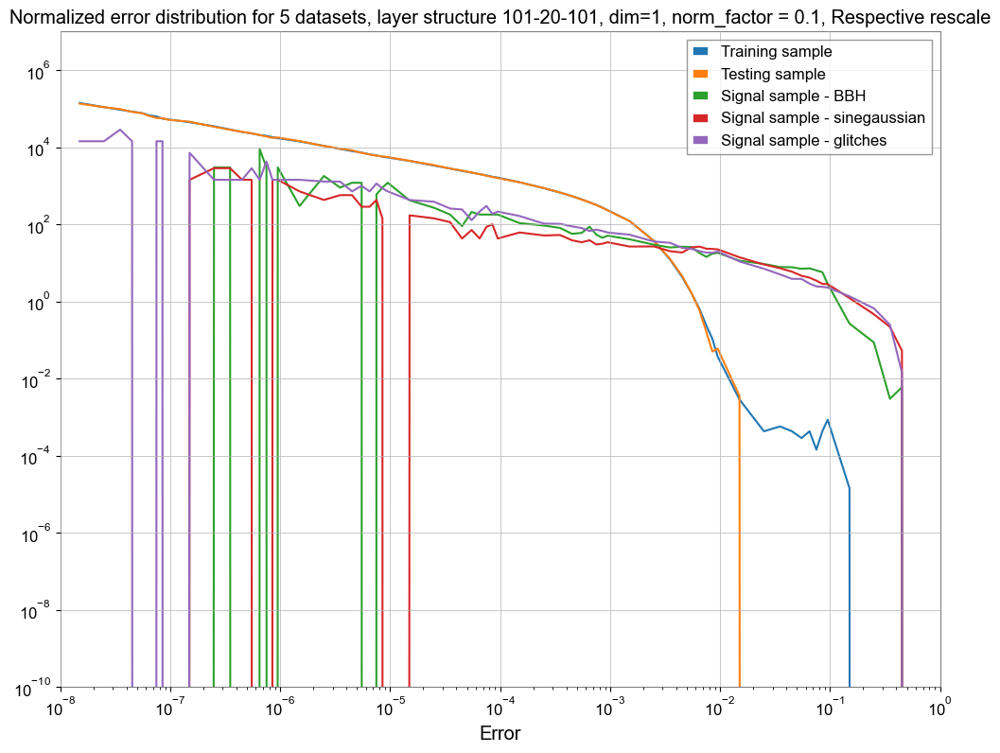

In [594]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
bin_scheme = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
def generate_custom_bins(start, end, interval):
    bin_edges = []
    edge = start
    bin_edges.append(start)
    while(edge < end):
        bin_edges.append(edge)
        edge = edge + interval
    return bin_edges

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_1d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_1d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

# plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0.00000001, 1)
plt.ylim(1e-10, 1e7)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=1, norm_factor = 0.1, Respective rescale')
plt.legend()
plt.show()

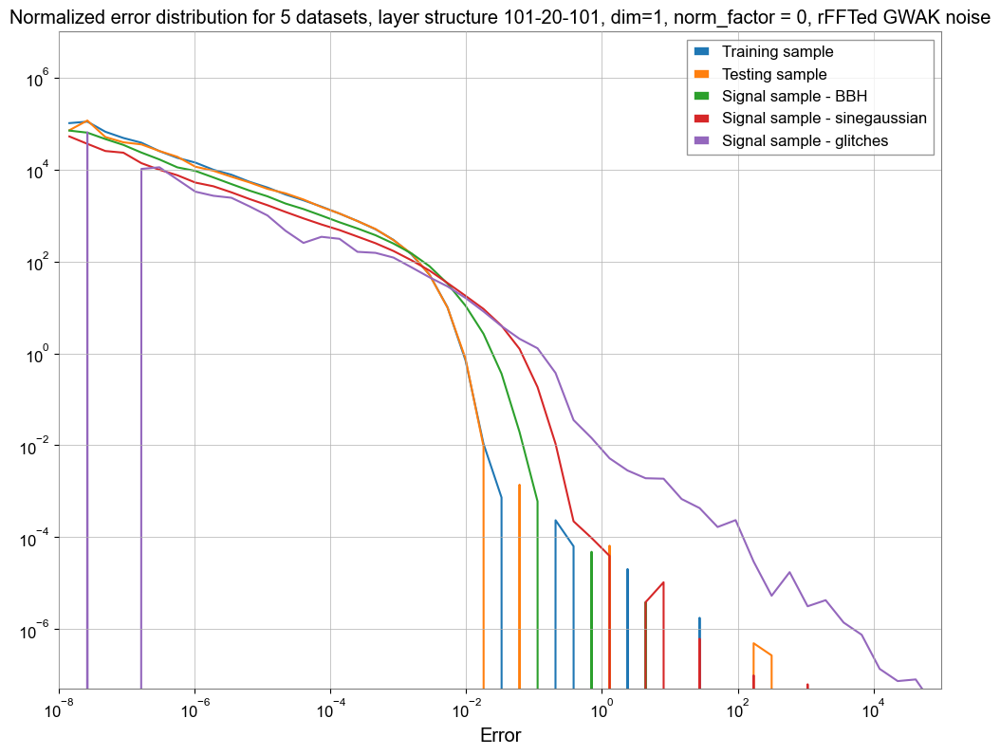

In [211]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
bin_scheme = np.logspace(-8, 5, 50)
def generate_custom_bins(start, end, interval):
    bin_edges = []
    edge = start
    bin_edges.append(start)
    while(edge < end):
        bin_edges.append(edge)
        edge = edge + interval
    return bin_edges

# bin_scheme = generate_custom_bins(1e-7, 1e-1, 1e-7)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_1d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_1d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_1d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_1d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_1d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

# plt.axvline(x = MSE_train_output_1d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_1d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_injected_output_1d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_1d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_1d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(1e-8, 1e5)
plt.ylim(5e-8, 1e7)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=1, norm_factor = 0, rFFTed GWAK noise')

plt.legend()
plt.show()

In [341]:
np.mean(ReconstructedError_sinegaussian_output_1d)

0.0018654476813433722

In [343]:
max(ReconstructedError_injected_output_1d)

0.04042898140193074

In [342]:
max(ReconstructedError_sinegaussian_output_1d)

0.04042076032826358

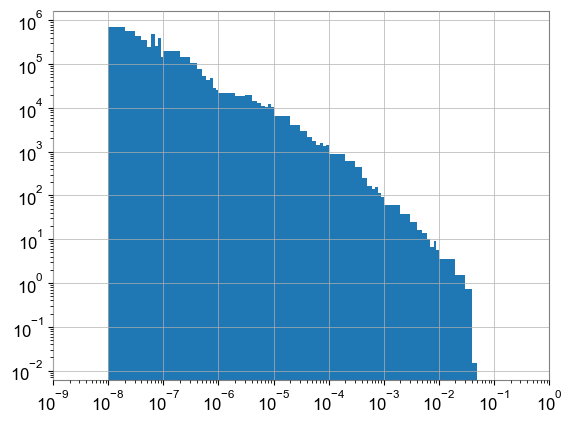

In [340]:
plt.hist(ReconstructedError_sinegaussian_output_1d, bins = bin_scheme, density='True')
plt.xlim(1e-9, 1e0)
plt.xscale('log')
plt.yscale('log')


In [622]:
TPR_10_BBH = np.argwhere(ReconstructedError_injected_output_1d > max(ReconstructedError_train_output_1d)).shape[0]/len(ReconstructedError_injected_output_1d)
TPR_10_BBH

0.004482964734010759

In [592]:
TPR_10_BBH = np.argwhere(ReconstructedError_injected_output_100d < min(ReconstructedError_test_output_100d)).shape[0]/len(ReconstructedError_injected_output_100d)
TPR_10_BBH

0.12582187686790197

In [593]:
TPR_10_BBH = np.argwhere(ReconstructedError_injected_output_100d > max(ReconstructedError_test_output_100d)).shape[0]/len(ReconstructedError_injected_output_100d)
TPR_10_BBH

0.0

In [623]:
TPR_100_SG = np.argwhere(ReconstructedError_sinegaussian_output_1d > max(ReconstructedError_train_output_1d)).shape[0]/len(ReconstructedError_sinegaussian_output_1d)
TPR_100_SG

0.02642857142857143

In [624]:
TPR_100_Glitch = np.argwhere(ReconstructedError_glitches_output_1d > max(ReconstructedError_train_output_1d)).shape[0]/len(ReconstructedError_glitches_output_1d)
TPR_100_Glitch

0.012142857142857143

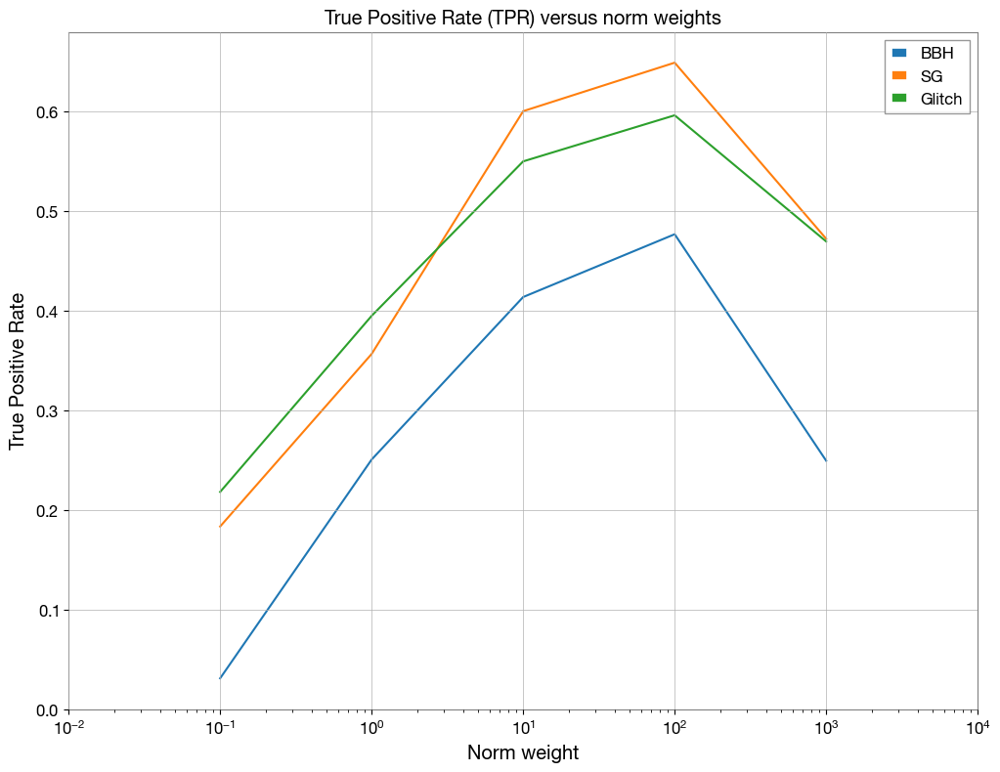

In [391]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

TPR_BBH = [TPR_01_BBH, TPR_1_BBH, TPR_10_BBH, TPR_100_BBH, TPR_1000_BBH]
TPR_SG = [TPR_01_SG, TPR_1_SG, TPR_10_SG, TPR_100_SG, TPR_1000_SG]
TPR_Glitch = [TPR_01_Glitch, TPR_1_Glitch, TPR_10_Glitch, TPR_100_Glitch, TPR_1000_Glitch]
Weights = [0.1, 1, 10, 100, 1000]

plt.figure(figsize=(12, 9))

plt.plot(Weights, TPR_BBH, label = 'BBH')
plt.plot(Weights, TPR_SG, label = 'SG')
plt.plot(Weights, TPR_Glitch, label = 'Glitch')

plt.xlim(1e-2, 1e4)
plt.xlabel('Norm weight')
plt.ylabel('True Positive Rate')
plt.xscale('log')
plt.title('True Positive Rate (TPR) versus norm weights')
plt.legend()
plt.show()

(array([4242.,  558.,  266.,  197.,  168.,  110.,   98.,   84.,
          65.,   87.,   63.,   55.,   50.,   44.,   44.,   30.,
          35.,   29.,   30.,   21.]),
 array([1.25774946e-11, 2.49945932e-04, 4.99891851e-04,
        7.49837771e-04, 9.99783690e-04, 1.24972961e-03,
        1.49967553e-03, 1.74962145e-03, 1.99956737e-03,
        2.24951329e-03, 2.49945921e-03, 2.74940513e-03,
        2.99935104e-03, 3.24929696e-03, 3.49924288e-03,
        3.74918880e-03, 3.99913472e-03, 4.24908064e-03,
        4.49902656e-03, 4.74897248e-03, 4.99891840e-03]),
 <BarContainer object of 20 artists>)

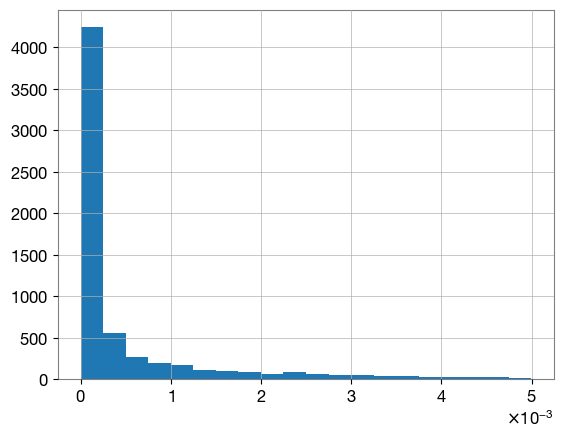

In [232]:
plt.hist(ReconstructedError_sinegaussian_output[ReconstructedError_sinegaussian_output < 0.005], bins = 20)

In [230]:
ReconstructedError_sinegaussian_output.mean()

0.00190188018920955

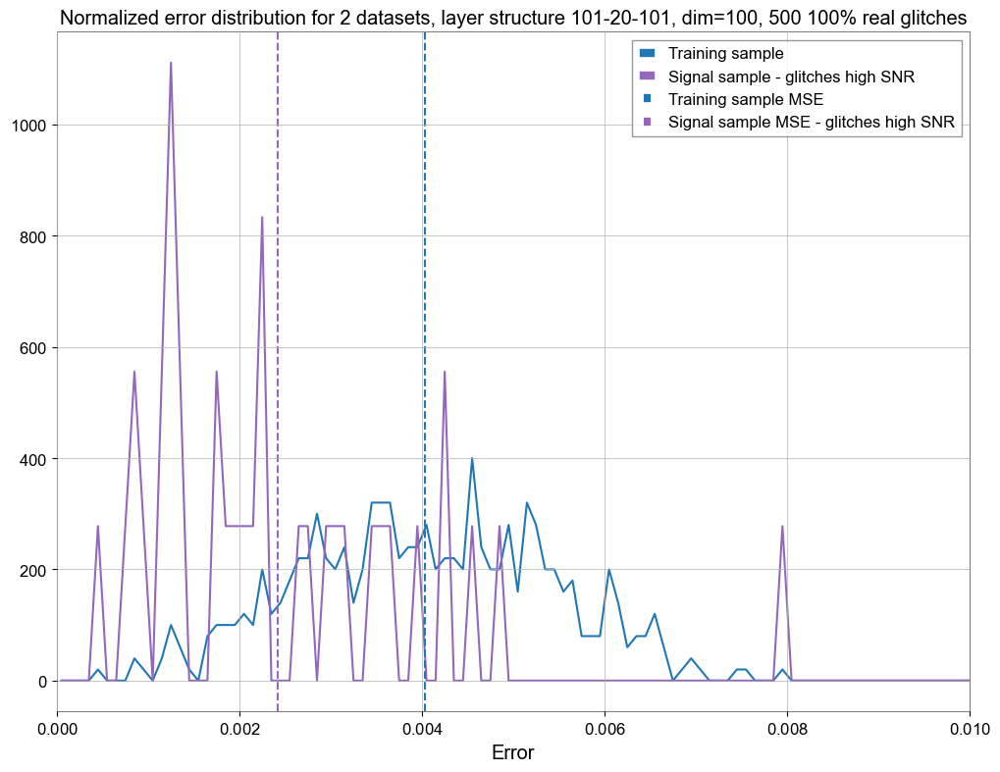

In [103]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
bin_scheme = np.arange(0, 2e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
# plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
# plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches high SNR')

plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches high SNR')

plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 2 datasets, layer structure 101-20-101, dim=100, 500 100% real glitches')
plt.legend()
plt.show()

In [ ]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 2e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.02)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 101-20-101, dim=100, norm_factor = 100, uninorm')
plt.legend()
plt.show()

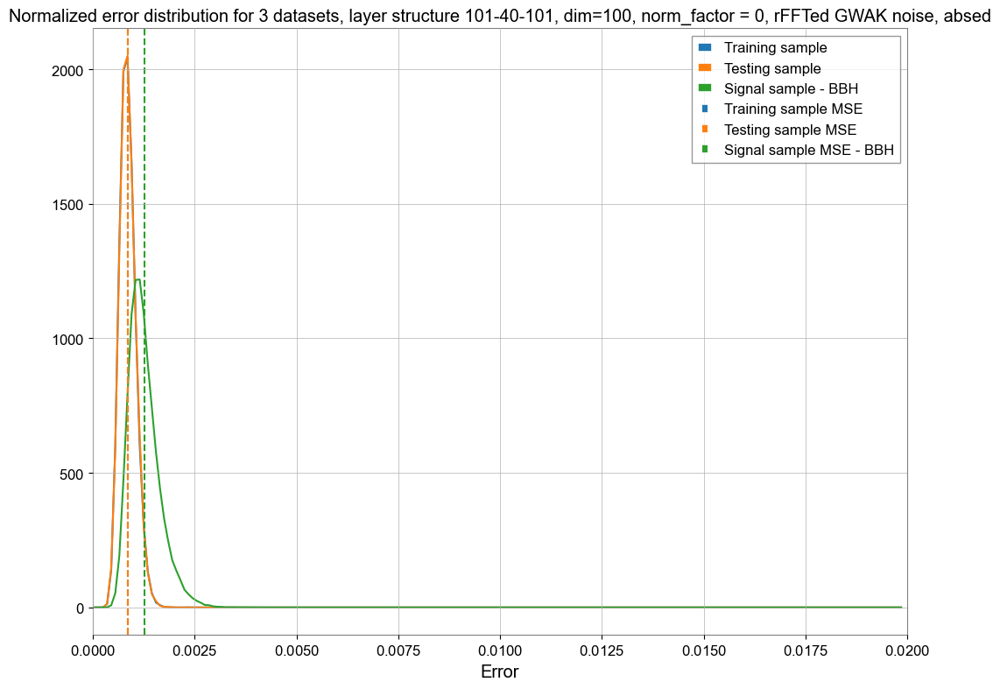

In [201]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 2e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.02)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 101-40-101, dim=100, norm_factor = 0, rFFTed GWAK noise, absed')
plt.legend()
plt.show()

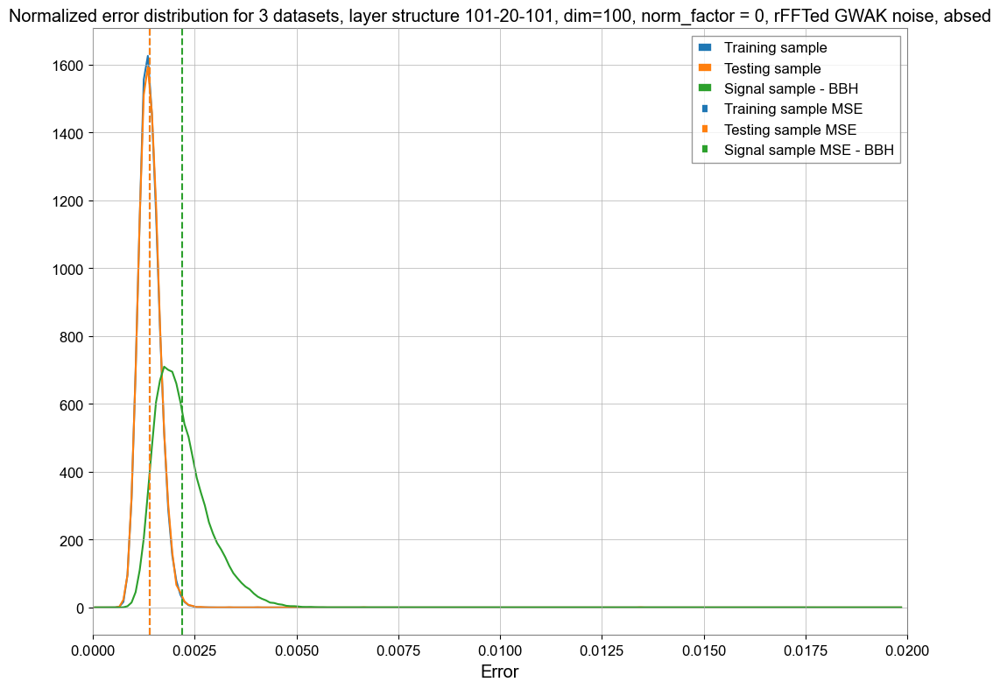

In [178]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 2e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.02)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 101-20-101, dim=100, norm_factor = 0, rFFTed GWAK noise, absed')
plt.legend()
plt.show()

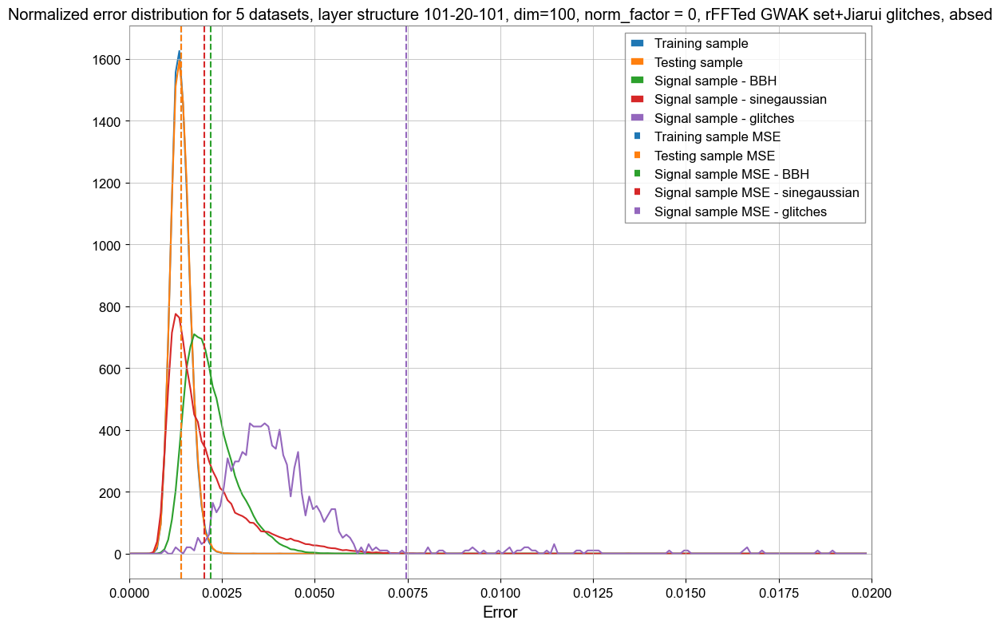

In [165]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 2e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.02)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=100, norm_factor = 0, rFFTed GWAK set+Jiarui glitches, absed')
plt.legend()
plt.show()

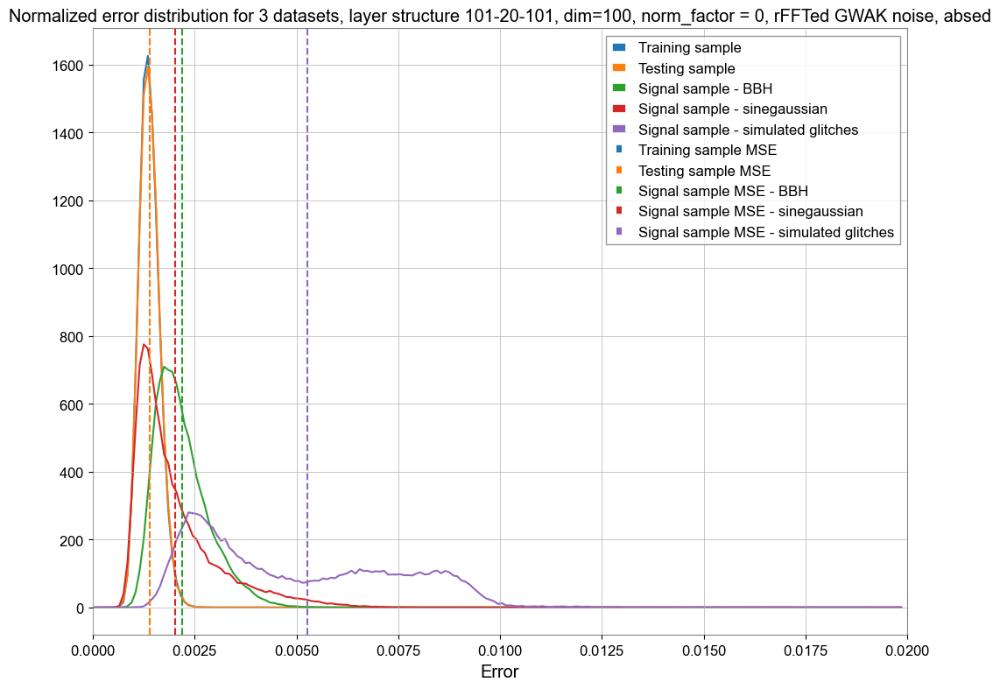

In [58]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 2e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.02)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 101-20-101, dim=100, norm_factor = 0, rFFTed GWAK noise, absed')
plt.legend()
plt.show()

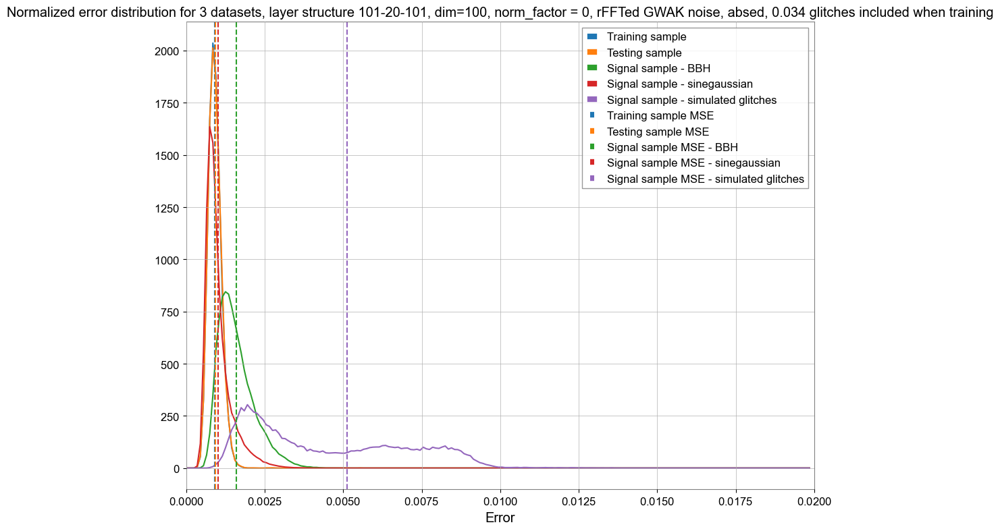

In [82]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 2e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.02)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 101-20-101, dim=100, norm_factor = 0, rFFTed GWAK noise, absed, 0.034 glitches included when training')
plt.legend()
plt.show()

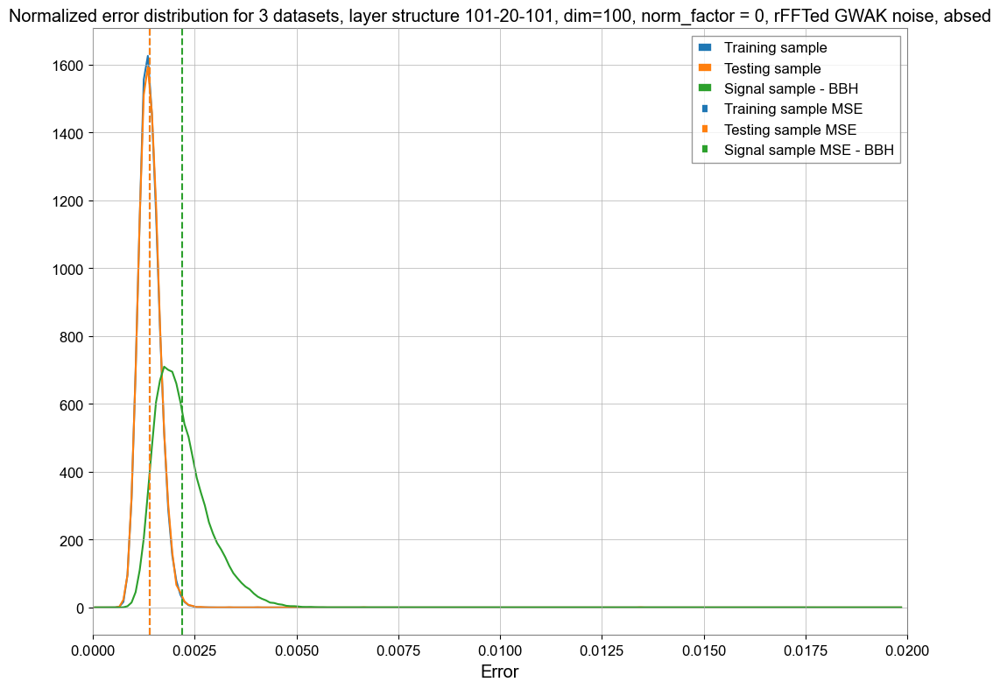

In [224]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 2e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.02)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 101-20-101, dim=100, norm_factor = 0, rFFTed GWAK noise, absed')
plt.legend()
plt.show()

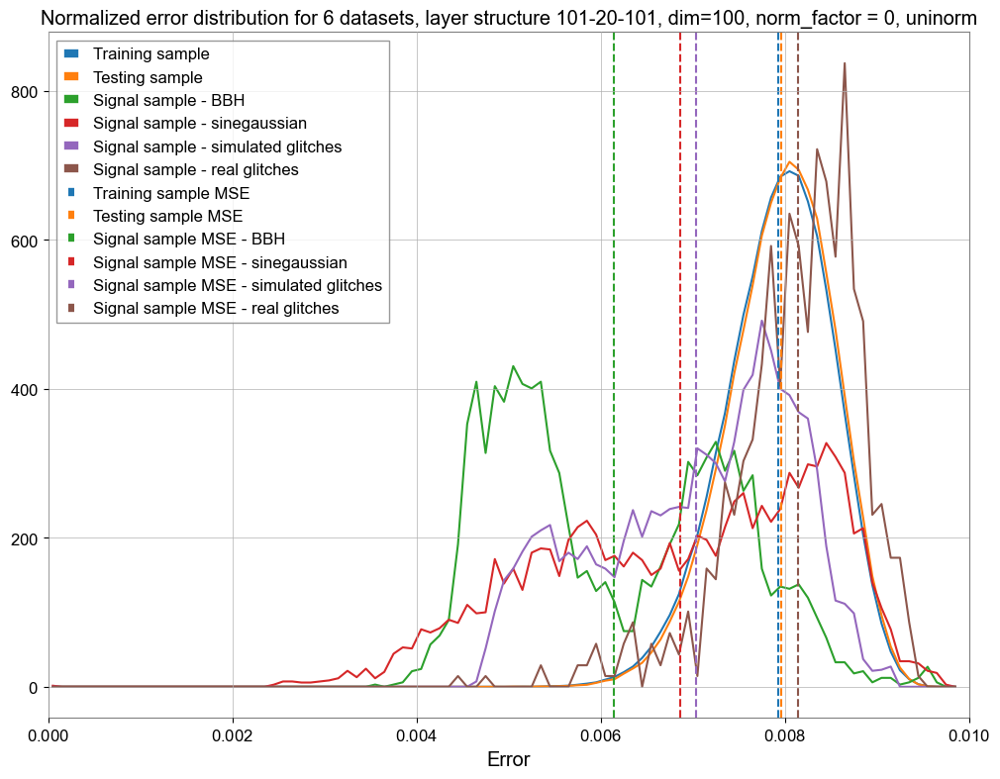

In [451]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 6 datasets, layer structure 101-20-101, dim=100, norm_factor = 0, uninorm')
plt.legend()
plt.show()

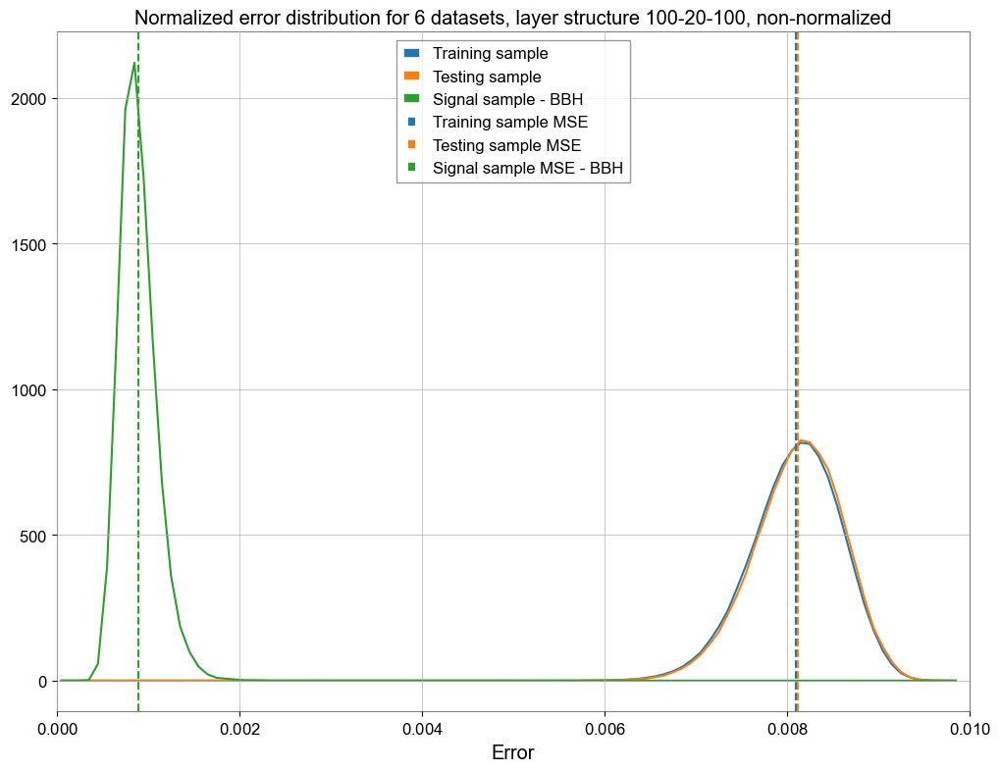

In [684]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 6 datasets, layer structure 100-20-100, non-normalized')
plt.legend()
plt.show()

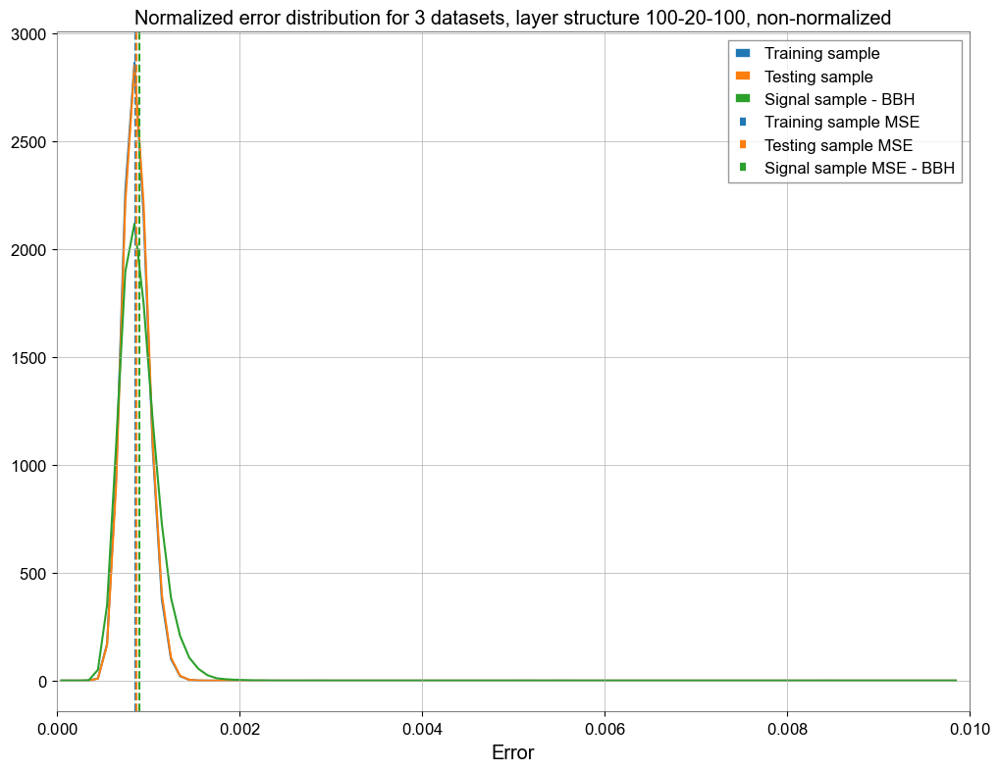

In [700]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 100-20-100, non-normalized')
plt.legend()
plt.show()

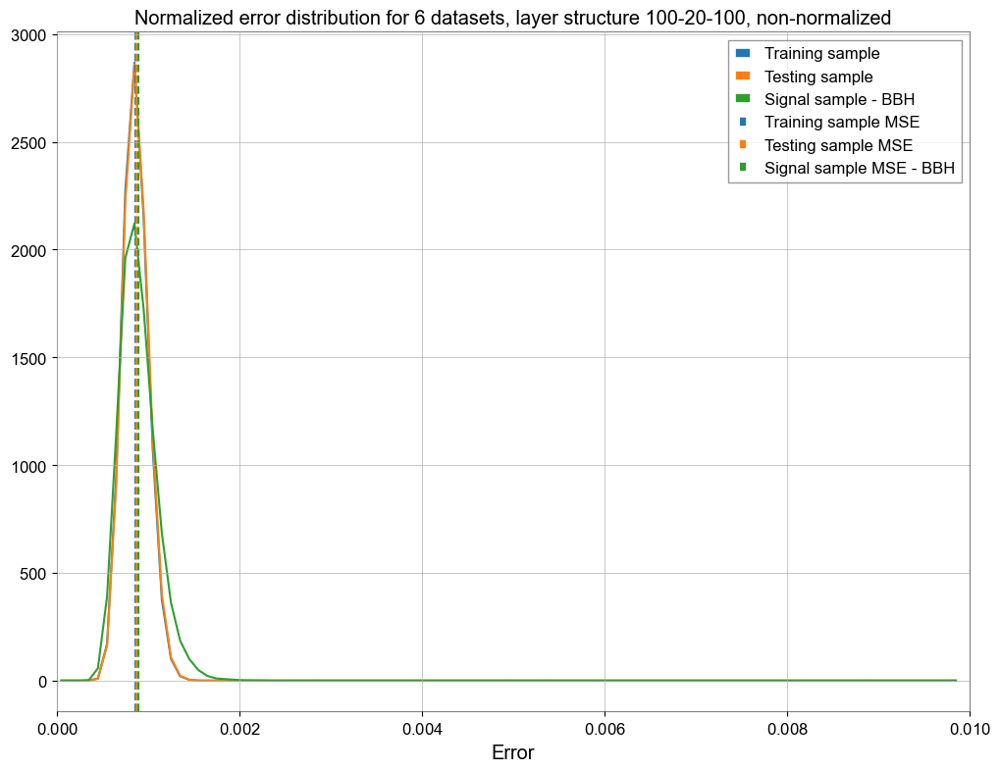

In [665]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 3 datasets, layer structure 100-20-100, non-normalized')
plt.legend()
plt.show()

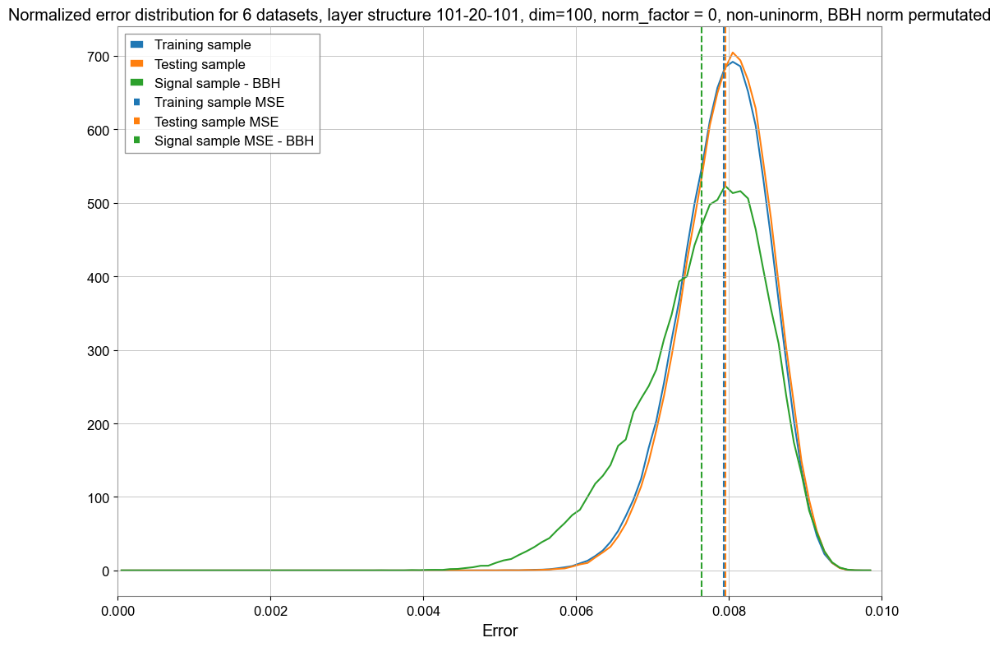

In [575]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 6 datasets, layer structure 101-20-101, dim=100, norm_factor = 0, non-uninorm, BBH norm permutated')
plt.legend()
plt.show()

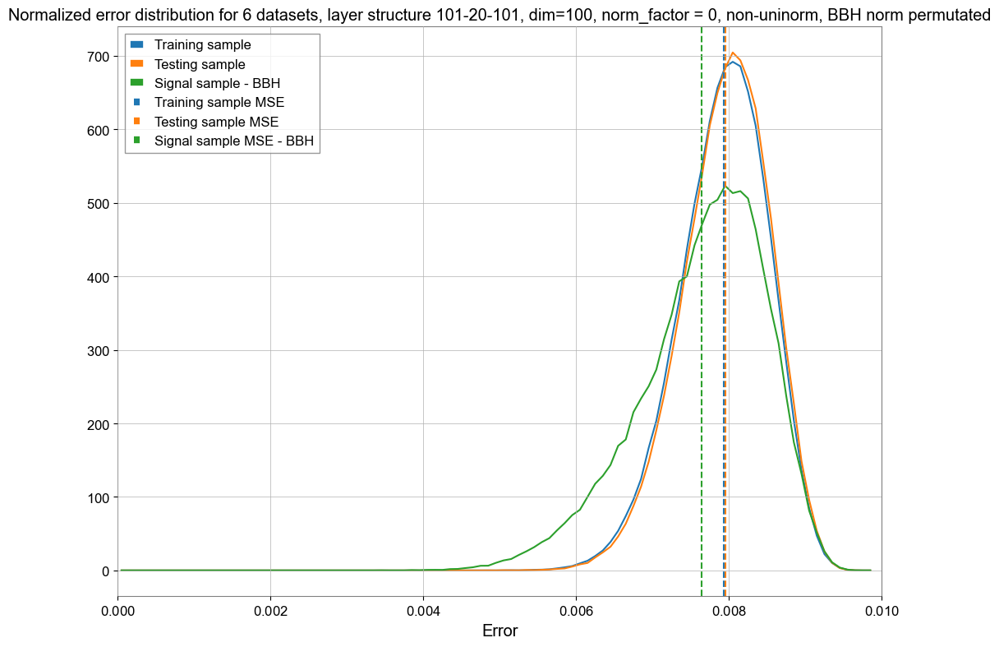

In [538]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 6 datasets, layer structure 101-20-101, dim=100, norm_factor = 0, non-uninorm, BBH norm permutated')
plt.legend()
plt.show()

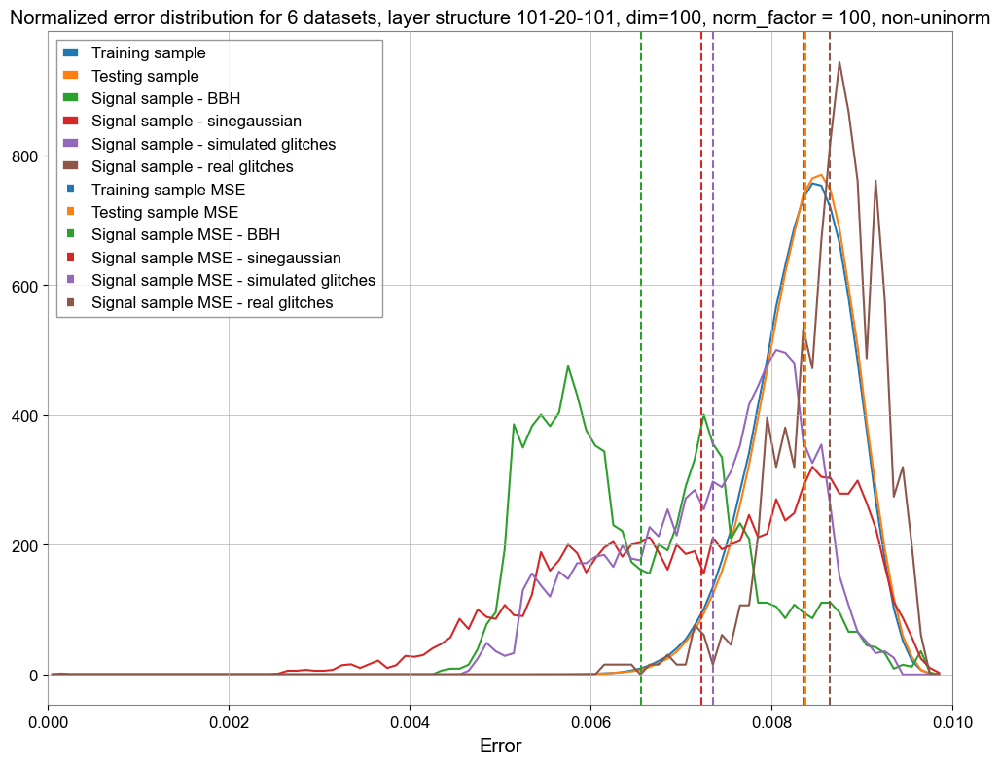

In [391]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 6 datasets, layer structure 101-20-101, dim=100, norm_factor = 100, non-uninorm')
plt.legend()
plt.show()

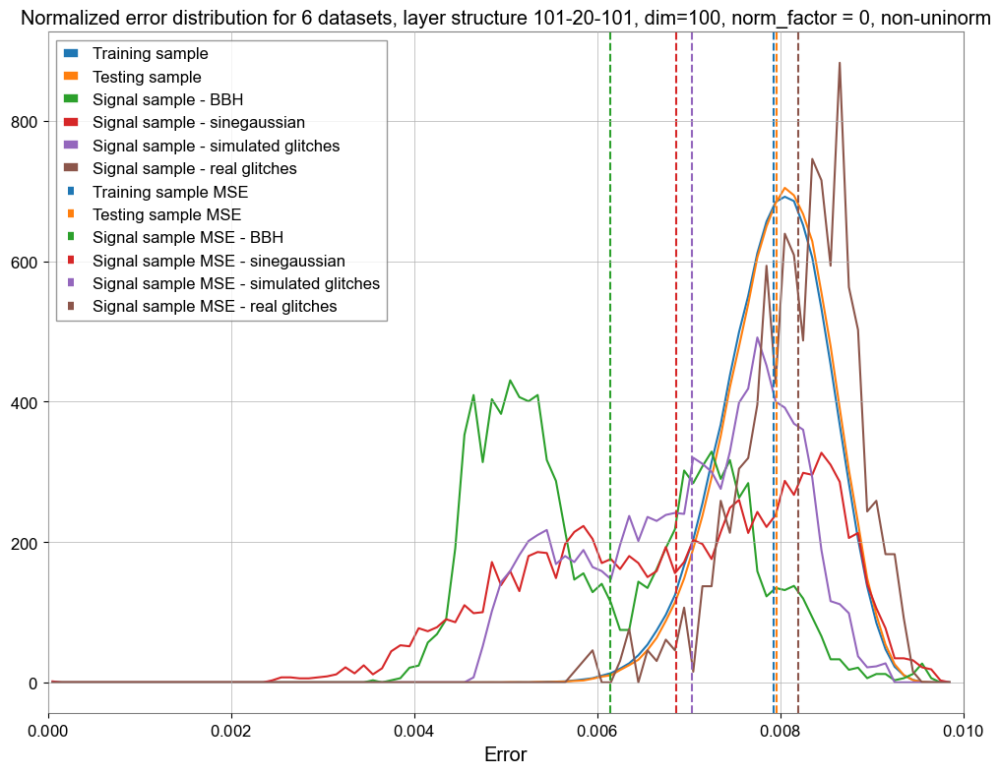

In [234]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(0, 1e-2, 1e-4)

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = bin_scheme, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 6 datasets, layer structure 101-20-101, dim=100, norm_factor = 0, non-uninorm')
plt.legend()
plt.show()

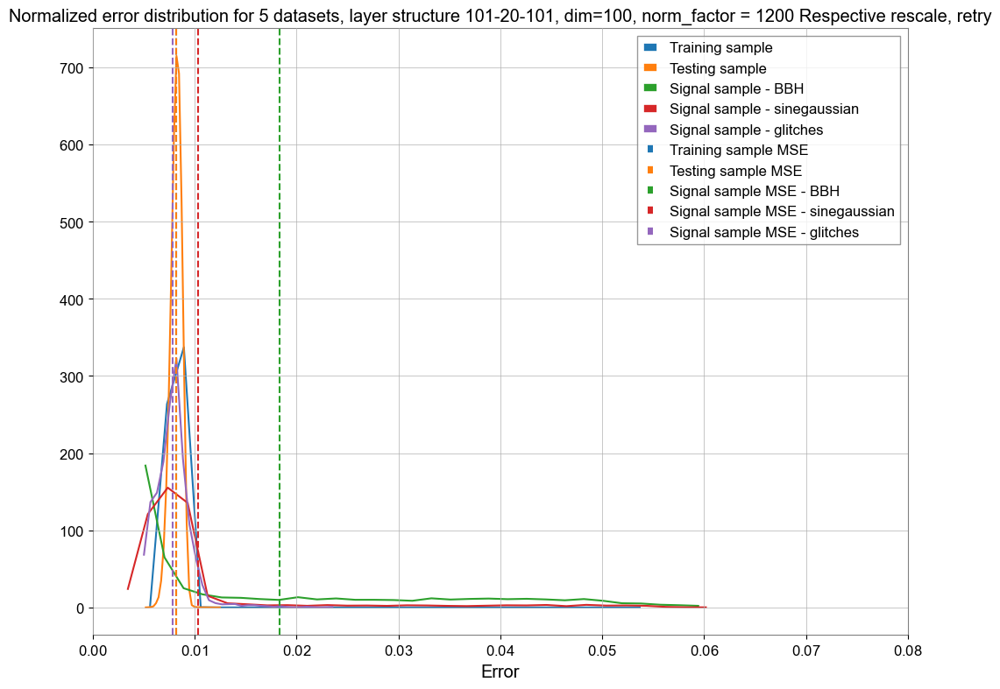

In [643]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = 30, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = 30, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = 30, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = 30, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = 30, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0, 0.08)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=100, norm_factor = 1200 Respective rescale, retry')
plt.legend()
plt.show()

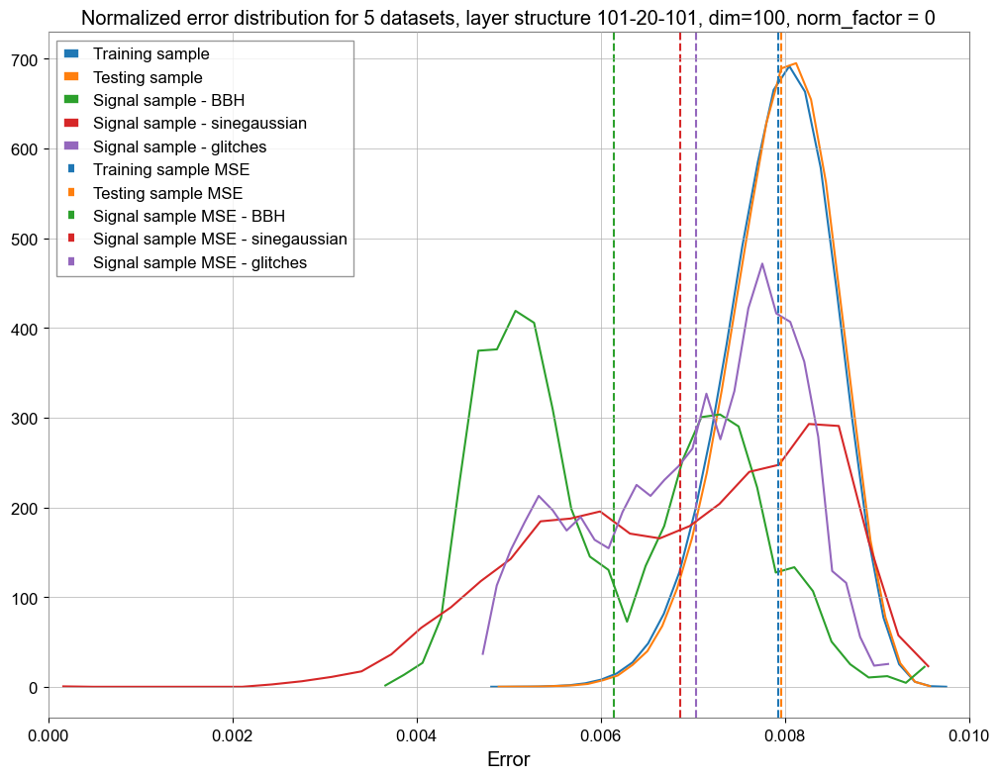

In [58]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = 30, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = 30, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = 30, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = 30, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = 30, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=100, norm_factor = 0')
plt.legend()
plt.show()

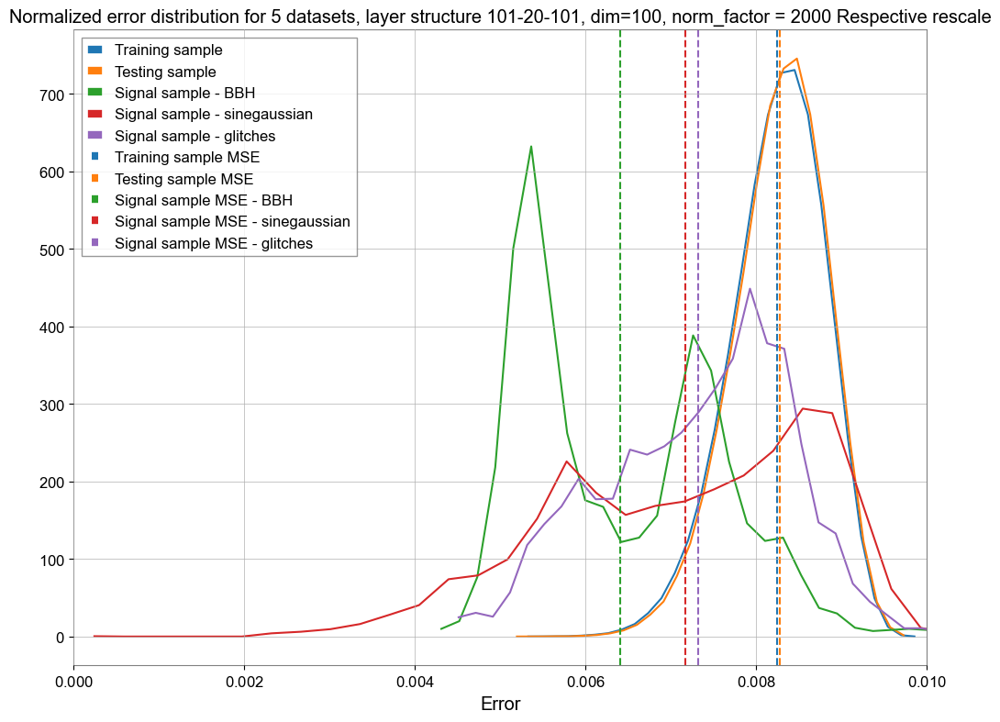

In [475]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = 30, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = 30, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = 30, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = 30, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = 30, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=100, norm_factor = 2000 Respective rescale')
plt.legend()
plt.show()

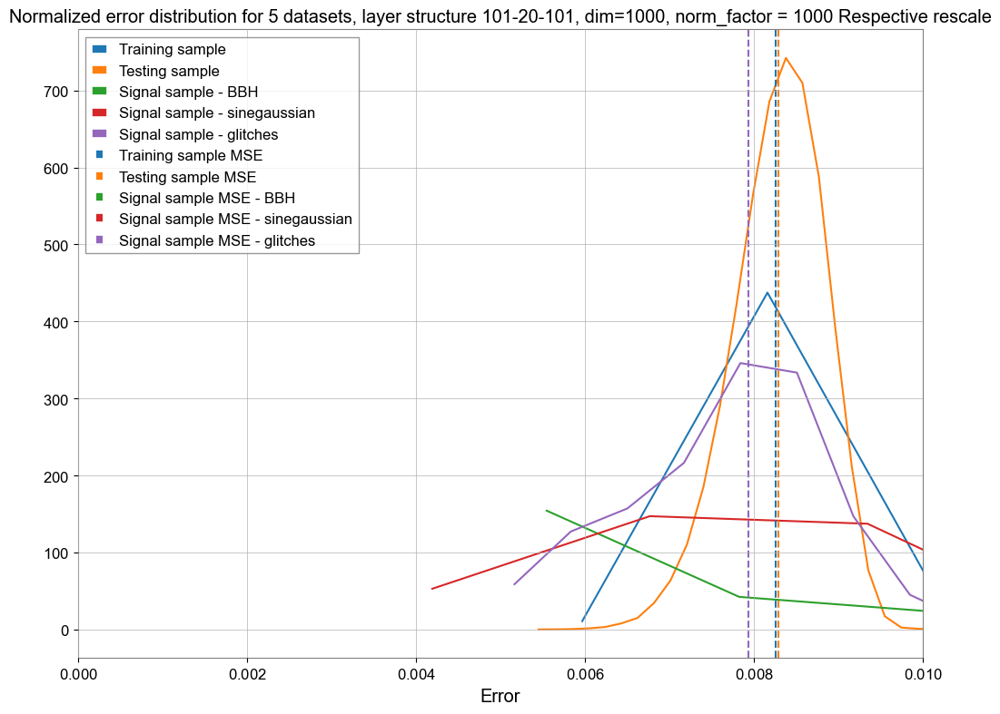

In [496]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output_100d, bins = 30, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output_100d, bins = 30, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output_100d, bins = 30, density = True)
counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = 30, density = True)
counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = 30, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

plt.axvline(x = MSE_train_output_100d, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output_100d, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output_100d, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0, 0.01)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=1000, norm_factor = 1000 Respective rescale')
plt.legend()
plt.show()

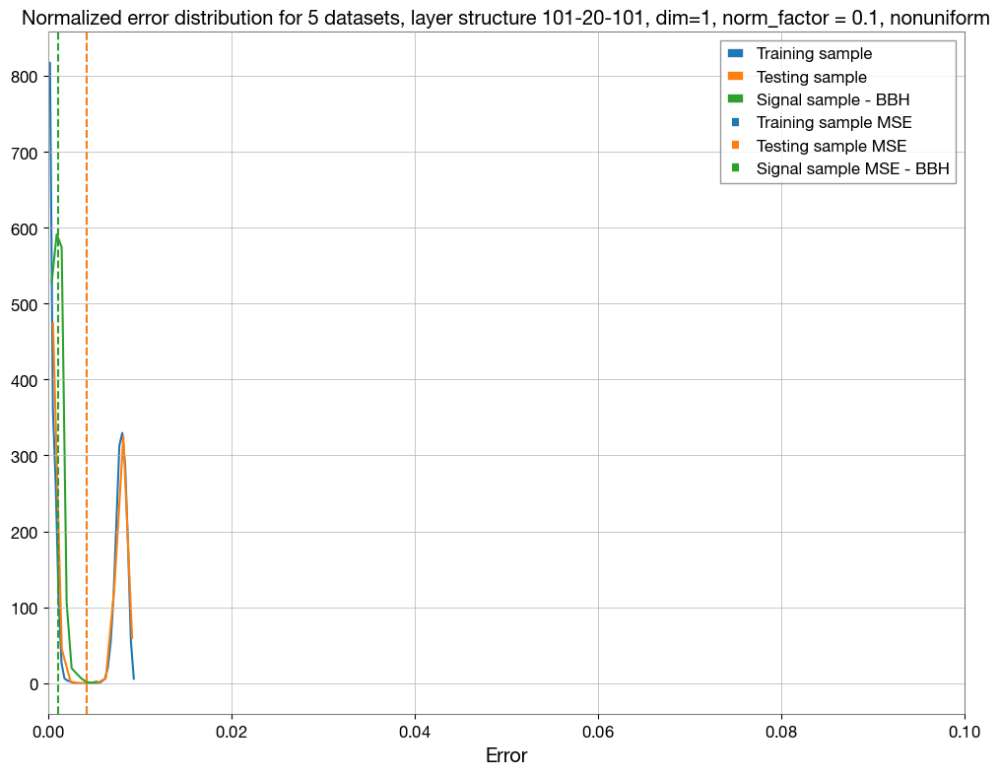

In [160]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

counts_train, bin_position_train = np.histogram(ReconstructedError_train, bins = 30, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test, bins = 10, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected, bins = 10, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output, bins = 10, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output, bins = 10, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

plt.axvline(x = MSE_train, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0, 0.1)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-20-101, dim=1, norm_factor = 0.1, nonuniform')
plt.legend()
plt.show()

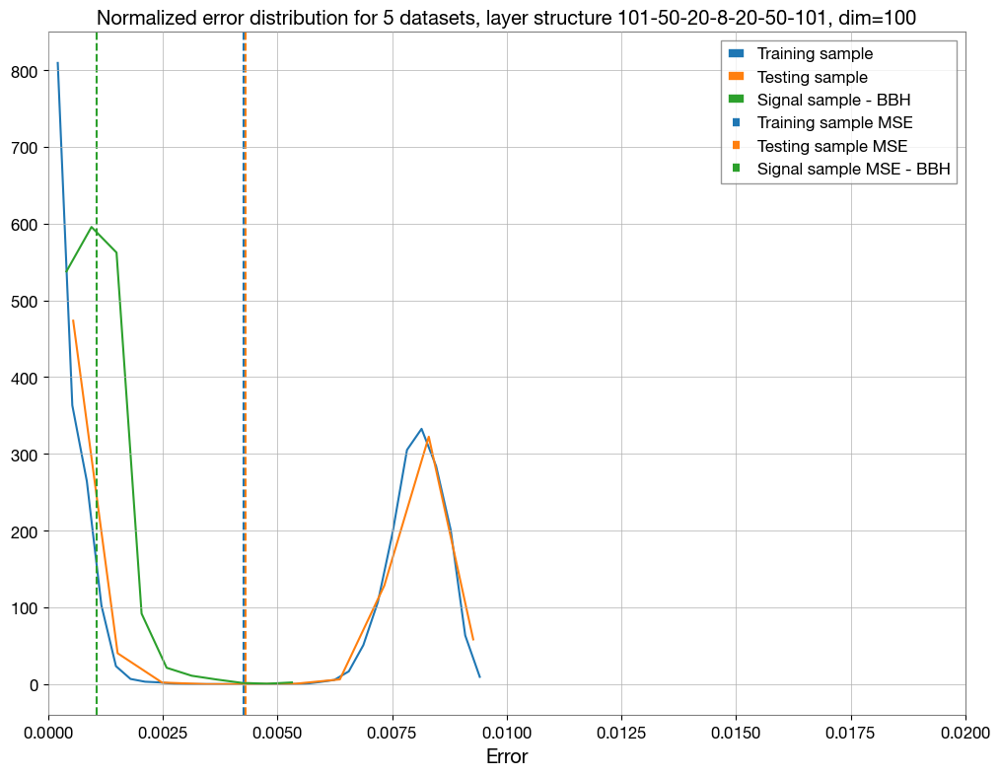

In [162]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

counts_train, bin_position_train = np.histogram(ReconstructedError_train_output, bins = 30, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test_output, bins = 10, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected_output, bins = 10, density = True)
# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output, bins = 10, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output, bins = 10, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - glitches')

plt.axvline(x = MSE_train_output, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test_output, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected_output, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_sinegaussian_output, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output, color = colors[4], linestyle = '--', label = 'Signal sample MSE - glitches')

plt.xlim(0, 0.02)
plt.xlabel('Error')
plt.title('Normalized error distribution for 5 datasets, layer structure 101-50-20-8-20-50-101, dim=100')
plt.legend()
plt.show()

In [15]:
data_entire_event = np.load("../Data_cached/4096Hz25msentiresignalBBH.npy")

In [18]:
np.linalg.norm(data_entire_event, axis = 1)

array([0.21337418, 0.59027121, 0.53051549, 0.59035475,
       0.65949806, 0.77689434, 1.        , 0.69476813])

In [17]:
data_entire_event = data_entire_event / max(np.linalg.norm(data_entire_event, axis = 1))

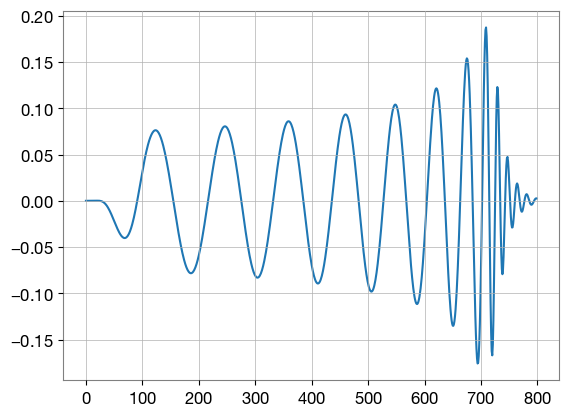

In [29]:
plt.plot(data_entire_event.flatten())

In [19]:
data_entire_event_normalized, _, junk7 = bunch_normalization(data_entire_event)

In [20]:
data_entire_event_normalized = np.hstack((data_entire_event_normalized, np.array(junk7).reshape(8,1)))

In [21]:
data_entire_event_tensored = torch.FloatTensor(data_entire_event_normalized)
_, decodedTestdata = autoencoder(data_entire_event_tensored)
decodedTestdata = decodedTestdata.double()
reconstructedData_entire_event = decodedTestdata.detach().numpy()
ReconstructedError_entire_event = torch.mean((data_entire_event_tensored - reconstructedData_entire_event)**2,dim=1)
MSE_entire_event = ReconstructedError_entire_event.mean()

In [24]:
ReconstructedError_entire_event_output = (data_entire_event_tensored.numpy()[:, :100] - reconstructedData_entire_event[:, :100])**2
MSE_entire_event_output = ReconstructedError_entire_event_output.mean()

In [25]:
ReconstructedError_entire_event_output.shape

(8, 100)

In [28]:
MSE_entire_event_output

0.006532332981059562

Text(0, 0.5, 'MSE')

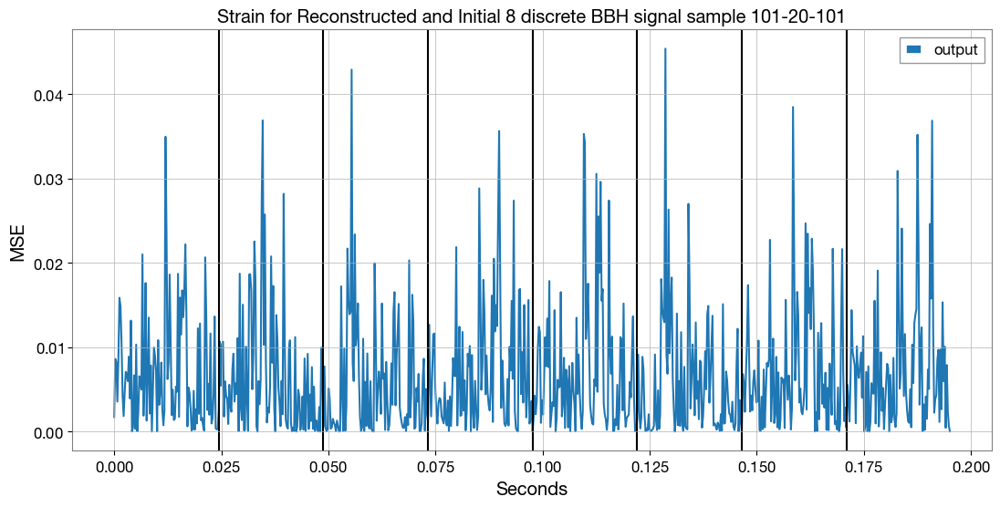

In [42]:
# x = np.arange(0, train_sample_number-1, 1/3)
x = np.arange(0,800/4096,1/4096)
# y = np.zeros((train_sample_number-1, 3))
# for i in range(train_sample_number-1):
#     y[i] = reconstructedData[i] * X_train_recover_coef + X_train_recover_min
y = ReconstructedError_injected_output

plt.figure(figsize=(13,6))
# plt.plot(x, data_glitches_normalized_output.flatten()[0:500], color = 'red', label = 'Input')
plt.plot(x, y[0:8].flatten(), label = 'output')
plt.axvline(x = 100/4096, color = 'black')
plt.axvline(x = 200/4096, color = 'black')
plt.axvline(x = 300/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.axvline(x = 500/4096, color = 'black')
plt.axvline(x = 600/4096, color = 'black')
plt.axvline(x = 700/4096, color = 'black')
# plt.axvline(x = 800/4096, color = 'black')
plt.legend()
plt.title('Strain for Reconstructed and Initial 8 discrete BBH signal sample 101-20-101')
plt.xlabel('Seconds')
plt.ylabel('MSE')

Text(0, 0.5, 'MSE')

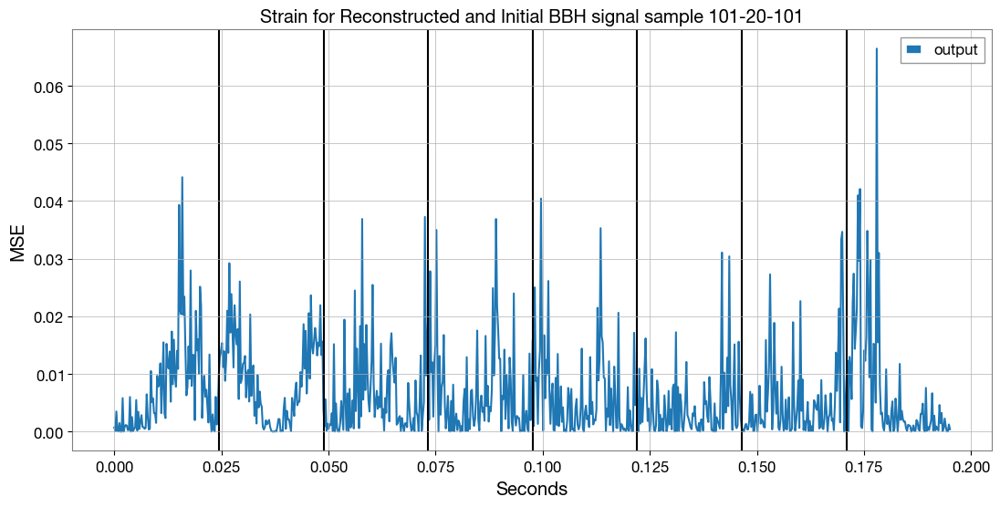

In [27]:
# x = np.arange(0, train_sample_number-1, 1/3)
x = np.arange(0,800/4096,1/4096)
# y = np.zeros((train_sample_number-1, 3))
# for i in range(train_sample_number-1):
#     y[i] = reconstructedData[i] * X_train_recover_coef + X_train_recover_min
y = ReconstructedError_entire_event_output

plt.figure(figsize=(13,6))
# plt.plot(x, data_glitches_normalized_output.flatten()[0:500], color = 'red', label = 'Input')
plt.plot(x, y.flatten(), label = 'output')
plt.axvline(x = 100/4096, color = 'black')
plt.axvline(x = 200/4096, color = 'black')
plt.axvline(x = 300/4096, color = 'black')
plt.axvline(x = 400/4096, color = 'black')
plt.axvline(x = 500/4096, color = 'black')
plt.axvline(x = 600/4096, color = 'black')
plt.axvline(x = 700/4096, color = 'black')
# plt.axvline(x = 800/4096, color = 'black')
plt.legend()
plt.title('Strain for Reconstructed and Initial BBH signal sample 101-20-101')
plt.xlabel('Seconds')
plt.ylabel('MSE')

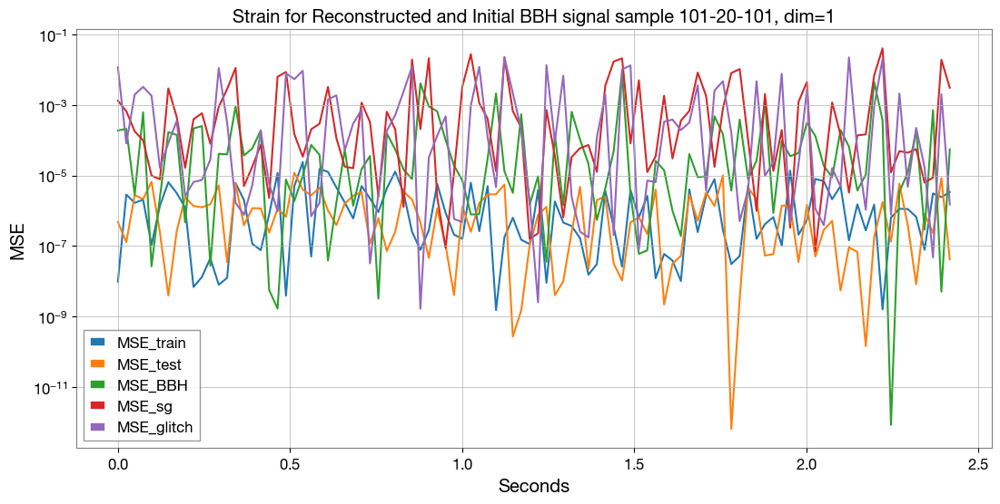

In [93]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
# x = np.arange(0, train_sample_number-1, 1/3)
x = np.arange(0,10000/4096,100/4096)
# y = np.zeros((train_sample_number-1, 3))
# for i in range(train_sample_number-1):
#     y[i] = reconstructedData[i] * X_train_recover_coef + X_train_recover_min
y = ReconstructedError_injected_output

plt.figure(figsize=(13,6))
# plt.plot(x, data_glitches_normalized_output.flatten()[0:500], color = 'red', label = 'Input')
plt.plot(x, ReconstructedError_train_output[0:100].flatten(), label = 'MSE_train')
plt.plot(x, ReconstructedError_test_output[0:100].flatten(), label = 'MSE_test')
plt.plot(x, y[0:100].flatten(), label = 'MSE_BBH')
plt.plot(x, ReconstructedError_sinegaussian_output[0:100].flatten(), label = 'MSE_sg')
plt.plot(x, ReconstructedError_glitches_output[0:100].flatten(), label = 'MSE_glitch')
# plt.axvline(x = 100/4096, color = 'black')
# plt.axvline(x = 200/4096, color = 'black')
# plt.axvline(x = 300/4096, color = 'black')
# plt.axvline(x = 400/4096, color = 'black')
# plt.axvline(x = 500/4096, color = 'black')
# plt.axvline(x = 600/4096, color = 'black')
# plt.axvline(x = 700/4096, color = 'black')
# plt.axvline(x = 800/4096, color = 'black')
plt.legend()
plt.title('Strain for Reconstructed and Initial BBH signal sample 101-20-101, dim=1')
plt.xlabel('Seconds')
plt.ylabel('MSE')
plt.yscale('log')

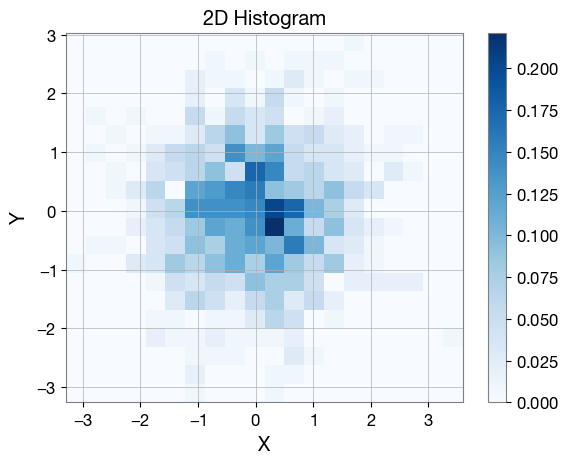

In [98]:
import numpy as np
import matplotlib.pyplot as plt

# 生成随机二维数据
x = np.random.randn(1000)
y = np.random.randn(1000)

# 绘制二维直方图
plt.hist2d(x, y, bins=20, cmap='Blues', density='True')

# 添加颜色条
plt.colorbar()

# 添加标题和轴标签
plt.title('2D Histogram')
plt.xlabel('X')
plt.ylabel('Y')
# plt.yscale('log')

# 显示图形
plt.show()

In [167]:
ReconstructedError_train_output_1d.shape

(7000,)

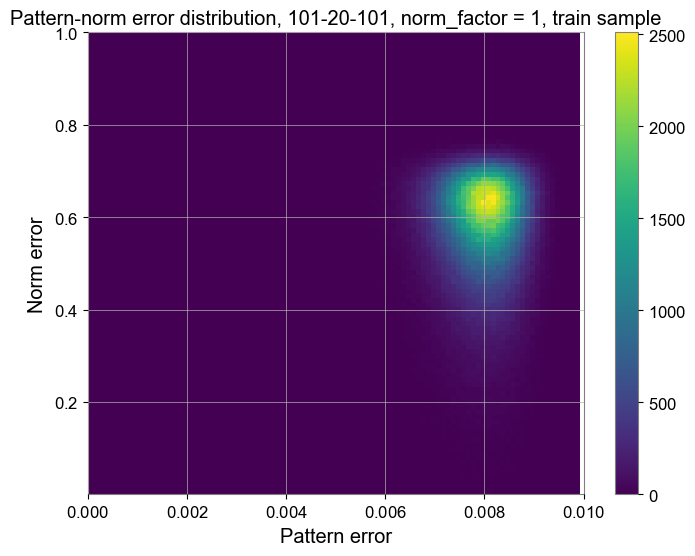

In [595]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, num = 100)


# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_100d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])
hist_bunch_noise = hist

# 可视化二维直方图
# aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist_bunch_noise.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 1, train sample')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\910871162.py:13: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist_bunch_noise)


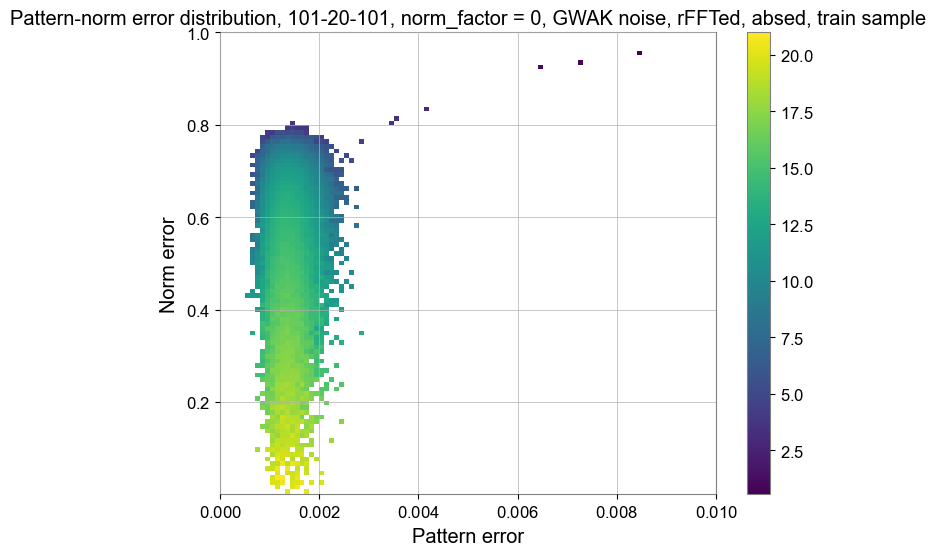

In [37]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist_bunch_noise, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_100d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y], density='True')
hist = np.log(hist_bunch_noise)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, GWAK noise, rFFTed, absed, train sample')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\1611563375.py:13: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


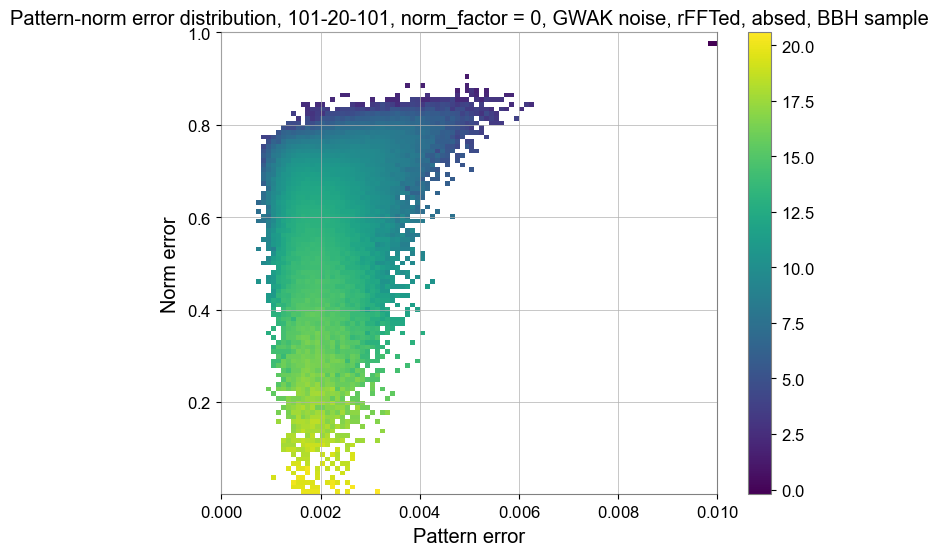

In [35]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.02, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_100d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y], density='True')
hist = np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, GWAK noise, rFFTed, absed, BBH sample')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

In [38]:
mask = np.argwhere(hist_bunch_noise != 0)

In [39]:
def hist_mask(hist, mask):
    sum = hist.sum()
    mask_Boolen = np.zeros((len(hist), len(hist)), dtype=bool)
    mask_Boolen[mask[:, 0], mask[:, 1]] = True
    hist[mask_Boolen] = 0
    sum_masked = hist.sum()
    print(sum, sum_masked)
    TPR = sum_masked/sum
    return hist,TPR

69926.0 0.0
0.0


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\4200416169.py:15: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


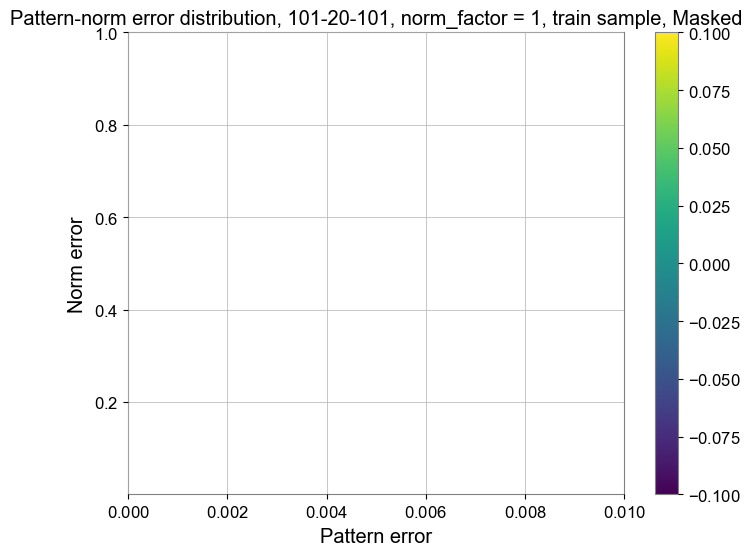

In [40]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, num=100)


# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_100d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])
hist, TPR_train_10 = hist_mask(hist, mask)
hist = np.log(hist)

print(TPR_train_10)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 1, train sample, Masked')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

99938.0 31318.0
0.31337429206107786


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\528673340.py:15: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


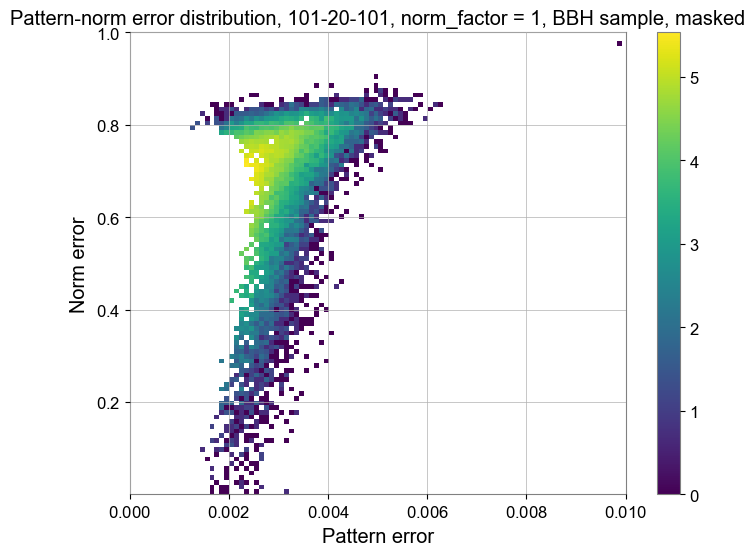

In [41]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_100d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])
hist, TPR_BBH_10 = hist_mask(hist, mask)

hist = np.log(hist)

print(TPR_BBH_10)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 1, BBH sample, masked')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

In [44]:
y_edges.shape

(100,)

In [48]:
id_outliner = np.zeros(0, dtype=int)

x = ReconstructedError_injected_output_100d
y = ReconstructedError_injected_output_1d

for i in range(len(mask)):
    id_outliner_cache = np.argwhere((x >= x_edges[mask[i][0]]) & (x <= x_edges[mask[i][0] + 1]) &
                      (y >= y_edges[mask[i][1]]) & (y <= y_edges[mask[i][1] + 1]))

    id_outliner = np.append(id_outliner, id_outliner_cache[:, 0])

# 打印事件ID
print(id_outliner)

[22032 70889 31901 ... 62054 92245 95188]


In [50]:
id_outliner.shape

(68620,)

In [52]:
np.save('../Data_cached/id_for_outliner_for_BBH_in_FFT_study.npy', id_outliner)

In [56]:
id_outliner = np.load('../Data_cached/id_for_outliner_for_BBH_in_timeseries_study.npy')

13994.0 11573.0
0.8269972845505217


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\1875738164.py:15: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


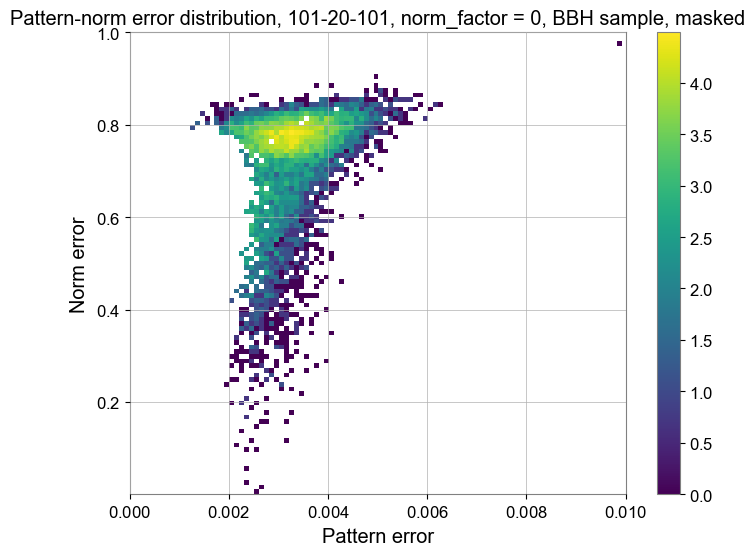

In [64]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_100d[id_outliner],ReconstructedError_injected_output_1d[id_outliner], bins=[bins_x, bins_y])
hist, TPR_BBH_10 = hist_mask(hist, mask)

hist = np.log(hist)

print(TPR_BBH_10)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, BBH sample, masked')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

In [69]:
id_outliner.shape

(13999,)

In [91]:
id_outliner_1 = np.zeros(0, dtype=int)

x = ReconstructedError_injected_output_100d[id_outliner]
y = ReconstructedError_injected_output_1d[id_outliner]
ids = id_outliner

for i in range(len(mask)):
    id_outliner_cache = np.argwhere((x >= x_edges[mask[i][0]]) & (x <= x_edges[mask[i][0]+1]) &
                      (y >= y_edges[mask[i][1]]) & (y <= y_edges[mask[i][1]+1]))

    id_outliner_1 = np.append(id_outliner_1, ids[id_outliner_cache[:, 0]])

# 打印事件ID
print(id_outliner_1.shape)

(2421,)


In [88]:
print(np.sort(id_outliner))

[   23    31    32 ... 99954 99958 99959]


In [92]:
np.sort(id_outliner_1)

array([  121,   135,   384, ..., 99931, 99934, 99959],
      dtype=int64)

In [95]:
np.save('../Data_cached/id_for_outliner_for_BBH_in_timeseries_in_FFT.npy',np.setdiff1d(id_outliner,id_outliner_1))

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\3767007740.py:15: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


0.8269972845505217


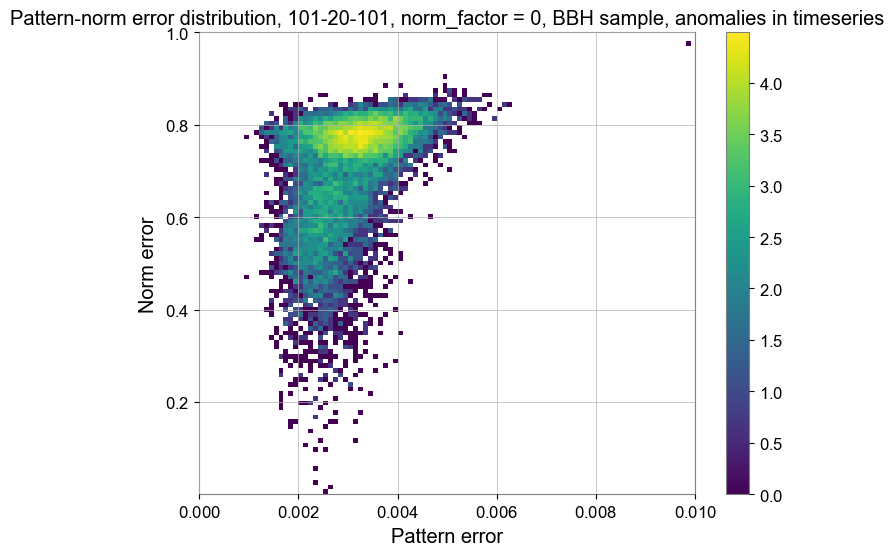

In [60]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_100d[id_outliner],ReconstructedError_injected_output_1d[id_outliner], bins=[bins_x, bins_y])
# hist, TPR_BBH_10 = hist_mask(hist, mask)

hist = np.log(hist)

print(TPR_BBH_10)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, BBH sample, anomalies in timeseries')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

0.8269972845505217


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\2058938585.py:17: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


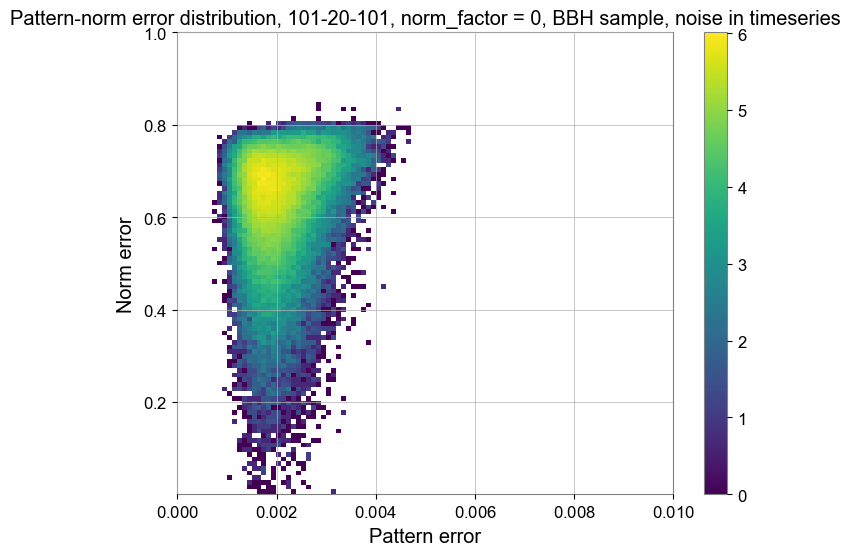

In [63]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

id_noise = np.setdiff1d(np.arange(100000), id_outliner).astype(int)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_100d[id_noise],ReconstructedError_injected_output_1d[id_noise], bins=[bins_x, bins_y])
# hist, TPR_BBH_10 = hist_mask(hist, mask)

hist = np.log(hist)

print(TPR_BBH_10)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, BBH sample, noise in timeseries')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_7736\2946447.py:13: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


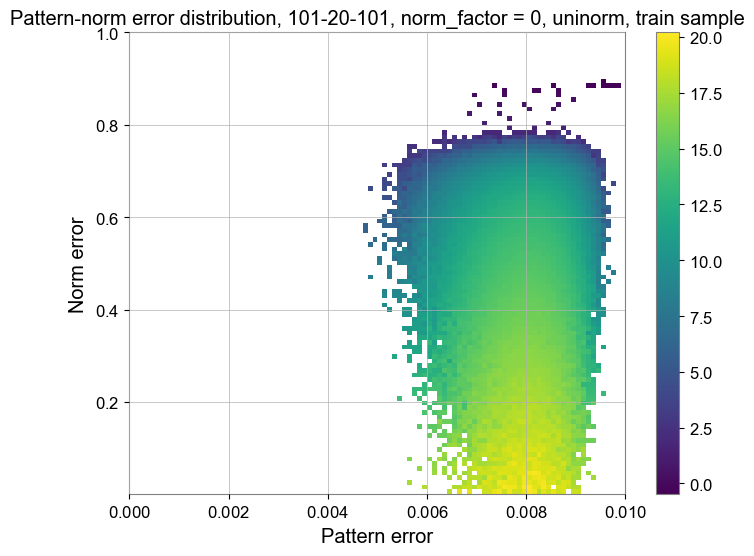

In [82]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_100d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y], density='True')
hist = np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, uninorm, train sample')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_7736\3317907702.py:13: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


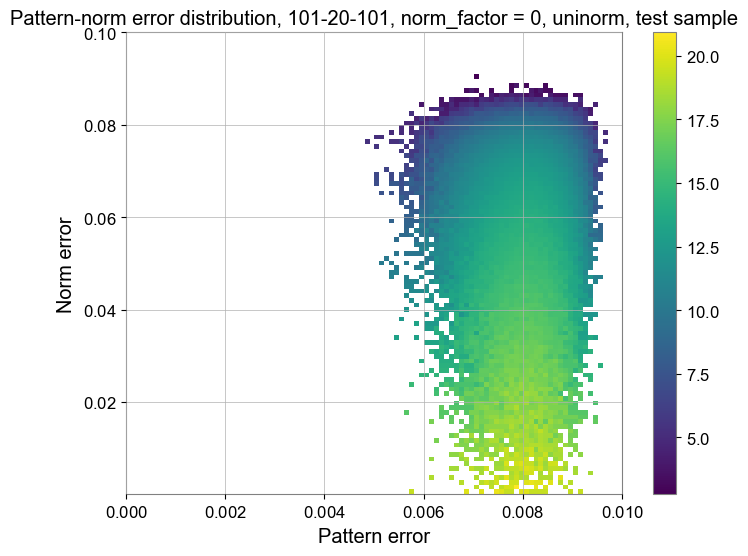

In [83]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, -1, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_test_output_100d,ReconstructedError_test_output_1d, bins=[bins_x, bins_y], density='True')
hist = np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, uninorm, test sample')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

In [31]:
ReconstructedError_injected_output_1d.min()

1.5288605936802924e-09

In [136]:
np.argwhere(ReconstructedError_injected_output_100d < 0.03).shape

(2302, 1)

In [132]:
np.sort(ReconstructedError_injected_output_100d)

array([0.0044081 , 0.00444723, 0.00450076, ..., 0.07149639,
       0.07181958, 0.07279819])

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_7736\3547809014.py:13: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


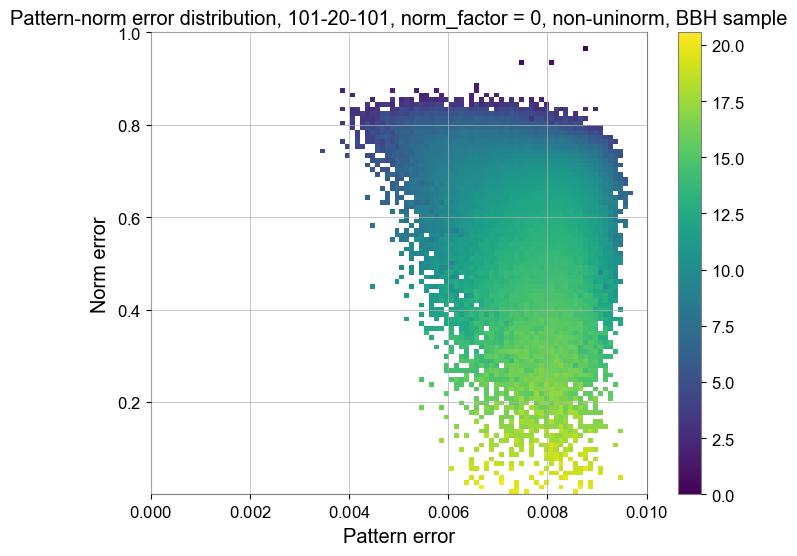

In [599]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.02, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_100d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y], density='True')
hist = np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, non-uninorm, BBH sample')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_10772\3210044152.py:13: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


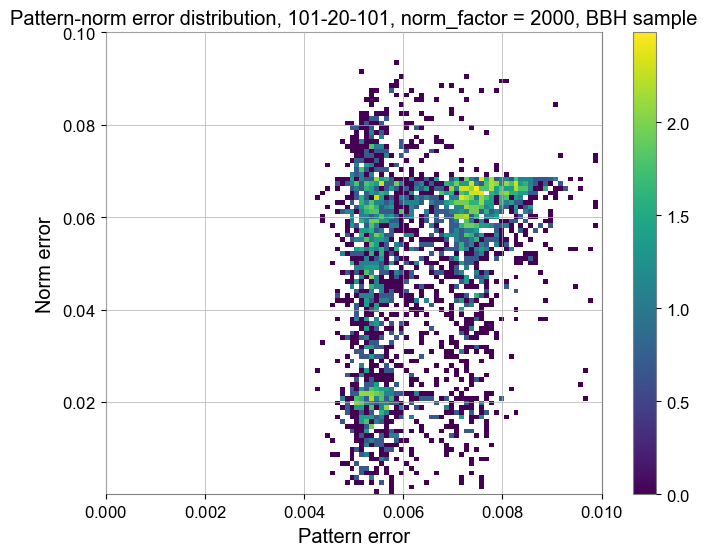

In [476]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, -1, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_100d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])
hist = np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, uninorm, BBH sample')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, 0.01)
# plt.yticks(np.arange(-9, 0, 100))

# 显示图形
plt.show()

In [27]:
hist.sum()

3346.0

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12744\2140996338.py:13: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


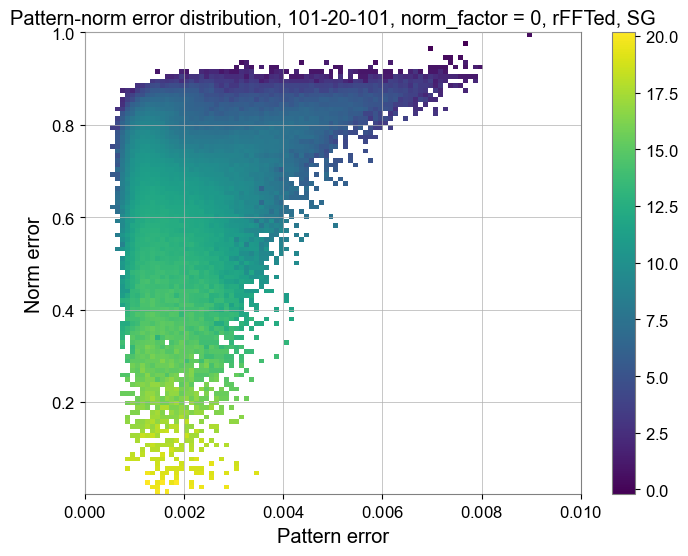

In [201]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_sinegaussian_output_100d,ReconstructedError_sinegaussian_output_1d, bins=[bins_x, bins_y], density='True')
hist = np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, rFFTed, SG')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_7736\3758312172.py:13: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


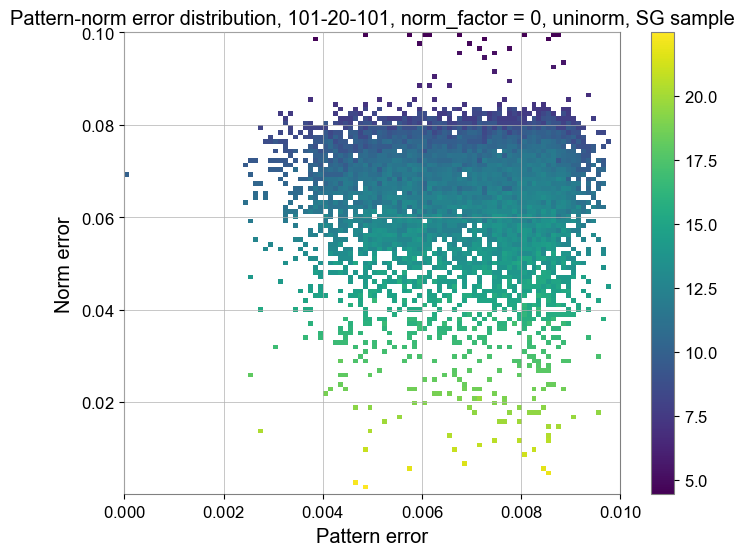

In [85]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, -1, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_sinegaussian_output_100d,ReconstructedError_sinegaussian_output_1d, bins=[bins_x, bins_y], density='True')
hist = np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, uninorm, SG sample')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_7736\832992668.py:13: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


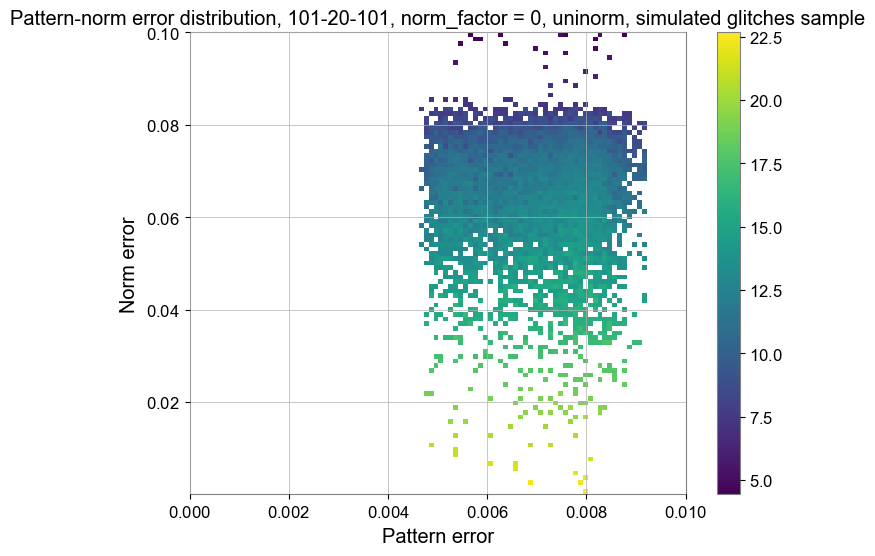

In [114]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, -1, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_glitches_output_100d,ReconstructedError_glitches_output_1d, bins=[bins_x, bins_y], density='True')
hist = np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, uninorm, simulated glitches sample')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_7736\4088686220.py:13: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


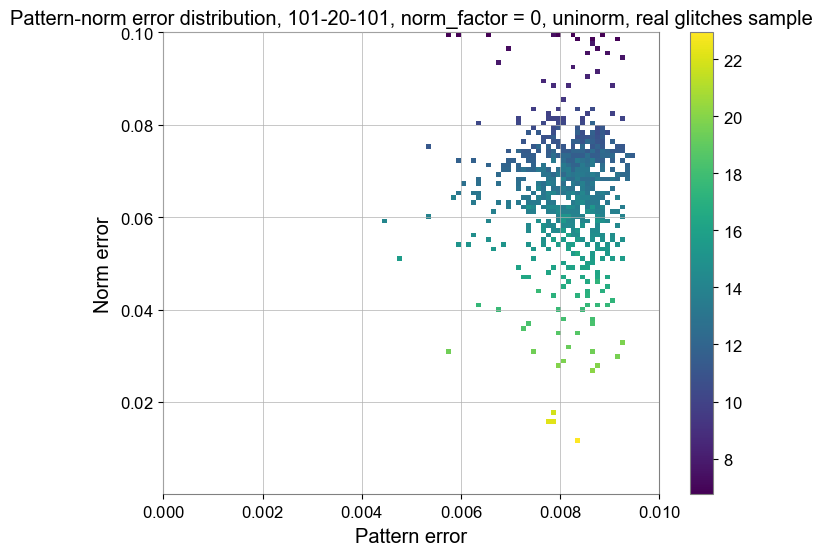

In [113]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, -1, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_glitches_real_output_100d,ReconstructedError_glitches_real_output_1d, bins=[bins_x, bins_y], density='True')
hist = np.log(hist)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 0, uninorm, real glitches sample')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

In [247]:
bunch_noise_hist = hist.flatten()

In [248]:
bunch_noise_hist = np.sort(bunch_noise_hist)

In [249]:
print(bunch_noise_hist)

[       -inf        -inf        -inf ... 22.71516141 22.72867513
 22.84869281]


In [254]:
threshold = 0.05 * len(data_bunch_noise)
sum = 0
i=0
while(sum < threshold):
    sum += 10 ** bunch_noise_hist[i]
    i += 1 
    
bunch_noise_hist[i]

4.327870104867369

In [255]:
sum

50737.689394174144

In [269]:
def set_values_less_than(arr, value):
    arr[arr < value] = -np.inf
    return arr

hist_FPR_005 = set_values_less_than(hist, bunch_noise_hist[i])

In [270]:
hist_FPR_005

array([[-inf, -inf, -inf, ..., -inf, -inf, -inf],
       [-inf, -inf, -inf, ..., -inf, -inf, -inf],
       [-inf, -inf, -inf, ..., -inf, -inf, -inf],
       ...,
       [-inf, -inf, -inf, ..., -inf, -inf, -inf],
       [-inf, -inf, -inf, ..., -inf, -inf, -inf],
       [-inf, -inf, -inf, ..., -inf, -inf, -inf]])

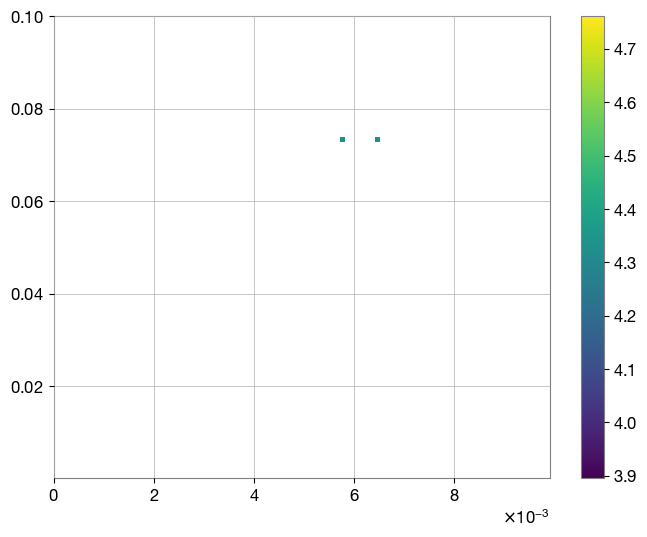

In [271]:
plt.figure(figsize=(8, 6)) 
plt.imshow(hist_FPR_005.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

In [596]:
mask = np.argwhere(hist_bunch_noise != 0)

In [237]:
def hist_mask(hist, mask):
    sum = hist.sum()
    mask_Boolen = np.zeros((len(hist), len(hist)), dtype=bool)
    mask_Boolen[mask[:, 0], mask[:, 1]] = True
    hist[mask_Boolen] = 0
    sum_masked = hist.sum()
    print(sum, sum_masked)
    TPR = sum_masked/sum
    return hist,TPR

In [74]:
mask[:,0].shape

(1835,)

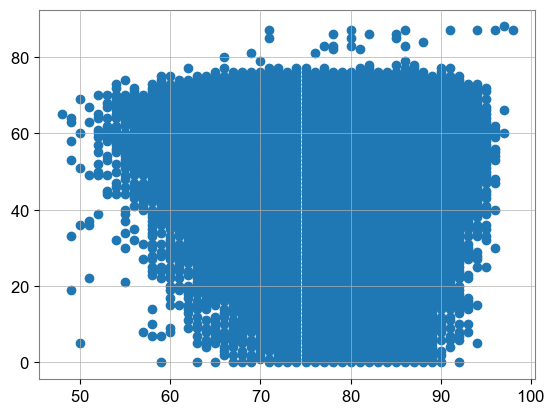

In [276]:
plt.scatter(mask[:,0], mask[:,1])

699215.0 0.0
0.0


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_10772\4200416169.py:15: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


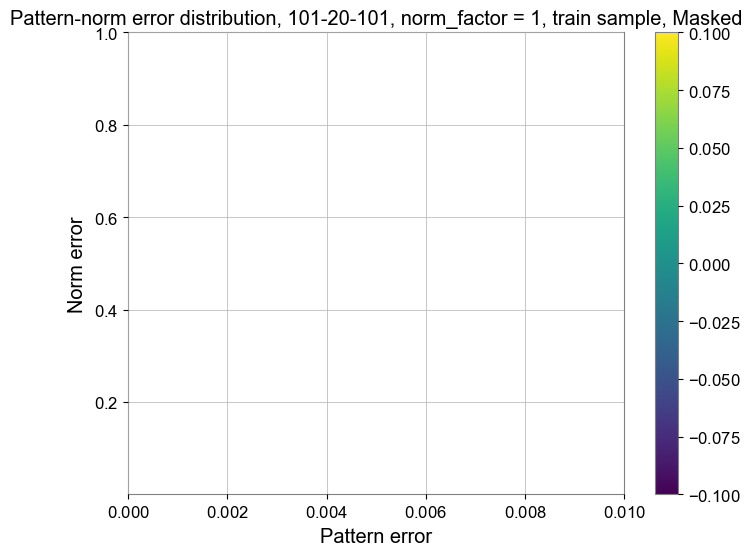

In [597]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, num=100)


# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_100d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])
hist, TPR_train_10 = hist_mask(hist, mask)
hist = np.log(hist)

print(TPR_train_10)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 1, train sample, Masked')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

199775.0 61.0
0.0003053435114503817


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_10772\1690239097.py:14: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


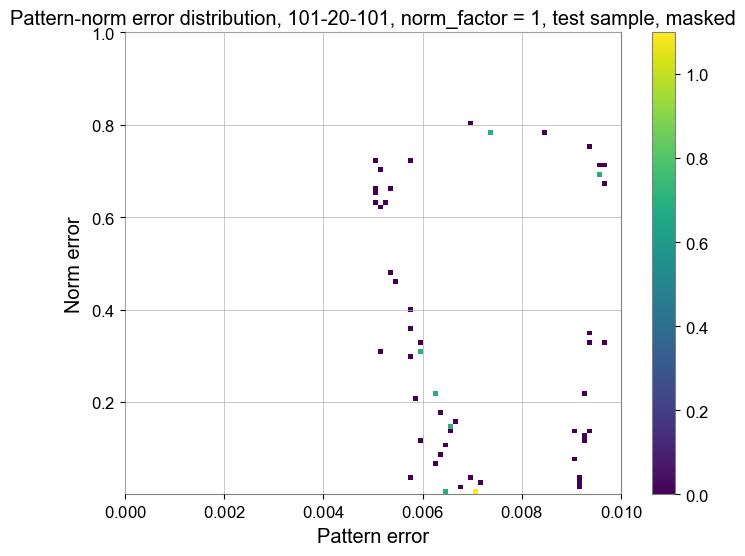

In [599]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_test_output_100d,ReconstructedError_test_output_1d, bins=[bins_x, bins_y])
hist, TPR_test_10 = hist_mask(hist, mask)
hist = np.log(hist)

print(TPR_test_10)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 1, test sample, masked')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

3346.0 2778.0
0.8302450687387926


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_10772\528673340.py:15: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


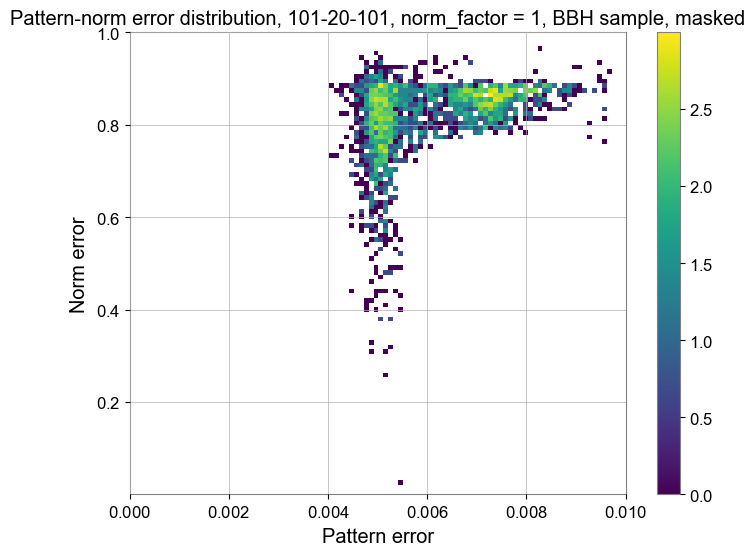

In [598]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_injected_output_100d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])
hist, TPR_BBH_10 = hist_mask(hist, mask)

hist = np.log(hist)

print(TPR_BBH_10)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 1, BBH sample, masked')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
# plt.yscale('log')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

In [35]:
np.argmax(hist)

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 72, 72,
       74, 76, 43, 66, 56, 39, 30, 39, 37, 25, 31, 43,  2, 46,
       47, 45, 57, 39, 28, 36, 48, 59, 65, 50, 47, 51, 39, 52,
       30, 54, 39, 41, 36, 55, 64, 59, 59, 60, 85, 71, 85, 60,
       87, 78, 74, 86, 86, 87, 86, 86, 76, 86, 45, 53, 90,  0,
        0], dtype=int64)

6898.0 5366.0
0.7779066396056828


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_10772\741619200.py:14: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


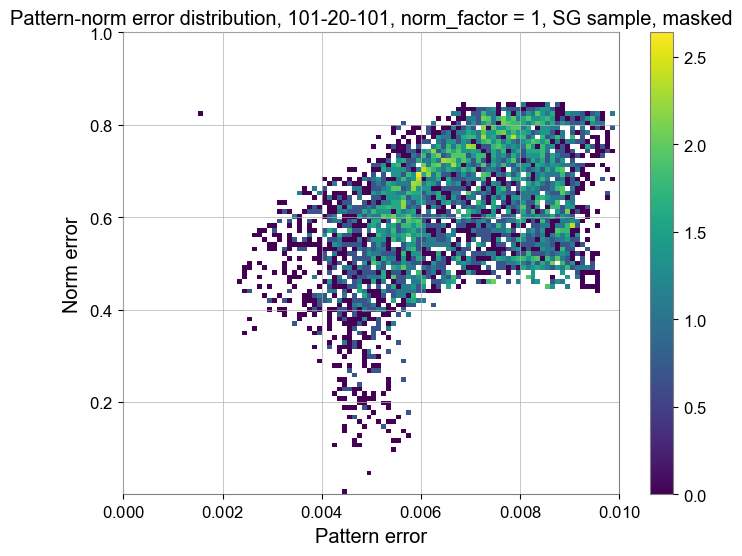

In [552]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_sinegaussian_output_100d,ReconstructedError_sinegaussian_output_1d, bins=[bins_x, bins_y])
hist, TPR_SG_10 = hist_mask(hist, mask)
hist = np.log(hist)

print(TPR_SG_10)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 1, SG sample, masked')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

6950.0 4561.0
0.6562589928057554


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_10772\1707640681.py:14: RuntimeWarning: divide by zero encountered in log
  hist = np.log(hist)


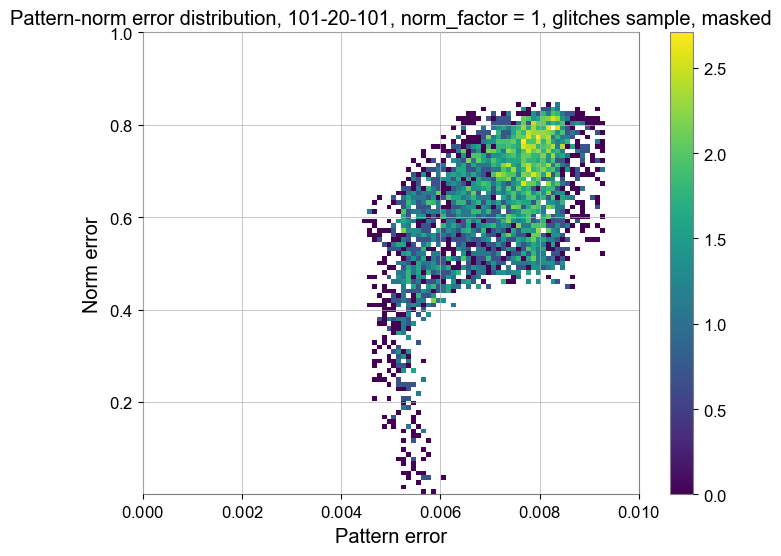

In [553]:
# 生成随机二维数据
# x = np.random.randn(1000)
# y = np.random.randn(1000)

# 指定直方图箱的数量
bins_x = np.arange(0, 0.01, 1e-4)
# bins_x = np.logspace(-3, -1, 50)
# bins_y = [1e-8, 2e-8, 3e-8, 4e-8, 5e-8, 6e-8, 7e-8, 8e-8, 9e-8, 1e-7, 2e-7, 3e-7, 4e-7, 5e-7, 6e-7, 7e-7, 8e-7, 9e-7, 1e-6, 2e-6, 3e-6, 4e-6, 5e-6, 6e-6, 7e-6, 8e-6, 9e-6, 1e-5, 2e-5, 3e-5, 4e-5, 5e-5, 6e-5, 7e-5, 8e-5, 9e-5, 1e-4, 2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 9e-4, 1e-3, 2e-3, 3e-3, 4e-3, 5e-3, 6e-3, 7e-3, 8e-3, 9e-3, 1e-2, 2e-2, 3e-2, 4e-2, 5e-2, 6e-2, 7e-2, 8e-2, 9e-2, 1e-1, 2e-1, 3e-1, 4e-1, 5e-1, 6e-1, 7e-1]
bins_y = np.logspace(-9, 0, 100)

# 计算二维直方图的统计数据
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_glitches_output_100d,ReconstructedError_glitches_output_1d, bins=[bins_x, bins_y])
hist, TPR_glitches_10 = hist_mask(hist, mask)
hist = np.log(hist)

print(TPR_glitches_10)

# 可视化二维直方图
aspect_ratio = (bins_x[-1]-bins_x[0])/(bins_y[-1] - bins_y[0])
plt.figure(figsize=(8, 6)) 
plt.imshow(hist.T, origin='lower', extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]], aspect='auto')
plt.colorbar()

# 添加标题和轴标签
plt.title('Pattern-norm error distribution, 101-20-101, norm_factor = 1, glitches sample, masked')
plt.xlabel('Pattern error')
plt.ylabel('Norm error')
plt.xscale('linear')
plt.yscale('linear')
plt.xlim(0, 0.01)

# 显示图形
plt.show()

In [166]:
def upperTPRFPRcalc(trainerror, signalerror, FPRlist):
    TPRlist = np.zeros(len(FPRlist))
    length_of_train_sample = len(trainerror)
    # print(length_of_train_sample)
    length_of_signal_value = len(signalerror)
    # print(length_of_signal_value)
    
    for i in range(len(FPRlist)):
        index_number = int(length_of_train_sample * FPRlist[i])
        threshold = np.sort(trainerror)[-index_number]
            
        # print(threshold)
        # print(np.argwhere(signalerror > threshold).shape)
        TPRlist[i] = np.argwhere(signalerror > threshold).shape[0] / length_of_signal_value
    
    return TPRlist

In [167]:
def lowerTPRFPRcalc(trainerror, signalerror, FPRlist):
    TPRlist = np.zeros(len(FPRlist))
    length_of_train_sample = len(trainerror)
    # print(length_of_train_sample)
    length_of_signal_value = len(signalerror)
    # print(length_of_signal_value)
    
    for i in range(len(FPRlist)):
        index_number = int(length_of_train_sample * FPRlist[i])
        if index_number == 0:
            threshold = np.sort(trainerror)[index_number]
        else:
            threshold = np.sort(trainerror)[index_number-1]
        # print(np.sort(trainerror))
        # print(threshold)
        # print(np.argwhere(signalerror < threshold).shape)
        TPRlist[i] = np.argwhere(signalerror < threshold).shape[0] / length_of_signal_value
    
    return TPRlist

In [168]:
FPR_list = np.logspace(-3,0,30)

In [169]:
TPR_list_test = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_test_output_100d.flatten(), FPR_list)
TPR_list_BBH = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_injected_output_100d.flatten(), FPR_list)
TPR_list_SG = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_sinegaussian_output_100d.flatten(), FPR_list)
TPR_list_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_output_100d.flatten(), FPR_list)
# TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_output_100d.flatten(), FPR_list)

In [580]:
TPR_list_test = lowerTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_test_output_100d.flatten(), FPR_list)
TPR_list_BBH = lowerTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_injected_output_100d.flatten(), FPR_list)
TPR_list_SG = lowerTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_sinegaussian_output_100d.flatten(), FPR_list)
TPR_list_real_glitches = lowerTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_real_output_100d.flatten(), FPR_list)
TPR_list_fake_glitches = lowerTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_output_100d.flatten(), FPR_list)

In [583]:
TPR_list_test = upperTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_test_output_1d.flatten(), FPR_list)
TPR_list_BBH = upperTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_injected_output_1d.flatten(), FPR_list)
TPR_list_SG = upperTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_sinegaussian_output_1d.flatten(), FPR_list)
TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_glitches_real_output_1d.flatten(), FPR_list)
TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_glitches_output_1d.flatten(), FPR_list)

In [586]:
TPR_list_test = lowerTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_test_output_1d.flatten(), FPR_list)
TPR_list_BBH = lowerTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_injected_output_1d.flatten(), FPR_list)
TPR_list_SG = lowerTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_sinegaussian_output_1d.flatten(), FPR_list)
TPR_list_real_glitches = lowerTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_glitches_real_output_1d.flatten(), FPR_list)
TPR_list_fake_glitches = lowerTPRFPRcalc(ReconstructedError_train_output_1d.flatten(), ReconstructedError_glitches_output_1d.flatten(), FPR_list)

In [584]:
TPR_list_test[-1] = 1
TPR_list_BBH[-1] = 1
TPR_list_SG[-1] = 1
TPR_list_real_glitches[-1] = 1
TPR_list_fake_glitches[-1] = 1

Text(0.5, 1.0, 'ROC curve for 101-20-101 DNN AE, pattern error, norm factor = 0, GWAK noise, rFFTed, absed, upper side')

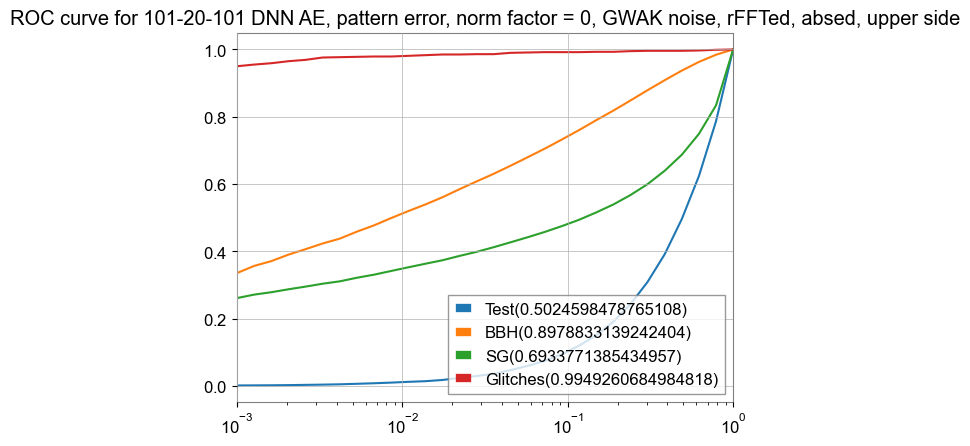

In [176]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

plt.plot(FPR_list, TPR_list_test, color = colors[0], label = "Test(" + str(auc(FPR_list, TPR_list_test)) + ")")
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = "BBH(" + str(auc(FPR_list, TPR_list_BBH)) + ")")
plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = "SG(" + str(auc(FPR_list, TPR_list_SG)) + ")")
plt.plot(FPR_list, TPR_list_glitches, color = colors[3], label = "Glitches(" + str(auc(FPR_list, TPR_list_glitches)) + ")")
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('ROC curve for 101-20-101 DNN AE, pattern error, norm factor = 0, GWAK noise, rFFTed, absed, upper side')

Text(0.5, 1.0, 'ROC curve for 101-40-101 DNN AE, pattern error, norm factor = 0, GWAK noise, rFFTed, absed, upper side')

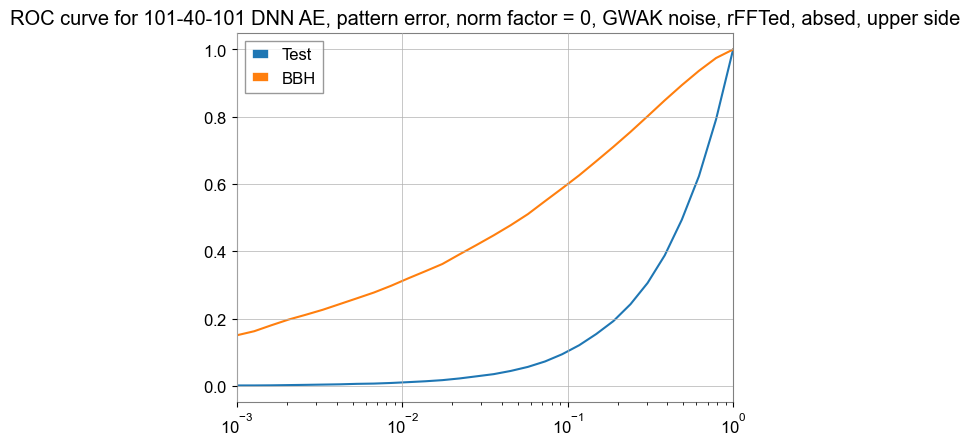

In [206]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')
# plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG')
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('ROC curve for 101-40-101 DNN AE, pattern error, norm factor = 0, GWAK noise, rFFTed, absed, upper side')

Text(0.5, 1.0, 'ROC curve for 101-20-101 DNN AE, bunch, pattern error, norm factor = 0, non-uninorm, norm permutated, lower side')

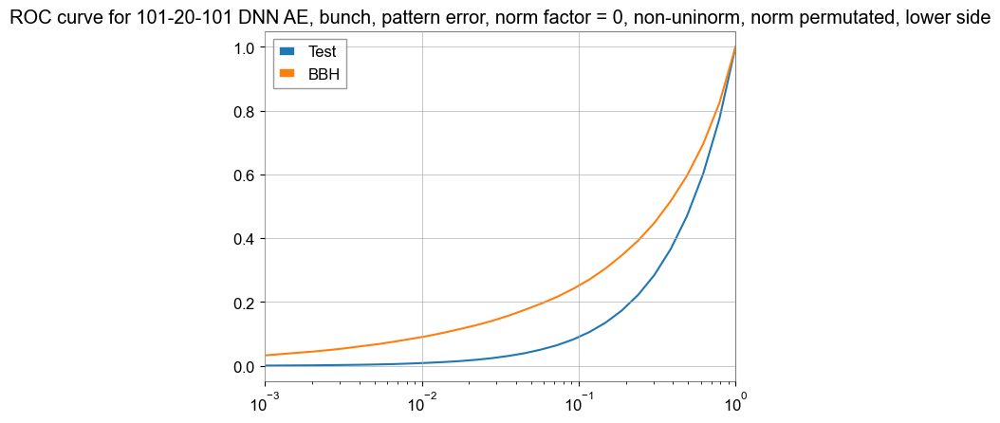

In [582]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')
# plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG')
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('ROC curve for 101-20-101 DNN AE, bunch, pattern error, norm factor = 0, non-uninorm, norm permutated, lower side')

Text(0.5, 1.0, 'ROC curve for 101-20-101 DNN AE, bunch, norm error, norm factor = 0, non-uninorm, norm permutated, upper side')

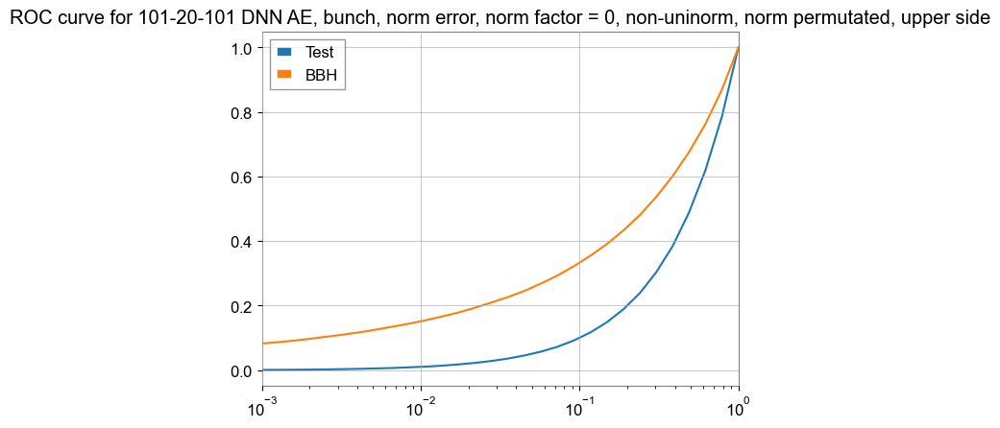

In [549]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')
# plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG')
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('ROC curve for 101-20-101 DNN AE, bunch, norm error, norm factor = 0, non-uninorm, norm permutated, upper side')

Text(0.5, 1.0, 'ROC curve for 101-20-101 DNN AE, bunch, norm error, norm factor = 0, non-uninorm, norm permutated, lower side')

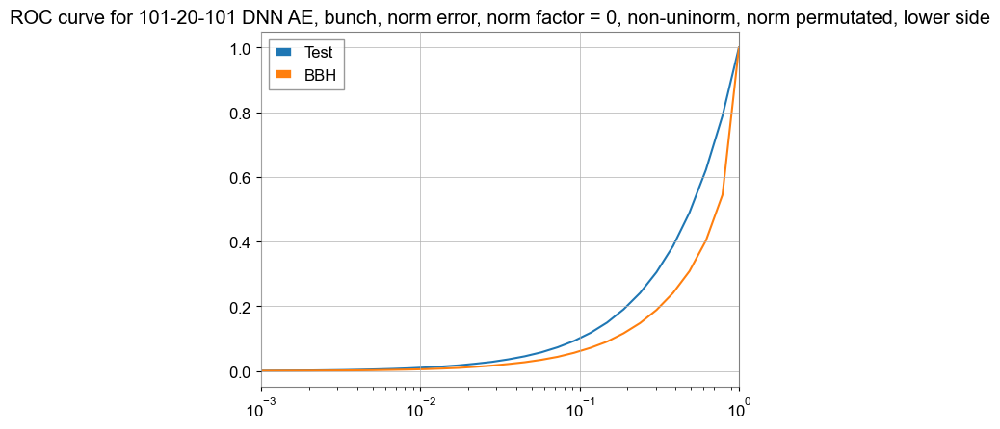

In [587]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')
# plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG')
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('ROC curve for 101-20-101 DNN AE, bunch, norm error, norm factor = 0, non-uninorm, norm permutated, lower side')

In [196]:
def FPR_mask(hist, FPR):
    hist_sorted = np.sort(hist, axis=None)

    total_hist_sum = hist_sorted.sum()
    threshold = int(FPR * total_hist_sum)

    sum = hist_sorted[0]
    i = 0
    while(sum < threshold):
        i += 1
        sum += hist_sorted[i]
    
    mask = np.argwhere(hist > hist_sorted[i])

    mask_Boolen = np.zeros((hist.shape[0], hist.shape[1]), dtype=bool)
    mask_Boolen[mask[:, 0], mask[:, 1]] = True

    return mask_Boolen


def Mask_and_TPR_computing(hist, mask):

    hist_masked = hist.copy()
    hist_masked[mask] = 0
    denominator = hist.sum()
    numerator = hist_masked.sum()

    print(numerator, denominator)

    return hist_masked, numerator/denominator

In [219]:
bins_x = np.arange(0, 0.02, 1e-4)
bins_y = np.logspace(-9, 0, num = 200)
FPR_list= np.logspace(-3,0,30)

In [194]:
TPR_100_test_list = []
TPR_100_BBH_list = []
TPR_100_SG_list = []
TPR_100_Glitches_list = []
# TPR_100_Glitches_real_list = []

In [197]:
hist, x_edges, y_edges = np.histogram2d(ReconstructedError_train_output_100d,ReconstructedError_train_output_1d, bins=[bins_x, bins_y])
hist_bunch_noise = hist

for FPR in FPR_list:
    mask = FPR_mask(hist_bunch_noise, FPR)

    hist_test, _, _ = np.histogram2d(ReconstructedError_test_output_100d,ReconstructedError_test_output_1d, bins=[bins_x, bins_y])
    hist_BBH, _, _ = np.histogram2d(ReconstructedError_injected_output_100d,ReconstructedError_injected_output_1d, bins=[bins_x, bins_y])
    hist_SG, _, _ = np.histogram2d(ReconstructedError_sinegaussian_output_100d,ReconstructedError_sinegaussian_output_1d, bins=[bins_x, bins_y])
    hist_Glitches, _, _ = np.histogram2d(ReconstructedError_glitches_output_100d,ReconstructedError_glitches_output_1d, bins=[bins_x, bins_y])
    # hist_Glitches_real, _, _ = np.histogram2d(ReconstructedError_glitches_real_output_100d,ReconstructedError_glitches_real_output_1d, bins=[bins_x, bins_y])

    _, TPR_test = Mask_and_TPR_computing(hist_test, mask)
    _, TPR_BBH = Mask_and_TPR_computing(hist_BBH, mask)
    _, TPR_SG = Mask_and_TPR_computing(hist_SG, mask)
    _, TPR_Glitches = Mask_and_TPR_computing(hist_Glitches, mask)
    # _, TPR_Glitches_real = Mask_and_TPR_computing(hist_Glitches_real, mask)

    TPR_100_test_list.append(TPR_test)
    TPR_100_BBH_list.append(TPR_BBH)
    TPR_100_SG_list.append(TPR_SG)
    TPR_100_Glitches_list.append(TPR_Glitches)
    # TPR_100_Glitches_real_list.append(TPR_Glitches_real)

97.0 19981.0
36919.0 99938.0
42359.0 99945.0
914.0 922.0
97.0 19981.0
36919.0 99938.0
42359.0 99945.0
914.0 922.0
97.0 19981.0
36919.0 99938.0
42359.0 99945.0
914.0 922.0
97.0 19981.0
36919.0 99938.0
42359.0 99945.0
914.0 922.0
148.0 19981.0
39069.0 99938.0
43727.0 99945.0
915.0 922.0
148.0 19981.0
39069.0 99938.0
43727.0 99945.0
915.0 922.0
148.0 19981.0
39069.0 99938.0
43727.0 99945.0
915.0 922.0
185.0 19981.0
40811.0 99938.0
44697.0 99945.0
916.0 922.0
185.0 19981.0
40811.0 99938.0
44697.0 99945.0
916.0 922.0
235.0 19981.0
42908.0 99938.0
46017.0 99945.0
917.0 922.0
304.0 19981.0
44689.0 99938.0
47894.0 99945.0
918.0 922.0
358.0 19981.0
45361.0 99938.0
48534.0 99945.0
918.0 922.0
386.0 19981.0
46275.0 99938.0
49138.0 99945.0
918.0 922.0
482.0 19981.0
48381.0 99938.0
50721.0 99945.0
919.0 922.0
592.0 19981.0
49886.0 99938.0
51851.0 99945.0
921.0 922.0
768.0 19981.0
53206.0 99938.0
53720.0 99945.0
922.0 922.0
943.0 19981.0
55074.0 99938.0
54790.0 99945.0
922.0 922.0
1198.0 19981.0
575

Text(0.5, 1.0, 'ROC curve for 101-20-101 DNN AE, pattern error-norm error, norm factor = 0, GWAK noise, rFFTed, absed, upper side')

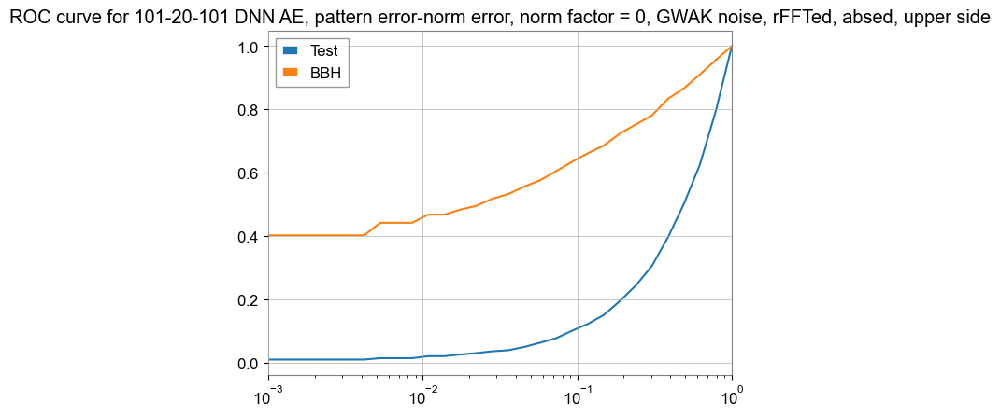

In [223]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd','#8c564b']

plt.plot(FPR_list, TPR_100_test_list, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_100_BBH_list, color = colors[1], label = 'BBH')
# plt.plot(FPR_list, TPR_100_SG_list, color = colors[2], label = 'SG')
# plt.plot(FPR_list, TPR_100_Glitches_list, color = colors[3], label = 'Simulated Glitches')
# plt.plot(FPR_list, TPR_100_Glitches_real_list, color = colors[4], label = 'Real Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('ROC curve for 101-20-101 DNN AE, pattern error-norm error, norm factor = 0, GWAK noise, rFFTed, absed, upper side')

Text(0.5, 1.0, '2D ROC curve for frequency series')

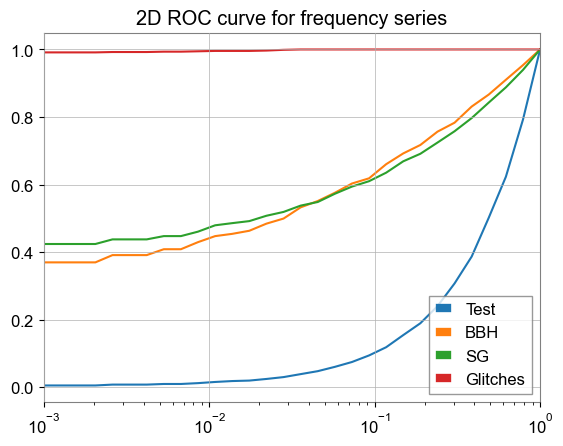

In [202]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd','#8c564b']

plt.plot(FPR_list, TPR_100_test_list, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_100_BBH_list, color = colors[1], label = 'BBH')
plt.plot(FPR_list, TPR_100_SG_list, color = colors[2], label = 'SG')
plt.plot(FPR_list, TPR_100_Glitches_list, color = colors[3], label = 'Glitches')
# plt.plot(FPR_list, TPR_100_Glitches_real_list, color = colors[4], label = 'Real Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
# plt.title('ROC curve for 101-20-101 DNN AE, pattern error-norm error, norm factor = 0, GWAK noise, rFFTed, absed, upper side')
plt.title('2D ROC curve for frequency series')